# Курсова робота: Динамічна система прогнозування ризику лісових пожеж

**Регіон дослідження:** лісова зона українського Полісся, окреслена через bounding box та полігони лісів OpenStreetMap (`landuse=forest`, `natural=wood`).

**Студенти:** ІП-42 Сітайло Ангеліна, ІП-41 Чередніченко Артем

**Технологічний стек:** Python 3, TensorFlow/Keras 2.x, scikit-learn, CatBoost, Open-Meteo API, NASA FIRMS (VIIRS/MODIS), GeoPandas/OSMnx.

**Структура роботи:** Фаза 1 (збір даних) → Фаза 2 (розвідувальний аналіз) → Фаза 3 (інженерія ознак) → Фаза 4 (моделювання та порівняння) → Фаза 5 (динамічний прогноз на актуальних даних).

**Методологічний принцип.** Погода збирається не для кількох вручну заданих міст, а для регулярної сітки точок усередині лісових полігонів Полісся. Далі дані агрегуються до рівня регіону за принципом **«1 рядок = 1 день для всієї лісової зони»**. Цільова змінна формується з пожежних детектувань NASA FIRMS. Кінцевий результат Фаз 1–3 — тривимірний тензор форми `[зразки, часові кроки, ознаки]`, придатний для рекурентної нейромережі.


## 0. Програмне середовище та залежності

Робота виконується у середовищі Google Colab. У цьому розділі встановлюються та імпортуються бібліотеки трьох категорій: (1) робота з геопросторовими даними — `geopandas`, `shapely`, `osmnx`, `folium`; (2) аналіз часових рядів та статистика — `statsmodels`, `scikit-learn`; (3) візуалізація — `matplotlib`, `seaborn`, `plotly`.

Окремо тут фіксується **зерно генератора випадкових чисел** (`RANDOM_STATE = 42`). Це забезпечує **відтворюваність результатів**: повторний запуск ноутбука дає ті самі розбиття вибірок, ті самі ваги моделей і, відповідно, ті самі метрики. Без фіксації зерна кожен запуск давав би дещо інші числа, що унеможливлює коректне порівняння моделей.


In [ ]:
!pip install --quiet folium plotly statsmodels tqdm scikit-learn geopandas shapely osmnx pyarrow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.4/104.4 kB 4.7 MB/s eta 0:00:00


### 0.1. Імпорти, конфігурація та відтворюваність

Нижче імпортуються всі бібліотеки, монтується Google Drive (для збереження кешу та проміжних файлів між сесіями) і визначається єдина точка конфігурації шляхів — `PROJECT_DIR`. Функція `set_seed()` централізовано фіксує зерно для модулів `random`, `numpy` та змінної середовища `PYTHONHASHSEED`; згодом, у Фазі 4, вона буде розширена для TensorFlow.


In [ ]:
# --- 1. Імпорт бібліотек та конфігурація середовища ---
import os
import sys
import json
import math
import random
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import requests
from datetime import datetime, timedelta
from tqdm.auto import tqdm

# Інструменти візуалізації даних
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

# Модулі для обробки геопросторових даних
import folium
from folium.plugins import HeatMap, MarkerCluster, MiniMap
import geopandas as gpd
import osmnx as ox
from shapely.geometry import Point, Polygon, MultiPolygon, box
from shapely.ops import unary_union

# Статистичні методи та аналіз часових рядів
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import STL
from sklearn.preprocessing import StandardScaler

# --- 2. Фіксація генераторів псевдовипадкових чисел (Відтворюваність) ---
RANDOM_STATE = 42

def set_seed(seed: int = RANDOM_STATE):
    """
    Фіксація базових генераторів псевдовипадкових чисел.
    Забезпечує детермінованість та відтворюваність обчислювальних експериментів.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)

set_seed(RANDOM_STATE)
# --- 3. Налаштування робочої директорії та підключення файлової системи ---
# Ініціалізація постійного сховища для кешування API та збереження артефактів моделі
try:
    from google.colab import drive
    drive.mount('/content/drive')
    PROJECT_DIR = '/content/drive/MyDrive/forest_fire_project'
except Exception:
    # Резервний шлях для локального виконання поза середовищем Google Colab
    PROJECT_DIR = './forest_fire_project'

os.makedirs(PROJECT_DIR, exist_ok=True)

# --- 4. Глобальні параметри візуалізації ---
sns.set_theme(style='whitegrid', palette='rocket')
plt.rcParams.update({
    'figure.figsize':   (14, 6),
    'font.size':        11,
    'axes.titlesize':   14,
    'axes.titleweight': 'bold',
    'axes.grid':        True,
    'grid.alpha':       0.3,
    'font.family':      'DejaVu Sans', # Забезпечення підтримки кириличних символів
})
pio.templates.default = 'plotly_white'

# --- 5. Налаштування параметрів запитів OSMnx ---
ox.settings.timeout = 300                 # Обмеження часу очікування запиту до Overpass API (у секундах)
ox.settings.overpass_rate_limit = True    # Автоматичне управління частотою запитів для запобігання блокуванню

# --- Вивід конфігураційної інформації ---
print(f"[Конфігурація] Версія NumPy: {np.__version__} | Версія Pandas: {pd.__version__}")
print(f"[Конфігурація] Значення зерна відтворюваності: {RANDOM_STATE}")
print(f"[Конфігурація] Робоча директорія проєкту: {PROJECT_DIR}")

Mounted at /content/drive
[Конфігурація] Версія NumPy: 2.0.2 | Версія Pandas: 2.2.2
[Конфігурація] Значення зерна відтворюваності: 42
[Конфігурація] Робоча директорія проєкту: /content/drive/MyDrive/forest_fire_project


## Фаза 1. Збір даних

**Джерела даних:**
1. **Open-Meteo Historical Weather API** — безкоштовний доступ до реаналізу ERA5: історичні погодні ряди з просторовою роздільністю ~25 км.
2. **OpenStreetMap / OSMnx** — векторні полігони лісів у межах bbox українського Полісся.
3. **NASA FIRMS** (сенсори VIIRS S-NPP/NOAA-20 та MODIS Aqua/Terra) — точки активного горіння, виявлені з супутників.

**Послідовність обробки:**
1. задається bounding box українського Полісся;
2. з OSM витягуються полігони лісів `landuse=forest` та `natural=wood`;
3. відкидаються дрібні об'єкти (парки, лісосмуги), залишаються великі масиви;
4. усередині лісової маски будується регулярна сітка точок;
5. для кожної точки сітки завантажується погода з Open-Meteo;
6. погода всіх точок усереднюється за датою — отримуємо регіональний ряд;
7. пожежні детектування FIRMS фільтруються за якістю та просторово обмежуються лісовою зоною;
8. погода й пожежі об'єднуються в єдиний регіональний денний датасет.

**Чому сітка точок, а не полігон.** Open-Meteo API приймає на вхід лише окрему координату, а не геометричну область. Тому «погода зони» апроксимується усередненням достатньо щільної сітки точок, кожна з яких відповідає окремій клітинці сітки ERA5.


### 1.1. Зона дослідження: bbox → лісові полігони → сітка точок

Спершу визначаються константи регіону (bounding box, період, параметри сітки) — і лише потім функції, що на них спираються. Лісові полігони кешуються на Google Drive у форматі GeoPackage: при повторному запуску вони читаються з диска за секунди, а не завантажуються з OSM повторно.

Перед об'єднанням полігонів (`unary_union`) їхня геометрія **спрощується** з допуском ~100 м. Це принципово: об'єднання десятків тисяч деталізованих полігонів вичерпує оперативну пам'ять Colab, тоді як спрощені полігони обробляються миттєво, а на масштабі всього Полісся втрата деталізації візуально непомітна.


In [ ]:
# --- ФАЗА 1.1. Визначення просторових меж дослідження та генерація координатної сітки ---

# 1. Визначення географічних параметрів регіону дослідження (Bounding Box)
POLISSYA_BBOX = {
    'lat_min': 50.5, 'lat_max': 52.5,   # Широта (Південь — Північ)
    'lon_min': 23.5, 'lon_max': 34.0,   # Довгота (Захід — Схід)
}
REGION_NAME = 'Polissya_forest_zone'
START_DATE  = '2016-01-01'
END_DATE    = '2025-12-31'
FIRE_SEASON_MONTHS = [3, 4, 5, 6, 7, 8, 9, 10]  # Період підвищеної пожежної небезпеки

# 2. Параметри просторової деталізації та фільтрації
STEP_DEG            = 0.5     # Крок просторової сітки у градусах
MIN_FOREST_AREA_KM2 = 2.0     # Мінімальна площа масиву (вилучення дрібних насаджень)
FOREST_BUFFER_M     = 500     # Буферна зона для врахування пожеж на узліссях (метри)
SIMPLIFY_TOL_DEG    = 0.001   # Толерантність спрощення геометрії для оптимізації пам'яті
USE_OSM_FOREST_MASK = True    # Активація використання точної лісової маски з OSM

# Локальне сховище геопросторових даних
FORESTS_FILE = f'{PROJECT_DIR}/polissia_forests.gpkg'

# --- Допоміжні функції просторового аналізу ---

def _flatten_polygons(geometries):
    """Декомпозиція структур MultiPolygon у плоский список валідних об'єктів Polygon."""
    out = []
    for geom in geometries:
        if geom is None or geom.is_empty or not geom.is_valid:
            continue
        if geom.geom_type == 'MultiPolygon':
            out.extend(p for p in geom.geoms
                       if p.is_valid and not p.is_empty and p.area > 0)
        elif geom.geom_type == 'Polygon' and geom.area > 0:
            out.append(geom)
    return out

def _split_tile(s, n, w, e, parts=4):
    """Декомпозиція координатної плитки на дрібніші сегменти для оптимізації запитів."""
    lats = np.linspace(s, n, parts + 1)
    lons = np.linspace(w, e, parts + 1)
    return [
        (float(lats[i]), float(lats[i + 1]), float(lons[j]), float(lons[j + 1]))
        for i in range(parts) for j in range(parts)
    ]

def fetch_osm_forest_polygons(bbox, min_area_km2=2.0, tiles_lat=6, tiles_lon=8):
    """
    Завантаження полігонів лісових масивів з бази OpenStreetMap (Overpass API).
    Використовується метод тайлового завантаження для уникнення тайм-аутів сервера.
    """
    lat_edges = np.linspace(bbox['lat_min'], bbox['lat_max'], tiles_lat + 1)
    lon_edges = np.linspace(bbox['lon_min'], bbox['lon_max'], tiles_lon + 1)
    tiles = [
        (float(lat_edges[i]), float(lat_edges[i + 1]),
         float(lon_edges[j]), float(lon_edges[j + 1]))
        for i in range(tiles_lat) for j in range(tiles_lon)
    ]
    tags = {'landuse': 'forest', 'natural': 'wood'}
    all_polys, failed = [], []

    # Первинне завантаження макроблоками
    for s, n, w, e in tqdm(tiles, desc='Завантаження OSM'):
        try:
            gdf = ox.features_from_polygon(box(w, s, e, n), tags=tags)
            gdf = gdf[gdf.geometry.geom_type.isin(['Polygon', 'MultiPolygon'])]
            all_polys.extend(_flatten_polygons(gdf.geometry))
        except Exception as ex:
            failed.append((s, n, w, e))
            tqdm.write(f'[Помилка] Тайм-аут плитки {s:.2f}-{n:.2f},{w:.2f}-{e:.2f}. Заплановано декомпозицію.')

    # Вторинне завантаження проблемних зон із застосуванням декомпозиції
    if failed:
        sub = [st for t in failed for st in _split_tile(*t, parts=4)]
        for s, n, w, e in tqdm(sub, desc='Повторний запит OSM'):
            try:
                gdf = ox.features_from_polygon(box(w, s, e, n), tags=tags)
                gdf = gdf[gdf.geometry.geom_type.isin(['Polygon', 'MultiPolygon'])]
                all_polys.extend(_flatten_polygons(gdf.geometry))
            except Exception:
                pass

    if not all_polys:
        raise RuntimeError('[Помилка] Overpass API не повернув просторових даних.')

    forests = gpd.GeoDataFrame(geometry=all_polys, crs='EPSG:4326')

    # Обчислення площі у метричній системі координат (UTM 36N)
    forests['area_km2'] = forests.to_crs('EPSG:32636').geometry.area / 1e6
    forests_large = (
        forests[forests['area_km2'] >= min_area_km2]
        .copy().reset_index(drop=True)
    )

    if forests_large.empty:
        raise RuntimeError('[Помилка] Після фільтрації за мінімальною площею масивів не знайдено.')
    return forests_large

def build_bbox_grid(bbox, step_deg=0.5):
    """Альтернативний метод: генерація регулярної координатної сітки в межах Bounding Box."""
    lats = np.arange(bbox['lat_min'], bbox['lat_max'] + 1e-9, step_deg)
    lons = np.arange(bbox['lon_min'], bbox['lon_max'] + 1e-9, step_deg)
    return {
        f'bbox_{lat:.3f}_{lon:.3f}': (round(float(lat), 3), round(float(lon), 3))
        for lat in lats for lon in lons
    }

def build_forest_grid(forest_union_geom, bbox, step_deg=0.5, min_points=15, buffer_m=2000):
    """
    Генерація координатної сітки виключно в межах лісових масивів та адміністративних кордонів України.
    """
    try:
        ukr_poly = ox.geocode_to_gdf('Ukraine').geometry.iloc[0]
    except Exception:
        ukr_poly = None
        print('[Попередження] Адміністративні кордони недоступні. Фільтрація відбудеться лише за лісовою маскою.')

    grid_lats = np.arange(bbox['lat_min'], bbox['lat_max'] + 1e-6, step_deg)
    grid_lons = np.arange(bbox['lon_min'], bbox['lon_max'] + 1e-6, step_deg)

    def collect(mask_geom):
        pts = []
        for lat in grid_lats:
            for lon in grid_lons:
                p = Point(lon, lat)
                in_forest = mask_geom.contains(p)
                in_ukraine = True if ukr_poly is None else ukr_poly.contains(p)
                if in_forest and in_ukraine:
                    pts.append((round(float(lat), 3), round(float(lon), 3)))
        return pts

    points = collect(forest_union_geom)

    # Розширення зони пошуку (буферизація) у разі недостатньої кількості розрахункових точок
    if len(points) < min_points:
        print(f'[Інформація] Недостатня щільність точок ({len(points)}). Застосування просторового буфера {buffer_m} м.')
        forest_buf = (
            gpd.GeoSeries([forest_union_geom], crs='EPSG:4326')
            .to_crs('EPSG:32636').buffer(buffer_m)
            .to_crs('EPSG:4326').iloc[0]
        )
        points = collect(forest_buf)

    return {f'forest_{lat:.3f}_{lon:.3f}': (lat, lon) for lat, lon in points}


# --- Виконання етапу просторового моделювання ---

forests_large = gpd.GeoDataFrame(geometry=[], crs='EPSG:4326')
forest_union = None

if USE_OSM_FOREST_MASK:
    try:
        if os.path.exists(FORESTS_FILE):
            print(f'[Процес] Завантаження векторних даних з локального кешу...')
            forests_large = gpd.read_file(FORESTS_FILE)
        else:
            print('[Процес] Локальний кеш відсутній. Ініціалізація завантаження з OSM...')
            forests_large = fetch_osm_forest_polygons(POLISSYA_BBOX, min_area_km2=MIN_FOREST_AREA_KM2)
            forests_large.to_file(FORESTS_FILE, driver='GPKG')
            print(f'[Інформація] Просторовий масив успішно збережено: {FORESTS_FILE}')

        # Оптимізація геометрії для зменшення навантаження на оперативну пам'ять
        forests_large['geometry'] = forests_large.geometry.simplify(SIMPLIFY_TOL_DEG, preserve_topology=True)
        forests_large = forests_large[
            forests_large.geometry.is_valid & ~forests_large.geometry.is_empty
        ].reset_index(drop=True)

        # Консолідація ізольованих полігонів у єдину геометричну структуру
        forest_union = unary_union(forests_large.geometry.tolist())
        forest_area_union_km2 = (
            gpd.GeoSeries([forest_union], crs='EPSG:4326')
            .to_crs('EPSG:32636').area.iloc[0] / 1e6
        )

        POLISSYA_POINTS = build_forest_grid(forest_union, POLISSYA_BBOX, step_deg=STEP_DEG)

        print(f"[Статистика] Кількість лісових масивів (>= {MIN_FOREST_AREA_KM2} км²): {len(forests_large):,}")
        print(f"[Статистика] Сумарна площа консолідованої маски: {forest_area_union_km2:,.0f} км²")

    except Exception as ex:
        print(f'[Помилка] Формування маски OSM перервано: {ex}')
        print('[Інформація] Активація альтернативного методу: регулярна сітка Bounding Box.')
        POLISSYA_POINTS = build_bbox_grid(POLISSYA_BBOX, step_deg=STEP_DEG)
else:
    POLISSYA_POINTS = build_bbox_grid(POLISSYA_BBOX, step_deg=STEP_DEG)

if not POLISSYA_POINTS:
    raise RuntimeError('[Помилка] Масив розрахункових точок порожній. Перевірте параметри Bounding Box або крок сітки.')

print(f"\n[Підсумок Фази 1.1] Згенеровано точок для метеорологічного моніторингу: {len(POLISSYA_POINTS)}")
print(f"[Підсумок Фази 1.1] Досліджуваний часовий період: {START_DATE} — {END_DATE}")

# Демонстрація фрагмента згенерованої сітки
list(POLISSYA_POINTS.items())[:5]

[Процес] Завантаження векторних даних з локального кешу...
[Статистика] Кількість лісових масивів (>= 2.0 км²): 4,145
[Статистика] Сумарна площа консолідованої маски: 58,276 км²

[Підсумок Фази 1.1] Згенеровано точок для метеорологічного моніторингу: 19
[Підсумок Фази 1.1] Досліджуваний часовий період: 2016-01-01 — 2025-12-31


[('forest_50.500_29.500', (50.5, 29.5)),
 ('forest_50.500_30.000', (50.5, 30.0)),
 ('forest_51.000_24.000', (51.0, 24.0)),
 ('forest_51.000_26.500', (51.0, 26.5)),
 ('forest_51.000_27.000', (51.0, 27.0))]

### 1.2. Завантаження погодних даних з Open-Meteo

Цей блок визначає функції завантаження погоди. Ключові інженерні рішення:

- **Пакетні запити (batching).** Open-Meteo дозволяє передати кілька координат в одному запиті, що зменшує кількість звернень до API у `batch_size` разів.
- **Розбиття на роки (chunking).** Період 2016–2025 розбивається на річні відрізки — це знижує ризик таймауту при завантаженні великих діапазонів.
- **Кешування у Parquet.** Кожен завантажений відрізок зберігається на Drive; повторний запуск читає його з диска, а не звертається до API.
- **Експоненціальна затримка (backoff).** При відповіді `429 Too Many Requests` час очікування подвоюється — це коректна поведінка щодо публічного API.

Окрема функція `aggregate_weather_to_region` усереднює погоду всіх точок сітки за датою. Напрямок вітру при цьому усереднюється **циркулярно** (через синус/косинус), бо звичайне арифметичне середнє кутів некоректне (напр., середнє між 350° і 10° має дорівнювати 0°, а не 180°).


In [ ]:
# --- ФАЗА 1.2. Отримання метеорологічних даних: пакетне завантаження (Batching) та кешування ---

import os
import time
import hashlib
import json
import gc
import requests
import pandas as pd
import numpy as np
from tqdm.auto import tqdm

# Ініціалізація постійного сховища у Google Drive для запобігання втрати даних після завершення сесії
try:
    from google.colab import drive
    drive.mount('/content/drive')
    CACHE_DIR = '/content/drive/MyDrive/openmeteo_cache_polissya_batched'
except Exception:
    CACHE_DIR = '/content/openmeteo_cache_polissya_batched'

os.makedirs(CACHE_DIR, exist_ok=True)
print(f"[Ініціалізація] Директорія кешування метеоданих: {CACHE_DIR}")

# Визначення переліку метеорологічних предикторів
DAILY_VARS = [
    'temperature_2m_max',
    'temperature_2m_min',
    'temperature_2m_mean',
    'apparent_temperature_max',
    'apparent_temperature_min',
    'precipitation_sum',
    'rain_sum',
    'precipitation_hours',
    'wind_speed_10m_max',
    'wind_gusts_10m_max',
    'wind_direction_10m_dominant',
    'shortwave_radiation_sum',
    'et0_fao_evapotranspiration',
    'sunshine_duration',
]

HOURLY_VARS = [
    'relative_humidity_2m',
    'dew_point_2m',
    'surface_pressure',
    'soil_moisture_0_to_7cm',
    'soil_temperature_0_to_7cm',
    'vapour_pressure_deficit',
]

def make_year_chunks(start_date: str, end_date: str):
    """Декомпозиція загального часового періоду на річні інтервали для оптимізації запитів."""
    start_ts = pd.to_datetime(start_date)
    end_ts = pd.to_datetime(end_date)

    chunks = []
    cur = start_ts
    while cur <= end_ts:
        ch_end = min(pd.Timestamp(cur.year, 12, 31), end_ts)
        chunks.append((cur.strftime('%Y-%m-%d'), ch_end.strftime('%Y-%m-%d')))
        cur = ch_end + pd.Timedelta(days=1)
    return chunks

def split_dict_into_batches(d: dict, batch_size: int = 2):
    """Секторування словника просторових точок на пакети (батчі)."""
    items = list(d.items())
    for i in range(0, len(items), batch_size):
        yield dict(items[i:i + batch_size])

def make_cache_name(points_batch: dict, ch_start: str, ch_end: str) -> str:
    """Генерація унікального ідентифікатора (хешу) кеш-файлу на основі параметрів запиту."""
    payload = {
        'points': points_batch,
        'start': ch_start,
        'end': ch_end,
        'daily': DAILY_VARS,
        'hourly': HOURLY_VARS,
    }
    raw = json.dumps(payload, sort_keys=True, ensure_ascii=False)
    h = hashlib.md5(raw.encode('utf-8')).hexdigest()[:12]
    return f'openmeteo_{ch_start}_{ch_end}_{h}.parquet'

def parse_one_location_response(resp: dict, location_name: str, lat: float, lon: float) -> pd.DataFrame:
    """
    Трансформація JSON-відповіді Open-Meteo у структуру DataFrame.
    Виконує агрегацію годинних вимірів до добового формату за допомогою статистичних функцій (mean, min, max).
    """
    if 'daily' not in resp or 'hourly' not in resp:
        raise ValueError(f"[Помилка] Відповідь Open-Meteo для локації {location_name} не містить необхідних структур (daily/hourly).")

    # Обробка добових показників
    df_daily = pd.DataFrame(resp['daily'])
    df_daily['time'] = pd.to_datetime(df_daily['time'])
    df_daily = df_daily.rename(columns={'time': 'date'})

    # Агрегація годинних показників
    df_hourly = pd.DataFrame(resp['hourly'])
    df_hourly['time'] = pd.to_datetime(df_hourly['time'])
    df_hourly['date'] = df_hourly['time'].dt.normalize()

    agg = {
        'relative_humidity_2m': ['mean', 'min', 'max'],
        'dew_point_2m': 'mean',
        'surface_pressure': 'mean',
        'soil_moisture_0_to_7cm': 'mean',
        'soil_temperature_0_to_7cm': ['mean', 'max'],
        'vapour_pressure_deficit': ['mean', 'max'],
    }
    existing_agg = {k: v for k, v in agg.items() if k in df_hourly.columns}
    hourly_agg = df_hourly.groupby('date').agg(existing_agg)
    hourly_agg.columns = [
        '_'.join([x for x in col if x]).strip('_')
        for col in hourly_agg.columns
    ]
    hourly_agg = hourly_agg.reset_index()

    out = df_daily.merge(hourly_agg, on='date', how='left')
    out.insert(0, 'location', location_name)
    out['latitude'] = lat
    out['longitude'] = lon

    return out

def fetch_open_meteo_batch(points_batch: dict,
                           start_date: str,
                           end_date: str,
                           retries: int = 8) -> pd.DataFrame:
    """Пакетне завантаження метеорологічних даних для масиву координат із вбудованим механізмом повторних спроб."""
    base_url = 'https://archive-api.open-meteo.com/v1/archive'

    names = list(points_batch.keys())
    lats = [points_batch[name][0] for name in names]
    lons = [points_batch[name][1] for name in names]

    params = {
        'latitude': ','.join(map(str, lats)),
        'longitude': ','.join(map(str, lons)),
        'start_date': start_date,
        'end_date': end_date,
        'daily': ','.join(DAILY_VARS),
        'hourly': ','.join(HOURLY_VARS),
        'timezone': 'Europe/Kyiv',
        'wind_speed_unit': 'kmh',
    }

    backoff = 20
    for attempt in range(retries):
        try:
            response = requests.get(base_url, params=params, timeout=180)

            if response.status_code == 429:
                wait = int(response.headers.get('Retry-After', backoff))
                print(f"[Увага] Перевищено ліміт запитів (HTTP 429) для {start_date[:4]}. Очікування: {wait} с. (Спроба {attempt + 1}/{retries})")
                time.sleep(wait)
                backoff = min(backoff * 2, 300)
                continue

            response.raise_for_status()
            data = response.json()

            # Уніфікація формату відповіді (перетворення одиничного словника на список)
            if isinstance(data, dict):
                data = [data]

            if len(data) != len(names):
                print(f"[Попередження] Невідповідність об'єму даних: отримано {len(data)} масивів для {len(names)} просторових точок.")

            frames = []
            for i, resp in enumerate(data):
                name = names[i]
                lat = lats[i]
                lon = lons[i]
                frames.append(parse_one_location_response(resp, name, lat, lon))

            result = pd.concat(frames, ignore_index=True)
            del data, frames
            gc.collect()
            return result

        except requests.exceptions.RequestException as ex:
            if attempt == retries - 1:
                raise RuntimeError(f"[Помилка] Фатальний збій завантаження пакета {start_date} — {end_date}: {ex}")
            print(f"[Мережева помилка] Запит для {start_date[:4]} відхилено: {ex}. Очікування {backoff} с...")
            time.sleep(backoff)
            backoff = min(backoff * 2, 300)

    raise RuntimeError(f"[Помилка] Вичерпано спроби завантаження пакета {start_date} — {end_date}")

def fetch_polissya_weather_batched(points: dict,
                                   start_date: str,
                                   end_date: str,
                                   batch_size: int = 2,
                                   sleep_between_requests: int = 60,
                                   cache_dir: str = CACHE_DIR) -> pd.DataFrame:
    """Комплексний метод завантаження даних Open-Meteo із застосуванням пакетної обробки та файлового кешування."""
    all_frames = []
    year_chunks = make_year_chunks(start_date, end_date)
    batches = list(split_dict_into_batches(points, batch_size=batch_size))

    print(f"[Статистика] Кількість просторових точок: {len(points)}")
    print(f"[Статистика] Кількість пакетів (batch): {len(batches)}")
    print(f"[Статистика] Кількість річних інтервалів: {len(year_chunks)}")
    print(f"[Статистика] Загальна кількість запланованих API-запитів: {len(batches) * len(year_chunks)}")

    for batch_idx, points_batch in enumerate(tqdm(batches, desc='Завантаження пакетів Open-Meteo')):
        print(f"\n[Процес] Пакет {batch_idx + 1}/{len(batches)}: {list(points_batch.keys())}")

        for ch_start, ch_end in year_chunks:
            cache_name = make_cache_name(points_batch, ch_start, ch_end)
            cache_path = os.path.join(cache_dir, cache_name)

            if os.path.exists(cache_path):
                df = pd.read_parquet(cache_path)
                print(f"  [Кеш] Знайдено дані за {ch_start[:4]} (записів: {len(df)})")
            else:
                print(f"  [API] Виконання запиту за період: {ch_start} — {ch_end}")
                df = fetch_open_meteo_batch(points_batch, ch_start, ch_end, retries=8)
                df.to_parquet(cache_path, index=False)
                print(f"  [Збереження] Файл {cache_name} збережено (записів: {len(df)})")
                time.sleep(sleep_between_requests)

            all_frames.append(df)
            gc.collect()

    result = (
        pd.concat(all_frames, ignore_index=True)
        .drop_duplicates(subset=['location', 'date'])
        .sort_values(['location', 'date'])
        .reset_index(drop=True)
    )
    return result

# Адаптер для сумісності з попередніми версіями архітектури
def fetch_polissya_weather(points: dict,
                           start_date: str,
                           end_date: str,
                           sleep_between_points: int = 60,
                           cache_dir: str = CACHE_DIR) -> pd.DataFrame:
    return fetch_polissya_weather_batched(
        points,
        start_date,
        end_date,
        batch_size=2,
        sleep_between_requests=sleep_between_points,
        cache_dir=cache_dir,
    )

def _circular_mean_deg(values: pd.Series) -> float:
    """Обчислення середнього значення напрямку вітру (кругова статистика) у градусах."""
    values = values.dropna()
    if values.empty:
        return np.nan
    radians = np.deg2rad(values.astype(float))
    mean_angle = np.arctan2(np.sin(radians).mean(), np.cos(radians).mean())
    return float((np.rad2deg(mean_angle) + 360) % 360)

def aggregate_weather_to_region(point_weather_df: pd.DataFrame,
                                region_name: str = REGION_NAME) -> pd.DataFrame:
    """
    Агрегація точкових метеорологічних вимірів у макрорегіональний добовий профіль.
    Генерує класичні середні показники та екстремальні регіональні предиктори (_reg_max, _reg_min).
    """
    df = point_weather_df.copy()
    df['date'] = pd.to_datetime(df['date'])

    exclude = {'location', 'date', 'latitude', 'longitude'}
    numeric_cols = [
        c for c in df.columns
        if c not in exclude and pd.api.types.is_numeric_dtype(df[c])
    ]

    direction_col = 'wind_direction_10m_dominant'
    mean_cols = [c for c in numeric_cols if c != direction_col]

    # 1. Агрегація середніх значень
    region = df.groupby('date')[mean_cols].mean().reset_index()

    # 2. Агрегація аеродинамічного напрямку
    if direction_col in df.columns:
        wind_dir = (
            df.groupby('date')[direction_col]
              .apply(_circular_mean_deg)
              .rename(direction_col)
              .reset_index()
        )
        region = region.merge(wind_dir, on='date', how='left')

    # 3. Виділення екстремальних значень для оцінки пожежного ризику
    max_risk_cols = [
        'temperature_2m_max',
        'temperature_2m_mean',
        'apparent_temperature_max',
        'wind_speed_10m_max',
        'wind_gusts_10m_max',
        'shortwave_radiation_sum',
        'et0_fao_evapotranspiration',
        'soil_temperature_0_to_7cm_mean',
        'soil_temperature_0_to_7cm_max',
        'vapour_pressure_deficit_mean',
        'vapour_pressure_deficit_max',
    ]
    min_risk_cols = [
        'relative_humidity_2m_mean',
        'relative_humidity_2m_min',
        'precipitation_sum',
        'rain_sum',
        'soil_moisture_0_to_7cm_mean',
    ]

    for col in max_risk_cols:
        if col in df.columns:
            region[f'{col}_reg_max'] = df.groupby('date')[col].max().values

    for col in min_risk_cols:
        if col in df.columns:
            region[f'{col}_reg_min'] = df.groupby('date')[col].min().values

    region.insert(1, 'location', region_name)
    region['latitude'] = df['latitude'].mean() if 'latitude' in df.columns else np.nan
    region['longitude'] = df['longitude'].mean() if 'longitude' in df.columns else np.nan

    # Інтерполяція пропущених значень у часовому ряді
    region = region.sort_values('date').set_index('date')
    num_cols = [c for c in region.columns if pd.api.types.is_numeric_dtype(region[c])]
    region[num_cols] = region[num_cols].interpolate('linear', limit_direction='both')
    region = region.reset_index()

    return region

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Ініціалізація] Директорія кешування метеоданих: /content/drive/MyDrive/openmeteo_cache_polissya_batched


### 1.2.1. Виконання: завантаження та регіональна агрегація погоди

Викликаються функції, визначені вище. Результат проходить два рівні:
`weather_points_df` — «довга» таблиця (дата × точка сітки), і `weather_df` — регіональний ряд, де **один рядок відповідає одному дню для всієї лісової зони Полісся**. Великий точковий DataFrame після агрегації видаляється з пам'яті, щоб звільнити RAM.


In [ ]:
# --- ФАЗА 1.3. Завантаження метеоданих за координатною сіткою та макрорегіональна агрегація ---

# 1. Виконання пакетного завантаження даних для кожної просторової точки
# Структура: багатовимірний масив (дата × точка сітки)
weather_points_df = fetch_polissya_weather_batched(
    POLISSYA_POINTS,
    START_DATE,
    END_DATE,
    batch_size=2,
    sleep_between_requests=45,
    cache_dir=CACHE_DIR,
)

print("\n[Статистика] Точкові метеорологічні дані успішно завантажено:")
print(f"  Розмірність масиву:           {weather_points_df.shape}")
print(f"  Кількість унікальних точок:   {weather_points_df['location'].nunique()}")
print(f"  Хронологічний діапазон:       {weather_points_df['date'].min().date()} — {weather_points_df['date'].max().date()}")

# 2. Просторова агрегація точкових вимірів у єдиний макрорегіональний профіль
# Структура: 1 запис = 1 доба для всієї лісової зони Полісся
weather_df = aggregate_weather_to_region(weather_points_df, REGION_NAME)

print("\n[Статистика] Регіональна агрегація успішно завершена:")
print(f"  Розмірність масиву:           {weather_df.shape}")
print(f"  Ідентифікатор локації:        {weather_df['location'].iloc[0]}")
print(f"  Хронологічний діапазон:       {weather_df['date'].min().date()} — {weather_df['date'].max().date()}")

# 3. Експорт результатів для подальшого використання (збереження у директорію проєкту)
weather_points_df.to_parquet(f'{PROJECT_DIR}/polissya_weather_points_daily.parquet', index=False)
weather_df.to_csv(f'{PROJECT_DIR}/polissya_weather_region_daily.csv', index=False)

# 4. Оптимізація використання оперативної пам'яті (RAM)
# Вилучення масивного первинного DataFrame після завершення агрегації
del weather_points_df
gc.collect()

# Демонстрація фрагмента агрегованого набору даних
weather_df.head()

[Статистика] Кількість просторових точок: 19
[Статистика] Кількість пакетів (batch): 10
[Статистика] Кількість річних інтервалів: 10
[Статистика] Загальна кількість запланованих API-запитів: 100


Завантаження пакетів Open-Meteo:   0%|          | 0/10 [00:00<?, ?it/s]


[Процес] Пакет 1/10: ['forest_50.500_29.500', 'forest_50.500_30.000']
  [Кеш] Знайдено дані за 2016 (записів: 732)
  [Кеш] Знайдено дані за 2017 (записів: 730)
  [Кеш] Знайдено дані за 2018 (записів: 730)
  [Кеш] Знайдено дані за 2019 (записів: 730)
  [Кеш] Знайдено дані за 2020 (записів: 732)
  [Кеш] Знайдено дані за 2021 (записів: 730)
  [Кеш] Знайдено дані за 2022 (записів: 730)
  [Кеш] Знайдено дані за 2023 (записів: 730)
  [Кеш] Знайдено дані за 2024 (записів: 732)
  [Кеш] Знайдено дані за 2025 (записів: 730)

[Процес] Пакет 2/10: ['forest_51.000_24.000', 'forest_51.000_26.500']
  [Кеш] Знайдено дані за 2016 (записів: 732)
  [Кеш] Знайдено дані за 2017 (записів: 730)
  [Кеш] Знайдено дані за 2018 (записів: 730)
  [Кеш] Знайдено дані за 2019 (записів: 730)
  [Кеш] Знайдено дані за 2020 (записів: 732)
  [Кеш] Знайдено дані за 2021 (записів: 730)
  [Кеш] Знайдено дані за 2022 (записів: 730)
  [Кеш] Знайдено дані за 2023 (записів: 730)
  [Кеш] Знайдено дані за 2024 (записів: 732)
  [

,date,location,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,precipitation_hours,...,soil_temperature_0_to_7cm_max_reg_max,vapour_pressure_deficit_mean_reg_max,vapour_pressure_deficit_max_reg_max,relative_humidity_2m_mean_reg_min,relative_humidity_2m_min_reg_min,precipitation_sum_reg_min,rain_sum_reg_min,soil_moisture_0_to_7cm_mean_reg_min,latitude,longitude
0,2016-01-01,Polissya_forest_zone,-7.778947,-12.247368,-9.810526,-13.136842,-17.363158,0.000000,0.0,0.000000,...,-1.1,0.116250,0.20,59.833333,45,0.0,0.0,0.338125,51.315789,28.157895
1,2016-01-02,Polissya_forest_zone,-10.952632,-14.715789,-12.973684,-16.352632,-20.342105,0.000000,0.0,0.000000,...,-1.6,0.114583,0.17,57.166667,49,0.0,0.0,0.336458,51.315789,28.157895
2,2016-01-03,Polissya_forest_zone,-12.326316,-16.168421,-14.247368,-17.136842,-20.857895,0.000000,0.0,0.000000,...,-2.2,0.104167,0.15,55.875000,47,0.0,0.0,0.335250,51.315789,28.157895
3,2016-01-04,Polissya_forest_zone,-11.689474,-16.584211,-14.263158,-17.068421,-21.900000,0.000000,0.0,0.000000,...,-2.9,0.105000,0.16,55.208333,45,0.0,0.0,0.334292,51.315789,28.157895
4,2016-01-05,Polissya_forest_zone,-8.400000,-13.831579,-11.189474,-13.315789,-19.257895,0.221053,0.0,1.421053,...,-2.5,0.107083,0.15,65.875000,61,0.0,0.0,0.334000,51.315789,28.157895


### 1.3. Пожежні детектування NASA FIRMS

NASA FIRMS надає точки активного горіння, виявлені сенсорами VIIRS (роздільність 375 м) та MODIS (1 км). Для архівних даних використовуються джерела з суфіксом `_SP` (Standard Processing).

**Доступ до API.** Сервіс вимагає безкоштовний `MAP_KEY`. **Ключ не зберігається в коді** — його додаємо у Colab Secrets з іменем `FIRMS_MAP_KEY`.

**Конвеєр обробки:** завантаження по 5-денних відрізках із трьох сенсорів → фільтр якості (bbox, впевненість детектування, яскравість, лише денні спостереження) → просторовий фільтр у лісову маску → агрегація по датах → злиття з погодою.

**Цільові змінні.** Формуються три мітки: `fire_occurred` (будь-яка активність), `significant_fire` (значна активність: ≥5 пікселів або сумарний FRP ≥100 МВт) та `fire_risk_level` (три рівні 0/1/2). Основною ціллю для моделювання обрано `significant_fire`, оскільки `fire_occurred` надто чутлива до одиничних хибних детектувань.


In [ ]:
# --- ФАЗА 1.3. Отримання даних моніторингу пожеж (NASA FIRMS), нормалізація та просторова агрегація ---

import os
import io
import time
import glob
import requests
import pandas as pd
import numpy as np
from tqdm.auto import tqdm

# --- 1. Ініціалізація доступу до API та конфігурація джерел ---

# Завантаження ключа доступу (API Key) з безпечного середовища (Colab Secrets або змінні середовища)
try:
    from google.colab import userdata
    FIRMS_MAP_KEY = userdata.get('FIRMS_MAP_KEY')
except Exception:
    FIRMS_MAP_KEY = os.environ.get('FIRMS_MAP_KEY', '')

FIRMS_MAP_KEY = (FIRMS_MAP_KEY or '').strip()
if not FIRMS_MAP_KEY:
    raise RuntimeError(
        '[Помилка] Ключ доступу FIRMS_MAP_KEY не знайдено. '
        'Забезпечте наявність валідного ключа в середовищі виконання.'
    )

# Форматування географічних меж для запиту до API FIRMS ("west,south,east,north")
FIRMS_AREA = (f"{POLISSYA_BBOX['lon_min']},{POLISSYA_BBOX['lat_min']},"
              f"{POLISSYA_BBOX['lon_max']},{POLISSYA_BBOX['lat_max']}")

# Дати введення в експлуатацію супутникових інструментів (для архівних запитів)
SOURCE_AVAILABLE_FROM = {
    'MODIS_SP':        '2000-11-01',
    'VIIRS_SNPP_SP':   '2012-01-20',
    'VIIRS_NOAA20_SP': '2018-04-01',
}

FIRMS_CACHE_DIR = '/content/drive/MyDrive/firms_polissya_cache'

# --- 2. Допоміжні функції (Утиліти обробки) ---

def check_firms_key(map_key: str) -> bool:
    """Верифікація валідності ключа доступу до API NASA FIRMS."""
    test_url = (f"https://firms.modaps.eosdis.nasa.gov/api/area/csv/"
                f"{map_key}/MODIS_SP/-10,40,-5,45/1/2020-08-15")
    try:
        r = requests.get(test_url, timeout=30)
        txt = r.text.strip()
        if r.status_code == 200 and not txt.lower().startswith('invalid'):
            print(f"[Успіх] Ключ API валідний. Отримано тестову відповідь (рядків: {len(txt.splitlines())}).")
            return True
        print(f"[Помилка] Статус {r.status_code}. Відповідь сервера: {txt[:200]}")
        return False
    except Exception as e:
        print(f"[Помилка] Збій під час верифікації ключа: {e}")
        return False

def _normalize_firms_dtypes(df: pd.DataFrame) -> pd.DataFrame:
    """
    Нормалізація типів даних для сумісності з форматом Parquet.
    Виконує узгодження строкових та числових типів між даними сенсорів VIIRS та MODIS.
    """
    if df.empty:
        return df
    df = df.copy()

    # Нормалізація категоріальних та текстових атрибутів
    text_cols = ['confidence', 'satellite', 'instrument', 'version', 'daynight', 'type', 'source']
    for col in text_cols:
        if col in df.columns:
            df[col] = df[col].astype(str)

    # Нормалізація кількісних параметрів
    num_cols = ['latitude', 'longitude', 'brightness', 'bright_ti4', 'bright_ti5',
                'bright_t31', 'scan', 'track', 'frp']
    for col in num_cols:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce')
    return df

def _is_good_confidence(val) -> bool:
    """Уніфікований логічний фільтр достовірності детектування (Confidence)."""
    s = str(val).strip().lower()
    if s in {'nominal', 'high', 'n', 'h'}:
        return True
    try:
        return float(s) >= 70
    except (ValueError, TypeError):
        return False

# --- 3. Модуль отримання даних (Fetcher) ---

def fetch_firms_chunked(map_key: str, source: str, area: str,
                        start_date: str, end_date: str,
                        chunk_days: int = 5,
                        cache_path: str | None = None) -> pd.DataFrame:
    """
    Ітеративне завантаження архівних даних FIRMS блоками (за замовчуванням 5 діб).
    Підтримує механізм інкрементального кешування для відновлення після збоїв.
    """
    src_start = pd.to_datetime(SOURCE_AVAILABLE_FROM.get(source, start_date))
    start = max(pd.to_datetime(start_date), src_start)
    end   = pd.to_datetime(end_date)

    if start > end:
        print(f"  [Інформація] {source}: Відсутній перетин з періодом {start_date} — {end_date}.")
        return pd.DataFrame()

    already_have = pd.DataFrame()
    if cache_path and os.path.exists(cache_path):
        try:
            already_have = pd.read_parquet(cache_path)
            if 'acq_date' in already_have.columns and len(already_have) > 0:
                last_date = pd.to_datetime(already_have['acq_date']).max()
                if last_date >= end:
                    print(f"  [Кеш] {source}: Виявлено повний набір даних (рядків: {len(already_have):,}).")
                    return already_have
                start = max(start, last_date + pd.Timedelta(days=1))
                print(f"  [Відновлення] {source}: Продовження завантаження з {start.date()} (наявно: {len(already_have):,}).")
        except Exception as e:
            print(f"  [Помилка] Пошкоджений кеш {cache_path}: {e}. Ініціалізація нового завантаження.")
            already_have = pd.DataFrame()

    chunks, cur = [], start
    while cur <= end:
        ch_end = min(cur + pd.Timedelta(days=chunk_days - 1), end)
        chunks.append((cur, ch_end))
        cur = ch_end + pd.Timedelta(days=1)

    frames = [already_have] if not already_have.empty else []
    save_every = 50

    for i, (ch_start, ch_end) in enumerate(tqdm(chunks, desc=source, leave=False)):
        days = (ch_end - ch_start).days + 1
        url = (f"https://firms.modaps.eosdis.nasa.gov/api/area/csv/"
               f"{map_key}/{source}/{area}/{days}/{ch_start.strftime('%Y-%m-%d')}")
        try:
            r = requests.get(url, timeout=60)
            if r.status_code == 200 and r.text.strip() and not r.text.lower().startswith('invalid'):
                df_chunk = pd.read_csv(io.StringIO(r.text))
                if not df_chunk.empty:
                    df_chunk['source'] = source
                    frames.append(df_chunk)
            elif r.status_code != 200 and i % 20 == 0:
                tqdm.write(f"  [Увага] {source} {ch_start.date()}: HTTP {r.status_code} | {r.text[:60]}")
        except Exception as e:
            tqdm.write(f"  [Збій запиту] {source} {ch_start.date()}: {e}")

        if cache_path and (i + 1) % save_every == 0 and frames:
            partial = _normalize_firms_dtypes(pd.concat(frames, ignore_index=True))
            partial.to_parquet(cache_path, index=False)

        time.sleep(0.25)

    out = pd.concat(frames, ignore_index=True) if frames else pd.DataFrame()
    out = _normalize_firms_dtypes(out)
    if cache_path and not out.empty:
        out.to_parquet(cache_path, index=False)
    return out

def fetch_firms_polissya(start_date: str, end_date: str,
                         cache_dir: str = FIRMS_CACHE_DIR,
                         sources: list = None) -> pd.DataFrame:
    """Комплексне отримання даних з усіх наявних архівних інструментів та їх консолідація."""
    sources = sources or list(SOURCE_AVAILABLE_FROM.keys())
    os.makedirs(cache_dir, exist_ok=True)

    full_cache = os.path.join(cache_dir, f'firms_{start_date}_{end_date}_all.parquet')
    if os.path.exists(full_cache):
        print(f"[Інформація] Знайдено консолідований кеш: {full_cache}")
        return pd.read_parquet(full_cache)

    all_frames = []
    for src in sources:
        src_cache = os.path.join(cache_dir, f'firms_{src}_{start_date}_{end_date}.parquet')
        print(f"\n[Завантаження] Інструмент: {src}")
        df_src = fetch_firms_chunked(FIRMS_MAP_KEY, src, FIRMS_AREA,
                                     start_date, end_date,
                                     chunk_days=5, cache_path=src_cache)
        print(f"  Отримано детектувань: {len(df_src):,}")
        all_frames.append(df_src)

    firms = pd.concat(all_frames, ignore_index=True)
    firms.columns = firms.columns.str.lower()
    firms['acq_date'] = pd.to_datetime(firms['acq_date'])
    firms = _normalize_firms_dtypes(firms)
    firms.to_parquet(full_cache, index=False)
    print(f"\n[Збереження] Консолідований масив збережено: {full_cache}")
    return firms

# --- 4. Просторова фільтрація та агрегація пожежних подій ---

def filter_firms_quality(fires: pd.DataFrame,
                         bbox: dict | None = None,
                         brightness_threshold: float = 300.0) -> pd.DataFrame:
    """Вилучення хибних спрацювань за критеріями якості, геометрії та теплової потужності."""
    df = fires.copy()
    df.columns = df.columns.str.lower()

    initial = len(df)
    print(f"  [Статистика] Початковий об'єм: {initial:,} записів")

    if bbox is not None:
        df = df[(df['latitude'].between(bbox['lat_min'], bbox['lat_max'])) &
                (df['longitude'].between(bbox['lon_min'], bbox['lon_max']))]
        print(f"  [Фільтрація] Bounding Box: {len(df):,} ({len(df)/max(1,initial):.1%})")

    if 'confidence' in df.columns:
        before = len(df)
        df = df[df['confidence'].apply(_is_good_confidence)]
        print(f"  [Фільтрація] Рівень достовірності (Confidence): {len(df):,} ({len(df)/max(1,before):.1%})")

    if 'daynight' in df.columns:
        before = len(df)
        df = df[df['daynight'].astype(str).str.upper() == 'D']
        print(f"  [Фільтрація] Денні спостереження (Day): {len(df):,} ({len(df)/max(1,before):.1%})")

    bright_cols = [c for c in ['brightness', 'bright_ti4', 'bright_t31'] if c in df.columns]
    if bright_cols:
        before = len(df)
        passes = pd.Series(False, index=df.index)
        for col in bright_cols:
            vals = pd.to_numeric(df[col], errors='coerce')
            passes |= (vals >= brightness_threshold)
        df = df[passes]
        print(f"  [Фільтрація] Теплове випромінювання (>= {brightness_threshold}K): {len(df):,} ({len(df)/max(1,before):.1%})")

    print(f"  [Підсумок] Результуючий об'єм: {len(df):,} записів ({len(df)/max(1,initial):.1%})")
    return df.reset_index(drop=True)

def filter_fires_to_forest_zone(fires: pd.DataFrame,
                                forest_union_geom=None) -> pd.DataFrame:
    """Просторова фільтрація термічних аномалій виключно в межах лісових масивів Полісся."""
    if fires.empty:
        return fires.copy()
    if forest_union_geom is None:
        print('[Увага] Геометрія лісової маски відсутня. Просторовий фільтр проігноровано.')
        return fires.copy()

    import geopandas as gpd
    gdf = gpd.GeoDataFrame(
        fires.copy(),
        geometry=gpd.points_from_xy(fires['longitude'], fires['latitude']),
        crs='EPSG:4326',
    )
    mask = gdf.geometry.within(forest_union_geom) | gdf.geometry.intersects(forest_union_geom)
    out = gdf[mask].drop(columns='geometry').reset_index(drop=True)
    print(f"  [Просторова локалізація] В межах лісової зони: {len(out):,} / {len(fires):,} "
          f"({len(out) / max(1, len(fires)) :.1%})")
    return out

def aggregate_fires_by_region(fires: pd.DataFrame,
                              forest_union_geom=None) -> pd.DataFrame:
    """Добова агрегація пожежної активності з обчисленням сумарних та пікових значень FRP."""
    if fires.empty:
        return pd.DataFrame(columns=['date', 'fire_count', 'frp_sum', 'frp_max'])

    df = filter_fires_to_forest_zone(fires, forest_union_geom=forest_union_geom)
    if df.empty:
        return pd.DataFrame(columns=['date', 'fire_count', 'frp_sum', 'frp_max'])

    df['acq_date'] = pd.to_datetime(df['acq_date'])
    if 'frp' in df.columns:
        df['frp'] = pd.to_numeric(df['frp'], errors='coerce').fillna(0.0)
    else:
        df['frp'] = 0.0

    daily = (df.groupby('acq_date')
                .agg(fire_count=('latitude', 'count'),
                     frp_sum=('frp', 'sum'),
                     frp_max=('frp', 'max'))
                .reset_index()
                .rename(columns={'acq_date': 'date'}))
    daily['date'] = daily['date'].dt.normalize()
    return daily.sort_values('date').reset_index(drop=True)

# --- 5. Консолідація метеорологічних даних та міток пожежної активності ---

def merge_weather_fires(weather_df: pd.DataFrame,
                        fires_daily: pd.DataFrame | None = None,
                        count_threshold: int = 1,
                        significant_count_threshold: int = 5,
                        significant_frp_threshold: float = 100.0) -> pd.DataFrame:
    """
    Об'єднання макрорегіонального метеорологічного профілю з даними пожежної активності.
    Генерація бінарних та мультикласових цільових змінних для машинного навчання.
    """
    if fires_daily is None or fires_daily.empty:
        raise RuntimeError(
            "[Помилка] Масив даних FIRMS порожній. Перевірте статус виконання API запитів."
        )

    fd = fires_daily.copy()
    fd['date'] = pd.to_datetime(fd['date']).dt.normalize()

    weather_df = weather_df.copy()
    weather_df['date'] = pd.to_datetime(weather_df['date']).dt.normalize()

    merged = weather_df.merge(fd, on='date', how='left')

    # Заповнення нулями діб без зафіксованої пожежної активності
    for col, default in {'fire_count': 0, 'frp_sum': 0.0, 'frp_max': 0.0}.items():
        if col not in merged.columns:
            merged[col] = default
        merged[col] = merged[col].fillna(default)

    merged['fire_count'] = merged['fire_count'].astype(int)
    merged['frp_sum'] = merged['frp_sum'].astype(float)
    merged['frp_max'] = merged['frp_max'].astype(float)

    # Цільова змінна: наявність будь-якої пожежної активності
    merged['fire_occurred'] = (merged['fire_count'] >= count_threshold).astype(int)

    # Основна цільова змінна: значна пожежна подія
    merged['significant_fire'] = (
        (merged['fire_count'] >= significant_count_threshold) |
        (merged['frp_sum'] >= significant_frp_threshold)
    ).astype(int)

    # Категоризація ризику для системи раннього попередження (0, 1, 2)
    merged['fire_risk_level'] = np.select(
        condlist=[
            merged['fire_count'] == 0,
            merged['significant_fire'] == 1,
        ],
        choicelist=[0, 2],
        default=1,
    ).astype(int)

    return merged

# --- Виконання етапів отримання та обробки даних FIRMS ---

# Крок 1. Верифікація ключа доступу
print("[Процес] Перевірка конфігурації API FIRMS...")
assert check_firms_key(FIRMS_MAP_KEY), "[Фатальна помилка] Відмовлено в доступі до API NASA FIRMS."

# Крок 2. Отримання сирих даних супутникового моніторингу
print("\n[Процес] Ініціалізація завантаження архівних даних FIRMS...")
fires_raw_full = fetch_firms_polissya(START_DATE, END_DATE)

print("\n[Статистика] Первинний масив FIRMS:")
print(f"  Загальна кількість детектувань: {len(fires_raw_full):,}")
print(f"  Унікальних діб з активністю:    {fires_raw_full['acq_date'].nunique():,}")
print(f"  Хронологічний діапазон:         {fires_raw_full['acq_date'].min().date()} — {fires_raw_full['acq_date'].max().date()}")

# Крок 3. Фільтрація якості та усунення аномалій
print("\n[Процес] Застосування фільтрів якості (достовірність, потужність випромінювання)...")
fires_quality = filter_firms_quality(fires_raw_full, POLISSYA_BBOX)

# Крок 4. Просторовий перетин з лісовою маскою та добова агрегація
print("\n[Процес] Просторова ізоляція лісових пожеж та обчислення регіональних метрик...")
fires_daily = aggregate_fires_by_region(fires_quality, forest_union_geom=forest_union)
print(f"  Кількість діб з лісовими пожежами: {len(fires_daily):,}")
print(f"  Сумарна кількість термічних точок: {fires_daily['fire_count'].sum():,}")

# Крок 5. Консолідація мультимодальних даних
print("\n[Процес] Синхронізація метеорологічного та пожежного масивів даних...")
data = merge_weather_fires(
    weather_df,
    fires_daily,
    count_threshold=1,
    significant_count_threshold=5,
    significant_frp_threshold=100.0,
)

print(f"\n[Підсумок Фази 1] Формування комплексного масиву даних завершено.")
print(f"  Розмірність фінального набору: {data.shape}")
print(f"  Хронологія спостережень:       {data['date'].min().date()} — {data['date'].max().date()}")
print(f"  Діб з пожежами (будь-якими):   {data['fire_occurred'].sum():,} ({data['fire_occurred'].mean():.2%})")
print(f"  Діб зі значними пожежами:      {data['significant_fire'].sum():,} ({data['significant_fire'].mean():.2%})")
print(f"  Максимальна інтенсивність FRP: {data['frp_max'].max():.1f} МВт")

# Збереження результатів у директорію проєкту
output_path = f'{PROJECT_DIR}/polissya_dataset_raw.csv'
data.to_csv(output_path, index=False)
print(f"  [Збереження] Масив експортовано до файлу: {output_path}")

# Демонстрація структури фінального набору
data.head()

[Процес] Перевірка конфігурації API FIRMS...
[Успіх] Ключ API валідний. Отримано тестову відповідь (рядків: 10).

[Процес] Ініціалізація завантаження архівних даних FIRMS...
[Інформація] Знайдено консолідований кеш: /content/drive/MyDrive/firms_polissya_cache/firms_2016-01-01_2025-12-31_all.parquet

[Статистика] Первинний масив FIRMS:
  Загальна кількість детектувань: 140,073
  Унікальних діб з активністю:    2,506
  Хронологічний діапазон:         2016-02-07 — 2025-12-29

[Процес] Застосування фільтрів якості (достовірність, потужність випромінювання)...
  [Статистика] Початковий об'єм: 140,073 записів
  [Фільтрація] Bounding Box: 140,073 (100.0%)
  [Фільтрація] Рівень достовірності (Confidence): 119,132 (85.0%)
  [Фільтрація] Денні спостереження (Day): 78,734 (66.1%)
  [Фільтрація] Теплове випромінювання (>= 300.0K): 78,734 (100.0%)
  [Підсумок] Результуючий об'єм: 78,734 записів (56.2%)

[Процес] Просторова ізоляція лісових пожеж та обчислення регіональних метрик...
  [Просторова ло

,date,location,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,precipitation_hours,...,rain_sum_reg_min,soil_moisture_0_to_7cm_mean_reg_min,latitude,longitude,fire_count,frp_sum,frp_max,fire_occurred,significant_fire,fire_risk_level
0,2016-01-01,Polissya_forest_zone,-7.778947,-12.247368,-9.810526,-13.136842,-17.363158,0.000000,0.0,0.000000,...,0.0,0.338125,51.315789,28.157895,0,0.0,0.0,0,0,0
1,2016-01-02,Polissya_forest_zone,-10.952632,-14.715789,-12.973684,-16.352632,-20.342105,0.000000,0.0,0.000000,...,0.0,0.336458,51.315789,28.157895,0,0.0,0.0,0,0,0
2,2016-01-03,Polissya_forest_zone,-12.326316,-16.168421,-14.247368,-17.136842,-20.857895,0.000000,0.0,0.000000,...,0.0,0.335250,51.315789,28.157895,0,0.0,0.0,0,0,0
3,2016-01-04,Polissya_forest_zone,-11.689474,-16.584211,-14.263158,-17.068421,-21.900000,0.000000,0.0,0.000000,...,0.0,0.334292,51.315789,28.157895,0,0.0,0.0,0,0,0
4,2016-01-05,Polissya_forest_zone,-8.400000,-13.831579,-11.189474,-13.315789,-19.257895,0.221053,0.0,1.421053,...,0.0,0.334000,51.315789,28.157895,0,0.0,0.0,0,0,0


## Фаза 2. Розвідувальний аналіз даних (EDA)

**Мета розвідувального аналізу** — сформувати емпіричне уявлення про дані до побудови моделей: виявити сезонність, кореляційні зв'язки, відмінності розподілів між пожежними та безпожежними днями, оцінити часову структуру рядів.

Висновки EDA безпосередньо впливають на подальші рішення: автокореляційний аналіз обґрунтовує довжину вхідного вікна для рекурентної мережі, аналіз дисбалансу класів — вибір функції втрат і ваг класів, кореляційна матриця — відбір ознак.

**Послідовність візуалізацій:** мультиваріативний часовий ряд → теплова карта сезонності → інтерактивна геокарта → кореляційна матриця → діаграми розмаху → автокореляційні функції → оцінки щільності розподілів → STL-декомпозиція → місячна динаміка → роза вітрів.


### 2.0. Уніфікована палітра та налаштування візуалізації

Щоб усі графіки роботи мали узгоджений вигляд, тут централізовано визначається кольорова палітра (`COLORS`), стиль `matplotlib` та шаблон `plotly`. Кожному типу даних призначається стійкий колір (температура — теракотовий, опади — синій, пожежі — червоний тощо), що полегшує читання графіків. Допоміжні функції `first_existing_col` та `selected_eda_features` забезпечують стійкість коду до варіацій у назвах колонок після регіональної агрегації.


In [ ]:
# --- ФАЗА 2. РОЗВІДУВАЛЬНИЙ АНАЛІЗ ДАНИХ (EDA) ---
# --- 0. Налаштування глобальної візуальної палітри та конфігурація графіків ---

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.patches import Patch
import seaborn as sns
import plotly.io as pio
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import numpy as np
import pandas as pd

# 1. Визначення колірної семантики для узгодженості візуалізацій
COLORS = {
    'fire':      '#D62728', # Червоний (інтенсивні пожежі)
    'signif':    '#B71C1C', # Темно-червоний (значні пожежі)
    'weak_fire': '#F4A261', # Помаранчевий (слабка активність)
    'no_fire':   '#2E86AB', # Синій (фоновий стан)
    'temp_hot':  '#E55934', # Теплий температурний градієнт
    'temp_cold': '#1B7AC4', # Холодний температурний градієнт
    'rain':      '#0077B6', # Опади
    'humidity':  '#2D936C', # Вологість (зелений)
    'wind':      '#7B2CBF', # Вітер (фіолетовий)
    'vpd':       '#F4A261', # Дефіцит тиску пари
    'soil':      '#8D6E63', # Стан ґрунту (коричневий)
    'fwi':       '#C81D25', # Індекси небезпеки
    'grid':      '#D5D5D5', # Колір координатної сітки
    'text':      '#2C3E50', # Основний колір тексту (темно-сірий)
}

CATEGORICAL = ['#0077B6', '#D62728', '#2D936C', '#F4A261',
               '#7B2CBF', '#E55934', '#8D6E63', '#2C3E50']
SEQUENTIAL = 'YlOrRd'
DIVERGING  = 'RdBu_r'
MONTH_NAMES = ['Січ','Лют','Бер','Кві','Тра','Чер','Лип','Сер','Вер','Жов','Лис','Гру']

# 2. Конфігурація Matplotlib та Seaborn
sns.set_theme(style='whitegrid', palette=CATEGORICAL, context='notebook')
plt.rcParams.update({
    'figure.figsize':   (14, 6),
    'figure.facecolor': 'white',
    'figure.dpi':       110,
    'axes.facecolor':   'white',
    'axes.edgecolor':   '#333333',
    'axes.linewidth':   1.2,
    'axes.labelcolor':  COLORS['text'],
    'axes.titlesize':   15,
    'axes.titleweight': 'bold',
    'axes.titlepad':    14,
    'axes.labelsize':   12,
    'axes.labelweight': 'medium',
    'xtick.color':      COLORS['text'],
    'ytick.color':      COLORS['text'],
    'xtick.labelsize':  11,
    'ytick.labelsize':  11,
    'grid.color':       COLORS['grid'],
    'grid.linestyle':   '--',
    'grid.linewidth':   0.7,
    'grid.alpha':       0.6,
    'legend.fontsize':  11,
    'legend.frameon':   True,
    'legend.facecolor': 'white',
    'legend.edgecolor': '#CCCCCC',
    'legend.borderpad': 0.8,
    'font.family':      'DejaVu Sans',
    'font.size':        11,
    'lines.linewidth':  2.0,
    'lines.markersize': 7,
    'savefig.dpi':      150,
    'savefig.bbox':     'tight',
})

# 3. Конфігурація Plotly-шаблону для інтерактивних графіків
_layout = go.Layout(
    font=dict(family='DejaVu Sans, Arial', size=12, color=COLORS['text']),
    title=dict(font=dict(size=17, color=COLORS['text']), x=0.02, xanchor='left'),
    xaxis=dict(showgrid=True, gridcolor=COLORS['grid'], gridwidth=0.7,
               linecolor='#444', linewidth=1.2, ticks='outside', title_font=dict(size=13)),
    yaxis=dict(showgrid=True, gridcolor=COLORS['grid'], gridwidth=0.7,
               linecolor='#444', linewidth=1.2, ticks='outside', title_font=dict(size=13)),
    plot_bgcolor='white', paper_bgcolor='white',
    legend=dict(bgcolor='rgba(255,255,255,0.95)', bordercolor='#CCCCCC',
                borderwidth=1, font=dict(size=11)),
    margin=dict(l=70, r=40, t=80, b=60),
    colorway=CATEGORICAL,
)
pio.templates['cw'] = go.layout.Template(layout=_layout)
pio.templates.default = 'plotly_white+cw'

# 4. Визначення цільової змінної для візуалізацій (Significant Fire)
TARGET_COL_EDA = 'significant_fire' if 'significant_fire' in data.columns else 'fire_occurred'
TARGET_TITLE = 'Значна пожежна активність' if TARGET_COL_EDA == 'significant_fire' else 'Базова FIRMS-активність'

# --- Допоміжні функції ідентифікації предикторів ---

def first_existing_col(df: pd.DataFrame, candidates: list[str], label: str, required: bool = True):
    """Пошук та ідентифікація наявної в масиві метеорологічної колонки з переліку кандидатів."""
    for col in candidates:
        if col in df.columns:
            return col
    if required:
        similar = [c for c in df.columns if any(part.lower() in c.lower() for part in label.split())]
        raise KeyError(
            f"[Помилка] Не знайдено предиктор '{label}'.\n"
            f"Очікувані кандидати: {candidates}\n"
            f"Схожі наявні атрибути: {similar[:40]}"
        )
    return None

def selected_eda_features(df: pd.DataFrame) -> list[tuple[str, str]]:
    """Формування динамічного переліку ключових погодних індикаторів для аналізу."""
    specs = [
        ('T_max, °C', ['temperature_2m_max_reg_max', 'temperature_2m_max']),
        ('T_mean, °C', ['temperature_2m_mean_reg_max', 'temperature_2m_mean']),
        ('RH, %', ['relative_humidity_2m_mean_reg_min', 'relative_humidity_2m_mean']),
        ('Опади, мм', ['precipitation_sum_reg_min', 'precipitation_sum']),
        ('Вітер, км/год', ['wind_speed_10m_max_reg_max', 'wind_speed_10m_max']),
        ('VPD, кПа', ['vapour_pressure_deficit_max_reg_max', 'vapour_pressure_deficit_max', 'vapour_pressure_deficit_mean']),
        ('ET₀, мм', ['et0_fao_evapotranspiration_reg_max', 'et0_fao_evapotranspiration']),
        ('Вологість ґрунту', ['soil_moisture_0_to_7cm_mean_reg_min', 'soil_moisture_0_to_7cm_mean']),
    ]
    out = []
    for label, candidates in specs:
        col = first_existing_col(df, candidates, label, required=False)
        if col is not None:
            out.append((label, col))
    return out

# Уніфікація формату часових міток для всіх візуалізаційних блоків
data['date'] = pd.to_datetime(data['date'])

print(f"[Конфігурація] Візуальна палітра (EDA) активована. Цільовий класифікатор: {TARGET_COL_EDA} ({TARGET_TITLE}).")
print("[Статистика] Ідентифіковані метеорологічні ознаки для розвідувального аналізу:")
for label, col in selected_eda_features(data):
    print(f"  {label:18s} -> {col}")

[Конфігурація] Візуальна палітра (EDA) активована. Цільовий класифікатор: significant_fire (Значна пожежна активність).
[Статистика] Ідентифіковані метеорологічні ознаки для розвідувального аналізу:
  T_max, °C          -> temperature_2m_max_reg_max
  T_mean, °C         -> temperature_2m_mean_reg_max
  RH, %              -> relative_humidity_2m_mean_reg_min
  Опади, мм          -> precipitation_sum_reg_min
  Вітер, км/год      -> wind_speed_10m_max_reg_max
  VPD, кПа           -> vapour_pressure_deficit_max_reg_max
  ET₀, мм            -> et0_fao_evapotranspiration_reg_max
  Вологість ґрунту   -> soil_moisture_0_to_7cm_mean_reg_min


### 2.1. Мультиваріативний часовий ряд: клімат і пожежна активність

Перший графік суміщає на спільній часовій осі чотири панелі: температуру, опади, відносну вологість та пожежні детектування FIRMS. Така візуалізація дозволяє візуально оцінити, чи збігаються піки пожежної активності з періодами високих температур і низької вологості — тобто чи має сенс гіпотеза про погодну зумовленість пожеж. Маркери поверх стовпчиків відмічають дні зі значною пожежною активністю (`significant_fire = 1`).


In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# --- 1. Підготовка та форматування часового ряду ---
g = data.sort_values('date').copy()
g['date'] = pd.to_datetime(g['date'])

# --- 2. Ідентифікація ключових метеорологічних предикторів у масиві даних ---
tmax_col = first_existing_col(g, ['temperature_2m_max_reg_max', 'temperature_2m_max'], 'T_max')
tmin_col = first_existing_col(g, ['temperature_2m_min', 'temperature_2m_min_reg_min'], 'T_min')
precip_col = first_existing_col(g, ['precipitation_sum', 'precipitation_sum_reg_mean', 'precipitation_sum_reg_min'], 'Precipitation')
rh_col = first_existing_col(g, ['relative_humidity_2m_mean', 'relative_humidity_2m_mean_reg_min'], 'Humidity')

# Забезпечення наявності атрибутів пожежної активності (ініціалізація нулями за відсутності)
for col, default in [('fire_count', 0), ('frp_max', 0.0), ('significant_fire', 0)]:
    if col not in g.columns:
        g[col] = default

# --- 3. Налаштування структури багатопанельного графіка (4 панелі) ---
fig = make_subplots(
    rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.06,
    subplot_titles=(
        'Максимальна та мінімальна температура повітря (°C)',
        'Сумарна добова кількість опадів (мм)',
        'Середня відносна вологість повітря (%)',
        'Динаміка значних пожежних подій (кількість детектувань)'
    ),
    row_heights=[0.25, 0.2, 0.2, 0.35],
)

# --- 4. Візуалізація температурного режиму (Панель 1) ---
fig.add_trace(go.Scatter(
    x=g['date'], y=g[tmax_col], name='T_max',
    line=dict(color='#D73027', width=1.5),
    hovertemplate='%{x|%Y-%m-%d}: %{y:.1f}°C'
), row=1, col=1)

fig.add_trace(go.Scatter(
    x=g['date'], y=g[tmin_col], name='T_min',
    line=dict(color='#4575B4', width=1.5),
    hovertemplate='%{x|%Y-%m-%d}: %{y:.1f}°C'
), row=1, col=1)

# --- 5. Візуалізація режиму зволоження (Панель 2) ---
fig.add_trace(go.Scatter(
    x=g['date'], y=g[precip_col], name='Опади',
    mode='lines', line=dict(color='#1F78B4', width=1),
    fill='tozeroy',
    hovertemplate='%{x|%Y-%m-%d}: %{y:.1f} мм'
), row=2, col=1)

# --- 6. Візуалізація відносної вологості (Панель 3) ---
fig.add_trace(go.Scatter(
    x=g['date'], y=g[rh_col], name='Вологість',
    line=dict(color='#7570B3', width=1.5),
    hovertemplate='%{x|%Y-%m-%d}: %{y:.0f}%'
), row=3, col=1)

# --- 7. Трансформація та візуалізація пожежної активності (Панель 4) ---
# Ізоляція виключно значних пожежних подій
g['sig_fire_count'] = g['fire_count'].where(g['significant_fire'] == 1, 0)

# Побудова площинного графіка інтенсивності
fig.add_trace(go.Scatter(
    x=g['date'], y=g['sig_fire_count'], name='Значна пожежа',
    mode='lines',
    line=dict(color='#f75216', width=1.5),
    fill='tozeroy',
    fillcolor='rgba(192, 57, 43, 0.5)',
    hovertemplate='%{x|%Y-%m-%d}: %{y} пікс.'
), row=4, col=1)

# Маркування пікових епіцентрів активності
sig_data = g[g['significant_fire'] == 1]
fig.add_trace(go.Scatter(
    x=sig_data['date'], y=sig_data['fire_count'],
    mode='markers', name='Епіцентри',
    marker=dict(color='black', size=6, symbol='triangle-up', line=dict(width=1, color='black')),
    hovertemplate='%{x|%Y-%m-%d}: %{y} пікс.',
    showlegend=False
), row=4, col=1)

# --- 8. Загальна конфігурація та стилізація графічного полотна ---
fig.update_layout(
    height=900,
    template="plotly_white",
    title=dict(
        text='<b>Комплексний аналіз метеорологічних чинників та пожежної активності у лісовій зоні Полісся (2016–2025)</b>',
        font=dict(size=18, color='black'),
        x=0.5,
        xanchor='center',
        y=0.98
    ),
    hovermode='x unified',
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.05,
        xanchor='center',
        x=0.5,
        font=dict(size=12)
    ),
    margin=dict(t=130, l=60, r=60, b=60),
    bargap=0
)

# Налаштування індивідуальних координатних осей
for i in range(1, 5):
    fig.update_yaxes(gridcolor='lightgray', row=i, col=1)
    fig.update_xaxes(
        showgrid=True,
        gridcolor='lightgray',
        rangeslider_visible=False,
        row=i, col=1
    )

fig.show()

### 2.2. Теплова карта сезонності: рік × місяць

Агрегація днів з пожежною активністю у матрицю «рік × місяць» виявляє **сезонну структуру** явища. Якщо активність концентрується у певних місяцях (для Полісся очікувано — весна та літо), це підтверджує сезонний характер пожежного ризику і обґрунтовує включення календарних ознак у Фазі 3.


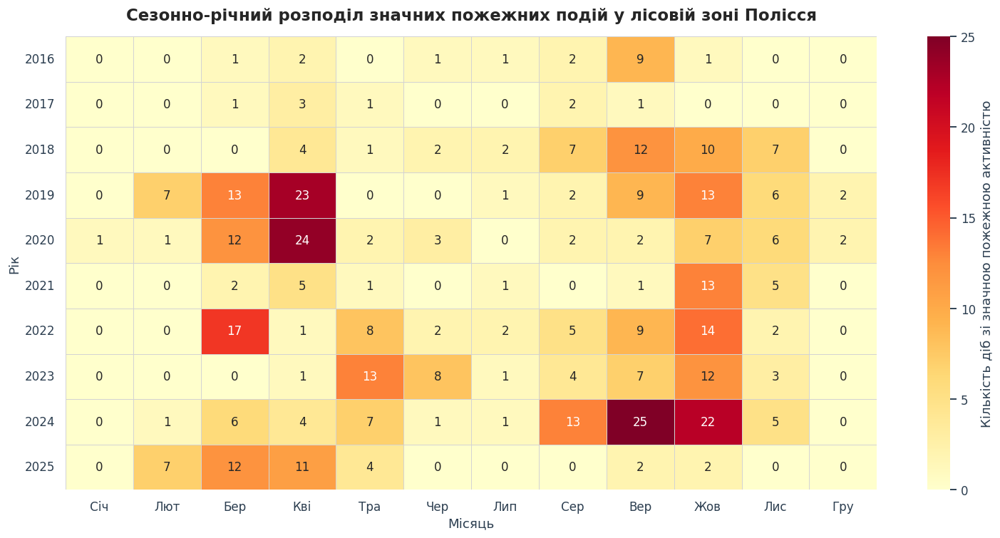

In [ ]:
# --- ФАЗА 2.2. Аналіз сезонно-річного розподілу пожежної активності ---

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# --- 1. Підготовка даних: агрегація часових компонентів ---
heat_df = data.copy()
heat_df['date'] = pd.to_datetime(heat_df['date'])
heat_df['year'] = heat_df['date'].dt.year
heat_df['month'] = heat_df['date'].dt.month

# Формування двовимірної матриці: підрахунок кількості пожежонебезпечних діб
heat = (
    heat_df
    .groupby(['year', 'month'])['significant_fire']
    .sum()
    .unstack(fill_value=0)
)

# Трансформація числових ідентифікаторів місяців у текстові мітки (з глобальної конфігурації)
if len(heat.columns) <= 12:
    heat.columns = [MONTH_NAMES[m - 1] for m in heat.columns]

# --- 2. Візуалізація матриці (Heatmap) ---
plt.figure(figsize=(14, 7))

sns.heatmap(
    heat,
    annot=True,              # Відображення абсолютних кількісних значень у комірках
    fmt='d',                 # Формат виводу (цілі числа)
    cmap=SEQUENTIAL,         # Застосування узгодженої послідовної палітри
    linewidths=0.5,
    linecolor='lightgray',   # Структурування матриці розмежувальними лініями
    cbar_kws={'label': 'Кількість діб зі значною пожежною активністю'}
)

# Оформлення заголовка та осей
plt.title(
    'Сезонно-річний розподіл значних пожежних подій у лісовій зоні Полісся',
    fontsize=15,
    fontweight='bold',
    pad=15
)

plt.xlabel('Місяць', fontsize=12)
plt.ylabel('Рік', fontsize=12)

# Вирівнювання підписів координатної сітки для кращої читабельності
plt.yticks(rotation=0)
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

### 2.3. Інтерактивна геопросторова карта

Folium-карта поєднує три шари: bounding box регіону, точки сітки Open-Meteo та теплову карту щільності пожежних детектувань FIRMS у межах лісової зони. Це геопросторова складова роботи: вона візуально підтверджує, що точки забору погоди розташовані саме в лісах, а пожежі просторово збігаються з лісовими масивами.


In [ ]:
# --- ФАЗА 2.3. Геопросторовий аналіз та візуалізація інфраструктури моніторингу ---

import folium
from folium.plugins import HeatMap, MiniMap
import pandas as pd

# Ініціалізація базової картографічної основи (світла тема для контрастного відображення теплової карти)
m = folium.Map(location=[51.25, 28.5], zoom_start=7, tiles='cartodbpositron', control_scale=True)
MiniMap(toggle_display=True, position='bottomright').add_to(m)

# 1. Візуалізація просторових меж досліджуваного регіону (Bounding Box)
folium.Rectangle(
    bounds=[[POLISSYA_BBOX['lat_min'], POLISSYA_BBOX['lon_min']],
            [POLISSYA_BBOX['lat_max'], POLISSYA_BBOX['lon_max']]],
    color='#1b7837', weight=2, fill=False, dash_array='5, 5', opacity=0.8,
    popup='<b>Досліджуваний регіон (Полісся)</b>',
).add_to(m)

# 2. Картографування метеорологічних вузлів (регулярна сітка збору погодних даних)
points_layer = folium.FeatureGroup(name='Метеорологічні вузли', show=True)
for name, (lat, lon) in POLISSYA_POINTS.items():
    folium.CircleMarker(
        [lat, lon], radius=5, color='#0077B6', fill=True,
        fill_color='#0077B6', fill_opacity=0.9, weight=1.5,
        popup=folium.Popup(f"<b>{name}</b><br>Lat {lat:.3f}, Lon {lon:.3f}", max_width=220),
        tooltip="Вузол збору метеоданих",
    ).add_to(points_layer)
points_layer.add_to(m)

# 3. Аналіз просторової щільності історичних пожежних подій (NASA FIRMS)
fires_for_map = None

# Залучення даних після фільтрації за критеріями якості та просторової локалізації (лісові масиви)
if 'fires_quality' in globals() and isinstance(fires_quality, pd.DataFrame) and not fires_quality.empty:
    try:
        fires_for_map = filter_fires_to_forest_zone(fires_quality, forest_union_geom=forest_union)
    except Exception:
        fires_for_map = fires_quality.copy()

if fires_for_map is not None and not fires_for_map.empty:
    # Використання репрезентативної вибірки для оптимізації рендерингу в середовищі браузера
    sample_n = min(8000, len(fires_for_map))
    fire_sample = fires_for_map.sample(sample_n, random_state=42) if len(fires_for_map) > sample_n else fires_for_map

    HeatMap(
        fire_sample[['latitude', 'longitude']].dropna().values.tolist(),
        name=f'Щільність пожеж (Вибірка: {sample_n} подій)',
        radius=8, blur=14, min_opacity=0.35,
        gradient={0.2: '#FFE082', 0.4: '#FF9800', 0.6: '#F44336', 0.8: '#B71C1C', 1.0: '#7F0000'}
    ).add_to(m)

# Інтеграція елементів керування картографічними шарами
folium.LayerControl(position='topright', collapsed=False).add_to(m)

# Формування інформаційної легенди (HTML/CSS)
legend_html = '''
<div style="position: fixed; bottom: 20px; left: 20px; z-index: 9999;
            background: rgba(255, 255, 255, 0.95); padding: 12px; border: 1px solid #ccc; border-radius: 6px;
            font-family: Arial, sans-serif; font-size: 12px; box-shadow: 0 2px 6px rgba(0,0,0,0.15);">
<b>Просторова структура дослідження</b><br><hr style="margin: 5px 0;">
<span style="display:inline-block; width:14px; height:14px; background:#0077B6; border-radius:50%;"></span> Метеорологічні вузли (Open-Meteo)<br>
<span style="display:inline-block; width:14px; height:14px; background: linear-gradient(to right, #FFE082, #B71C1C);"></span> Історична щільність пожеж<br>
<span style="display:inline-block; width:14px; height:14px; border:2px dashed #1b7837;"></span> Межі регіону (BBox)
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# Відображення сформованої карти
m

  [Просторова локалізація] В межах лісової зони: 17,669 / 78,734 (22.4%)


### 2.4. Кореляційна матриця погодних факторів

Кореляційна матриця показує попарні зв'язки між погодними ознаками та цільовою змінною. Використовується **рангова кореляція Спірмена**: на відміну від кореляції Пірсона, вона стійка до викидів і вловлює будь-які монотонні (а не лише лінійні) залежності, що доречно для погодних даних із важкими хвостами розподілів.

Матриця свідомо **очищена від зайвого**: з пожежних змінних залишено лише одну цільову (`significant_fire`), оскільки `frp_sum`, `frp_max`, `fire_occurred` та `fire_risk_level` є похідними одна від одної і лише дублювали б інформацію. Верхній трикутник разом із діагоналлю замасковано — матриця симетрична, тож друга половина надлишкова.


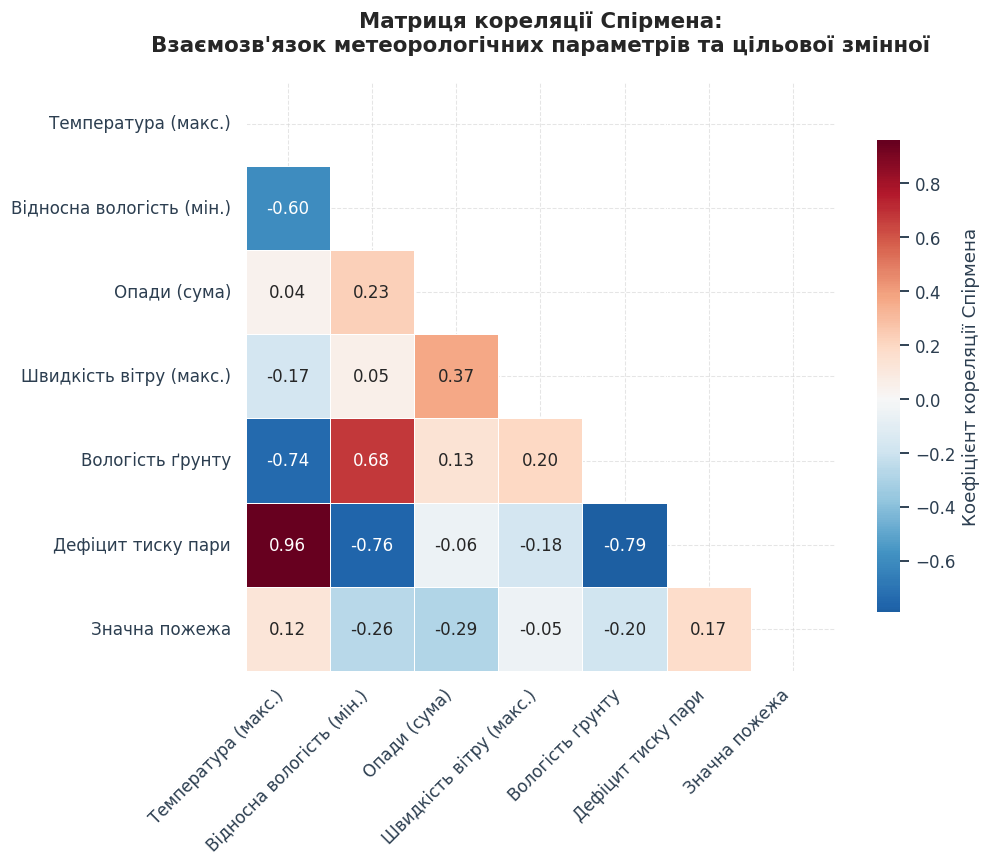

In [ ]:
# --- ФАЗА 2.4. Побудова матриці кореляцій ---

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Формування переліку досліджуваних ознак та їх назв для візуалізації
academic_labels = {
    'temperature_2m_max_reg_max': 'Температура (макс.)',
    'relative_humidity_2m_mean_reg_min': 'Відносна вологість (мін.)',
    'precipitation_sum': 'Опади (сума)',
    'wind_speed_10m_max_reg_max': 'Швидкість вітру (макс.)',
    'soil_moisture_0_to_7cm_mean_reg_min': 'Вологість ґрунту',
    'vapour_pressure_deficit_max_reg_max': 'Дефіцит тиску пари',
    'significant_fire': 'Значна пожежа'
}

# Ізоляція відповідних колонок з масиву даних
corr_cols = list(academic_labels.keys())

# Обчислення матриці рангової кореляції Спірмена (непараметричний метод)
corr = data[corr_cols].corr(method='spearman')
corr = corr.rename(index=academic_labels, columns=academic_labels)

# Ініціалізація графічного полотна
fig = plt.figure(figsize=(10, 8))

# Створення маски для приховування верхнього трикутника матриці (усунення візуальної надмірності)
mask = np.triu(np.ones_like(corr, dtype=bool))

# Побудова теплової карти (Heatmap)
sns.heatmap(
    corr,
    mask=mask,
    cmap=DIVERGING, # Використання глобальної дивергентної палітри з налаштувань EDA
    center=0,
    annot=True,
    fmt='.2f',
    square=True,
    linewidths=0.5,
    cbar_kws={'shrink': 0.8, 'label': 'Коефіцієнт кореляції Спірмена'}
)

# Оформлення заголовка та осей
plt.title(
    'Матриця кореляції Спірмена:\nВзаємозв\'язок метеорологічних параметрів та цільової змінної',
    fontsize=14,
    fontweight='bold',
    pad=20
)

plt.xticks(rotation=45, ha='right', fontsize=11)
plt.yticks(rotation=0, fontsize=11)
plt.tight_layout()

# Відображення результатів
plt.show()

### 2.5. Діаграми розмаху: погодні умови пожежних і безпожежних днів

Діаграми розмаху (box plots) порівнюють розподіли кожної погодної ознаки окремо для днів зі значною пожежною активністю та без неї. Якщо «коробки» двох класів помітно зміщені одна відносно одної (наприклад, температура у пожежні дні стабільно вища), це **прямий візуальний доказ предиктивної цінності ознаки** для майбутньої моделі.


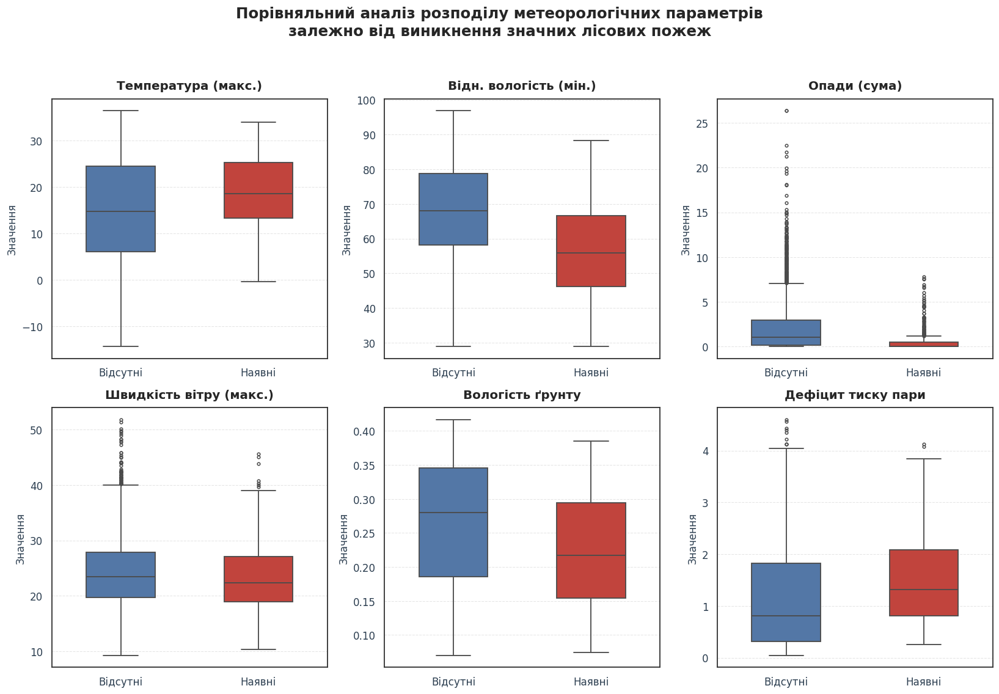

In [ ]:
# --- ФАЗА 2.5. Візуалізація розподілів ознак (Box plots) ---

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Відбір ключових предикторів та визначення їх назв для графіка
features_to_plot = {
    'temperature_2m_max_reg_max': 'Температура (макс.)',
    'relative_humidity_2m_mean_reg_min': 'Відн. вологість (мін.)',
    'precipitation_sum': 'Опади (сума)',
    'wind_speed_10m_max_reg_max': 'Швидкість вітру (макс.)',
    'soil_moisture_0_to_7cm_mean_reg_min': 'Вологість ґрунту',
    'vapour_pressure_deficit_max_reg_max': 'Дефіцит тиску пари'
}

plot_df = data.copy()

# Трансформація бінарної цільової змінної у зрозумілі текстові мітки для легенди
plot_df['target_label'] = plot_df['significant_fire'].map({
    0: 'Відсутні',
    1: 'Наявні'
})

# 2. Ініціалізація та налаштування графічного полотна (сітка 2x3)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flat

# Визначення контрастної колірної палітри для бінарних класів
academic_palette = {
    'Відсутні': '#4575B4', # Холодний відтінок (нормальні умови)
    'Наявні': '#D73027'    # Гарячий відтінок (пожежонебезпека)
}

# 3. Ітеративна побудова діаграм розмаху для кожної ознаки
for ax, (var, label) in zip(axes, features_to_plot.items()):
    if var in plot_df.columns:
        sns.boxplot(
            data=plot_df,
            x='target_label',
            y=var,
            ax=ax,
            palette=academic_palette,
            width=0.5,
            fliersize=3,       # Розмір маркерів для екстремальних викидів
            linewidth=1.2
        )

        # Оформлення індивідуальних підграфіків
        ax.set_title(label, fontsize=13, fontweight='bold', pad=10)
        ax.set_xlabel('')
        ax.set_ylabel('Значення', fontsize=11)
        ax.grid(axis='y', linestyle='--', alpha=0.6)
    else:
        # Приховування порожніх панелей у разі відсутності змінної
        ax.set_visible(False)

# Оформлення загального заголовка візуалізації
fig.suptitle(
    'Порівняльний аналіз розподілу метеорологічних параметрів\nзалежно від виникнення значних лісових пожеж',
    fontsize=16,
    fontweight='bold',
    y=1.03
)

plt.tight_layout()
plt.show()

### 2.6. Автокореляційний аналіз (ACF / PACF)

Автокореляційна (ACF) та часткова автокореляційна (PACF) функції показують, наскільки сильно значення ряду пов'язане зі своїми попередніми значеннями на різних лагах. Це **математичне обґрунтування довжини вхідного вікна** для рекурентної мережі: якщо автокореляція згасає приблизно на лазі 7–14 днів, саме такий горизонт історії має сенс подавати на вхід LSTM.

Додатково виконується тест Дікі — Фуллера (ADF) на стаціонарність ряду; його p-значення інтерпретується стандартно (p < 0.05 → ряд стаціонарний).


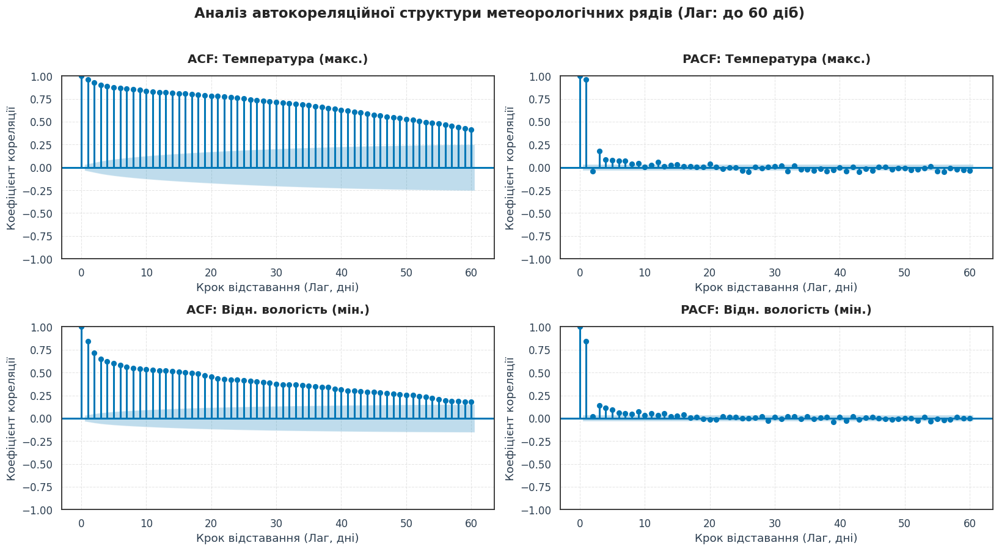

[Статистичний аналіз] Розширений тест Дікі-Фуллера (ADF Test) на стаціонарність:
---------------------------------------------------------------------------
Параметр                  | p-value         | Статистика (ADF)
---------------------------------------------------------------------------
Температура (макс.)       | 3.9308e-03      | -3.713
Відн. вологість (мін.)    | 2.0190e-07      | -5.963
---------------------------------------------------------------------------


In [ ]:
# --- ФАЗА 2.6. Аналіз автокореляційної структури ключових часових рядів ---

import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

# 1. Підготовка часового ряду: індексація масиву за часовою віссю
ts_region = data.sort_values('date').set_index('date')

# Ініціалізація досліджуваних метеорологічних параметрів та їх назв
temp_col = 'temperature_2m_max_reg_max'
rh_col = 'relative_humidity_2m_mean_reg_min'

temp_label = 'Температура (макс.)'
rh_label = 'Відн. вологість (мін.)'

# 2. Побудова багатопанельного графіка (ACF та PACF)
fig, axes = plt.subplots(2, 2, figsize=(15, 8))

# Візуалізація функцій для температурного режиму
plot_acf(ts_region[temp_col].dropna(), lags=60, ax=axes[0, 0])
axes[0, 0].set_title(f'ACF: {temp_label}', fontsize=13, fontweight='bold')

plot_pacf(ts_region[temp_col].dropna(), lags=60, ax=axes[0, 1], method='ywm')
axes[0, 1].set_title(f'PACF: {temp_label}', fontsize=13, fontweight='bold')

# Візуалізація функцій для режиму зволоження (вологості)
plot_acf(ts_region[rh_col].dropna(), lags=60, ax=axes[1, 0])
axes[1, 0].set_title(f'ACF: {rh_label}', fontsize=13, fontweight='bold')

plot_pacf(ts_region[rh_col].dropna(), lags=60, ax=axes[1, 1], method='ywm')
axes[1, 1].set_title(f'PACF: {rh_label}', fontsize=13, fontweight='bold')

# Оформлення загального полотна візуалізації
fig.suptitle(
    'Аналіз автокореляційної структури метеорологічних рядів (Лаг: до 60 діб)',
    fontsize=15, fontweight='bold', y=1.02
)

# Налаштування координатної сітки для кожного підграфіка
for ax in axes.flat:
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_xlabel('Крок відставання (Лаг, дні)')
    ax.set_ylabel('Коефіцієнт кореляції')

plt.tight_layout()
plt.show()

# 3. Статистична перевірка на стаціонарність (Augmented Dickey-Fuller Test)
print("[Статистичний аналіз] Розширений тест Дікі-Фуллера (ADF Test) на стаціонарність:")
print("-" * 75)
print(f"{'Параметр':<25s} | {'p-value':<15s} | {'Статистика (ADF)':<15s}")
print("-" * 75)

for col, label in [(temp_col, temp_label), (rh_col, rh_label)]:
    series = ts_region[col].dropna()
    adf_result = adfuller(series)

    # adf_result[1] - p-value, adf_result[0] - значення статистики критерію
    print(f"{label:<25s} | {adf_result[1]:.4e}      | {adf_result[0]:.3f}")

print("-" * 75)

### 2.7. Оцінки щільності розподілів за класами

Оцінка щільності ядром (KDE) — це згладжена версія гістограми. Накладаючи криві щільності для пожежних і безпожежних днів, можна оцінити **ступінь розділюваності класів** за кожною ознакою: чим менше перекриваються криві, тим інформативніша ознака. Цей графік доповнює діаграми розмаху, показуючи не лише квартилі, а й повну форму розподілу.


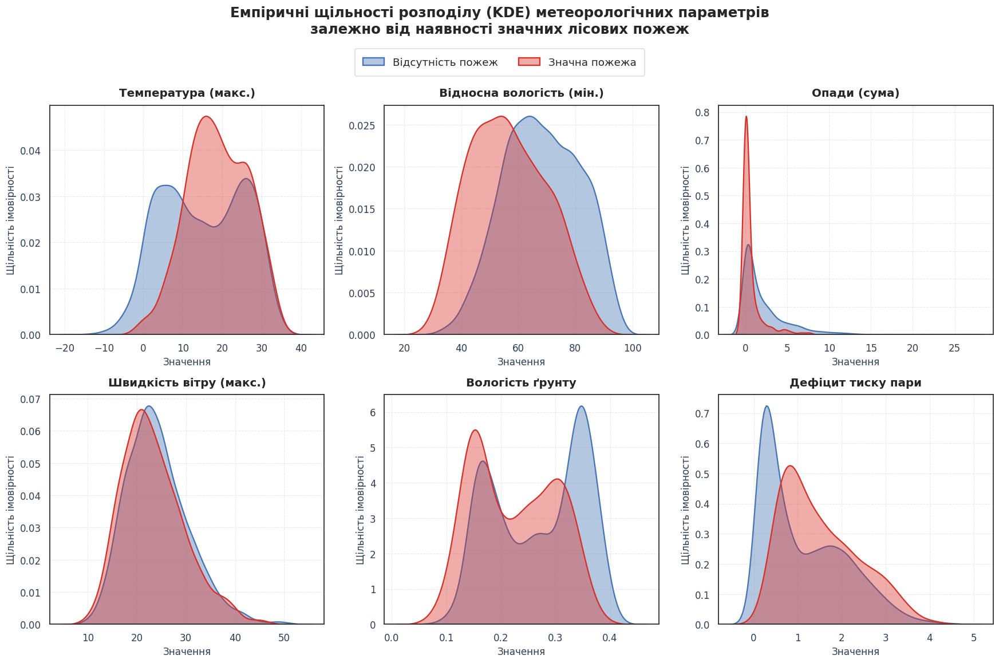

In [ ]:
# --- ФАЗА 2.7. Візуалізація емпіричних щільностей розподілу (KDE) ---

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Формування переліку досліджуваних метеорологічних ознак
features_to_plot = {
    'temperature_2m_max_reg_max': 'Температура (макс.)',
    'relative_humidity_2m_mean_reg_min': 'Відносна вологість (мін.)',
    'precipitation_sum': 'Опади (сума)',
    'wind_speed_10m_max_reg_max': 'Швидкість вітру (макс.)',
    'soil_moisture_0_to_7cm_mean_reg_min': 'Вологість ґрунту',
    'vapour_pressure_deficit_max_reg_max': 'Дефіцит тиску пари'
}

plot_df = data.copy()

# 2. Ініціалізація багатопанельного графіка (матриця 2x3)
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flat

# Визначення міток класів та колірної палітри
class_labels = {
    0: 'Відсутність пожеж',
    1: 'Значна пожежа'
}
palette = {
    0: '#4575B4', # Синій (низький ризик)
    1: '#D73027'  # Червоний (високий ризик)
}

# 3. Побудова графіків ядерної оцінки щільності (KDE)
for ax, (var, label) in zip(axes, features_to_plot.items()):
    if var in plot_df.columns:
        # Ізоляція розподілів значень ознаки за класами бінарної цільової змінної
        x0 = plot_df.loc[plot_df['significant_fire'] == 0, var].dropna()
        x1 = plot_df.loc[plot_df['significant_fire'] == 1, var].dropna()

        # Побудова кривих щільності (за умови статистично достатньої вибірки)
        if len(x0) > 2:
            sns.kdeplot(x=x0, ax=ax, label=class_labels[0], fill=True, alpha=0.4, color=palette[0], linewidth=1.5)
        if len(x1) > 2:
            sns.kdeplot(x=x1, ax=ax, label=class_labels[1], fill=True, alpha=0.4, color=palette[1], linewidth=1.5)

        # Форматування індивідуальних підграфіків
        ax.set_title(label, fontsize=13, fontweight='bold', pad=10)
        ax.set_xlabel('Значення', fontsize=11)
        ax.set_ylabel('Щільність імовірності', fontsize=11)
        ax.grid(axis='both', linestyle='--', alpha=0.5)
    else:
        # Приховування порожніх панелей
        ax.set_visible(False)

# Інтеграція загальної легенди графічного полотна
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.99),
           ncol=2, fontsize=12, frameon=True, facecolor='white', edgecolor='lightgray')

# 4. Оформлення загального заголовка візуалізації
fig.suptitle(
    'Емпіричні щільності розподілу (KDE) метеорологічних параметрів\nзалежно від наявності значних лісових пожеж',
    fontsize=16,
    fontweight='bold',
    y=1.05
)

plt.tight_layout()
plt.show()

### 2.8. STL-декомпозиція пожежної активності

STL (Seasonal-Trend decomposition using Loess) розкладає часовий ряд на три компоненти: **тренд** (довгострокова динаміка), **сезонність** (річний цикл, період = 365 днів) та **залишок** (нерегулярна складова). Декомпозиція дозволяє відокремити стійкий сезонний патерн пожежної активності від міжрічних коливань і випадкового шуму.


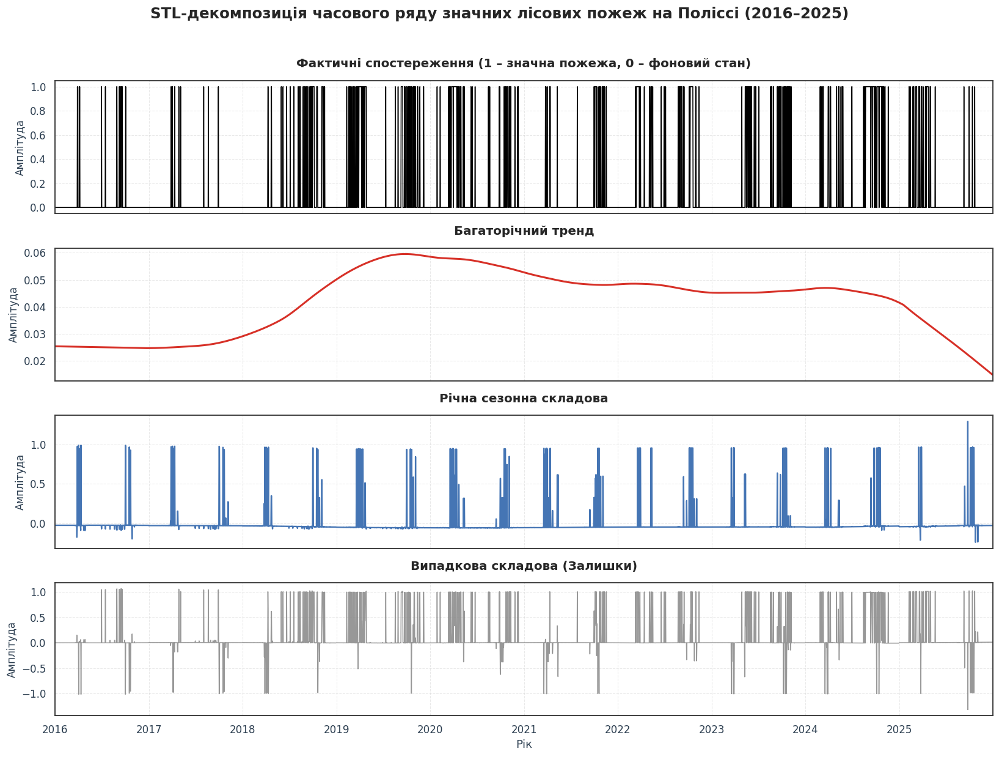

In [ ]:
# --- ФАЗА 2.8. Декомпозиція часового ряду (STL) ---

import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# 1. Підготовка часового ряду для статистичного аналізу
target_col = 'significant_fire'

# Встановлення часової мітки як індексу, забезпечення регулярної добової частоти (Day)
# та заповнення пропусків нульовими значеннями (імітація відсутності пожеж)
series = data.sort_values('date').set_index('date')[target_col].asfreq('D').fillna(0)

# 2. Виконання алгоритму STL-декомпозиції
# Використовується річний період (365 діб) та робастний підхід для стійкості до екстремальних викидів
stl = STL(series, period=365, robust=True).fit()

# 3. Ініціалізація та налаштування багатопанельного графіка
fig, axes = plt.subplots(4, 1, figsize=(15, 11), sharex=True)

# Панель 1: Фактичні емпіричні спостереження
stl.observed.plot(ax=axes[0], color='black', linewidth=1)
axes[0].set_title('Фактичні спостереження (1 – значна пожежа, 0 – фоновий стан)', fontsize=13, fontweight='bold')

# Панель 2: Довгостроковий макроскопічний тренд
stl.trend.plot(ax=axes[1], color='#D73027', linewidth=2)
axes[1].set_title('Багаторічний тренд', fontsize=13, fontweight='bold')

# Панель 3: Ізольована річна сезонність
stl.seasonal.plot(ax=axes[2], color='#4575B4', linewidth=1.5)
axes[2].set_title('Річна сезонна складова', fontsize=13, fontweight='bold')

# Панель 4: Стохастична (випадкова) складова
stl.resid.plot(ax=axes[3], color='#7F7F7F', linewidth=1, alpha=0.8)
axes[3].set_title('Випадкова складова (Залишки)', fontsize=13, fontweight='bold')

# 4. Форматування осей та загальне оформлення
for ax in axes:
    ax.grid(axis='both', linestyle='--', alpha=0.5)
    ax.set_xlabel('')
    ax.set_ylabel('Амплітуда', fontsize=11)

axes[3].set_xlabel('Рік', fontsize=12)

fig.suptitle(
    'STL-декомпозиція часового ряду значних лісових пожеж на Поліссі (2016–2025)',
    fontsize=16,
    fontweight='bold',
    y=1.02
)

plt.tight_layout()
plt.show()

### 2.9. Місячна динаміка пожежної активності

Графік із подвійною віссю Y зіставляє абсолютну кількість пожежних пікселів FIRMS за місяць (стовпчики) із кількістю днів зі значною пожежною активністю (лінія). Це дозволяє побачити, чи зумовлені місячні піки великою кількістю окремих днів, чи поодинокими, але інтенсивними подіями.


In [ ]:
# --- ФАЗА 2.9. Аналіз багаторічної місячної динаміки пожежної активності ---

import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Агрегація вихідних даних за місячними інтервалами
mon = data.copy()
mon['date'] = pd.to_datetime(mon['date'])
mon['year_month'] = mon['date'].dt.to_period('M').dt.to_timestamp()

# Обчислення сумарних показників активності, інтенсивності та тривалості
mon_agg = (
    mon.groupby('year_month')
       .agg(
           fire_pixels=('fire_count', 'sum'),
           significant_days=('significant_fire', 'sum'),
           frp_total=('frp_sum', 'sum')
       )
       .reset_index()
)

# 2. Ініціалізація графічного об'єкта з двома незалежними осями ординат
fig = make_subplots(specs=[[{'secondary_y': True}]])

# Первинна панель (стовпчикова діаграма): загальна кількість детектувань та FRP
fig.add_trace(go.Bar(
    x=mon_agg['year_month'],
    y=mon_agg['fire_pixels'],
    name='Загальна активність (пікселі)',
    marker=dict(
        color=mon_agg['frp_total'],
        colorscale='YlOrRd',
        showscale=True,
        line=dict(color='darkgray', width=0.8),
        colorbar=dict(
            title='Інтенсивність горіння (FRP, МВт)',
            len=0.85,
            yanchor='middle',
            y=0.45
        )
    ),
    hovertemplate='%{x|%Y-%m}: %{y} пікселів<extra></extra>'
), secondary_y=False)

# Вторинна панель (лінійний графік): кількість діб зі значними пожежами
fig.add_trace(go.Scatter(
    x=mon_agg['year_month'],
    y=mon_agg['significant_days'],
    name='Дні зі значними пожежами',
    mode='lines+markers',
    line=dict(color='black', width=2),
    marker=dict(size=5, color='black'),
    hovertemplate='%{x|%Y-%m}: %{y} діб<extra></extra>'
), secondary_y=True)

# 3. Оформлення загальної геометрії та компонування
fig.update_layout(
    height=600,
    template='plotly_white',

    # Вирівнювання заголовка відносно центральної осі діаграми
    title=dict(
        text='<b>Багаторічна місячна динаміка пожежної активності та інтенсивності горіння</b>',
        font=dict(size=16, color='black'),
        x=0.45,
        xanchor='center'
    ),

    # Інтеграція легенди із збереженням симетрії візуального полотна
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.05,
        xanchor='center',
        x=0.45,
        font=dict(size=12)
    ),

    hovermode='x unified',
    margin=dict(t=120, l=60, r=60, b=50)
)

# Налаштування параметрів координатних осей
fig.update_yaxes(title_text='Кількість температурних аномалій (пікселів)', secondary_y=False)
fig.update_yaxes(title_text='Кількість діб зі значними пожежами', secondary_y=True)
fig.update_xaxes(title_text='Часовий період (Місяць та Рік)', showgrid=True, gridcolor='lightgray')

# Відображення результатів
fig.show()

### 2.10. Роза вітрів для днів зі значною пожежною активністю

Роза вітрів у полярних координатах показує, з яких напрямків переважно дув вітер у дні значної пожежної активності. Якщо простежується домінуючий сектор, це може вказувати на зв'язок між певними синоптичними ситуаціями (наприклад, сухими східними вітрами) та підвищеним пожежним ризиком.


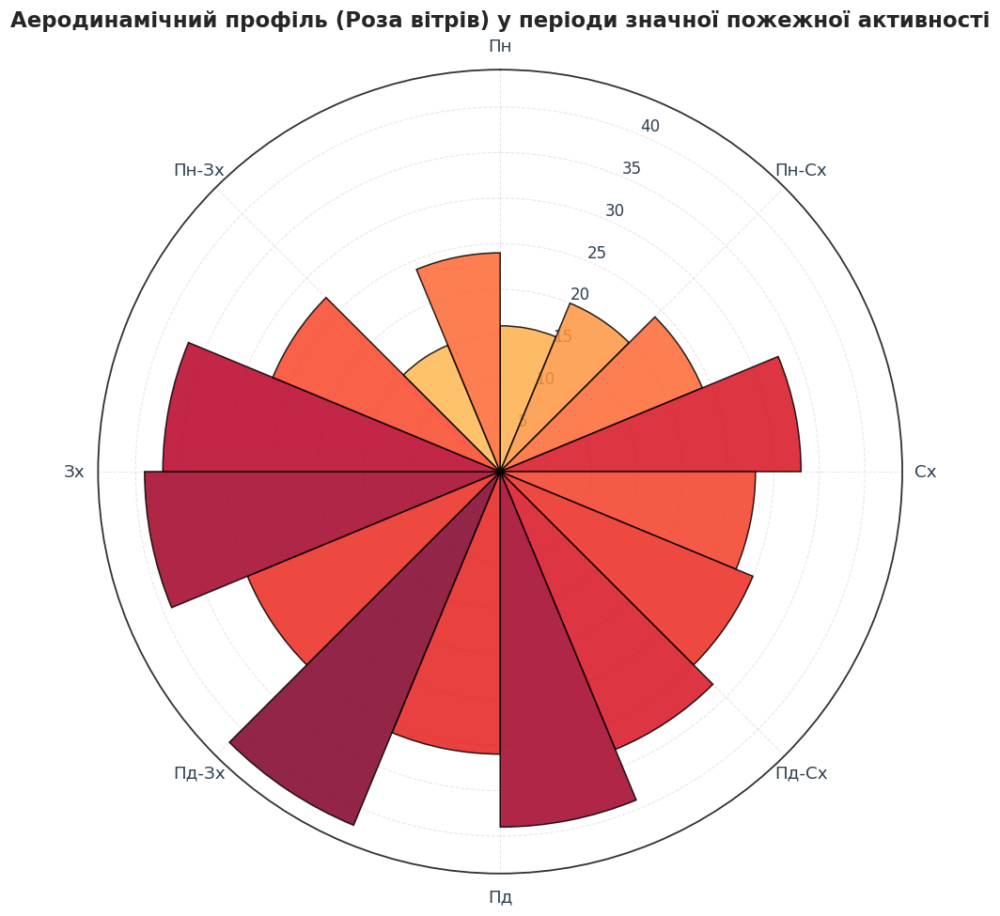

In [ ]:
# --- ФАЗА 2.10. Аналіз аеродинамічного режиму (Роза вітрів) ---

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Відбір даних: ізоляція спостережень для діб зі значною пожежною активністю
wind_dir_col = 'wind_direction_10m_dominant'

if wind_dir_col in data.columns:
    fire_days = data[data['significant_fire'] == 1].dropna(subset=[wind_dir_col]).copy()

    # Перевірка наявності мінімально необхідної вибірки для забезпечення статистичної достовірності
    if len(fire_days) > 30:
        # Секторування: розбиття кола (360 градусів) на 16 румбів (по 22.5 градуси)
        bins = np.arange(0, 361, 22.5)
        fire_days['dir_bin'] = pd.cut(
            fire_days[wind_dir_col] % 360,
            bins=bins,
            include_lowest=True,
            right=False
        )
        dir_counts = fire_days.groupby('dir_bin', observed=True).size()

        # Геометричні перетворення для полярної системи координат
        theta = np.deg2rad(bins[:-1] + 11.25) # Центрування секторів
        width = np.deg2rad(22.5)
        values = dir_counts.reindex(dir_counts.index, fill_value=0).values

        # 2. Ініціалізація та налаштування полярного графічного полотна
        fig = plt.figure(figsize=(9, 9))
        ax = fig.add_subplot(111, projection='polar')

        # Метеорологічний стандарт орієнтації: Північ (0°) зверху, азимут за годинниковою стрілкою
        ax.set_theta_zero_location('N')
        ax.set_theta_direction(-1)

        # Форматування координатних осей та підписи румбів українською мовою
        ax.set_xticks(np.pi / 180. * np.linspace(0, 360, 8, endpoint=False))
        ax.set_xticklabels(['Пн', 'Пн-Сх', 'Сх', 'Пд-Сх', 'Пд', 'Пд-Зх', 'Зх', 'Пн-Зх'], fontsize=12)

        # Генерація колірної шкали (інтенсивність пігменту пропорційна частоті напрямку вітру)
        colors = plt.cm.YlOrRd(values / max(1, values.max()))

        # 3. Побудова діаграми
        ax.bar(
            theta[:len(values)], values,
            width=width, bottom=0.0,
            color=colors, edgecolor='black', alpha=0.85
        )

        # Оформлення заголовка
        ax.set_title(
            'Аеродинамічний профіль (Роза вітрів) у періоди значної пожежної активності',
            fontsize=15,
            fontweight='bold',
            pad=30
        )

        plt.tight_layout()
        plt.show()
    else:
        print(f"[Інформація] Недостатній обсяг статистичних даних для побудови рози вітрів (наявно діб: {len(fire_days)}).")
else:
    print("[Помилка] Атрибут напрямку вітру відсутній у робочому масиві даних.")

## Фаза 3. Інженерія ознак (Feature Engineering)

Сирі погодні змінні описують **миттєвий стан** атмосфери, тоді як пожежний ризик визначається **накопиченими ефектами** — тривалою посухою, поступовим висиханням підстилки, кумулятивним тепловим навантаженням. Завдання цієї фази — сконструювати ознаки, що відображають цю накопичену динаміку.

**Створювані групи ознак:**
- **VPD (Vapor Pressure Deficit, кПа)** — дефіцит тиску водяної пари; фізично коректний індикатор сухості повітря, який поєднує температуру й вологість.
- **Дні без дощу** — довжина поточної серії днів зі значущими опадами < 1 мм.
- **Ковзні статистики** — середнє та стандартне відхилення для температури, вологості, VPD та опадів на вікнах 3 / 7 / 14 днів.
- **FWI (Canadian Fire Weather Index)** — канадський індекс пожежної небезпеки та його компоненти (FFMC, DMC, DC, ISI, BUI); галузевий стандарт оцінки пожежного ризику.
- **Календарні ознаки** — день року, місяць, синус/косинус сезонної фази, ознака пожежонебезпечного сезону.

**Вихід фази** — тривимірний тензор `[зразки, часові кроки, ознаки]`, де кожен зразок є ковзним вікном з 14 послідовних днів. Саме у такому форматі дані подаються на вхід рекурентної нейромережі.


### 3.1. Функції конструювання ознак

Тут визначаються (але ще не виконуються) функції інженерії ознак. Особливої уваги заслуговує `add_fwi`: розрахунок FWI **рекурсивний** — індекси вологості пального кожного дня залежать від їхніх значень за попередній день. Тому функція проходить ряд послідовно, передаючи стан `(FFMC, DMC, DC)` з дня в день. Реалізація відповідає канонічним рівнянням Van Wagner & Pickett (1985).


In [ ]:
# --- ФАЗА 3. Конструювання похідних ознак (Feature Engineering) ---

import numpy as np
import pandas as pd
import math

# --- 1. Розрахунок дефіциту тиску пари (VPD) ---
def compute_vpd(temp_c, rh_pct):
    """
    Обчислення Vapour Pressure Deficit (кПа) на основі температури та відносної вологості.
    Використовується рівняння Тетенса для тиску насиченої пари.
    """
    es = 0.6108 * np.exp((17.27 * temp_c) / (temp_c + 237.3))
    ea = es * (rh_pct / 100.0)
    return (es - ea).clip(lower=0)

# --- 2. Розрахунок тривалості бездощових періодів ---
def days_without_rain(precip, threshold=1.0):
    """
    Підрахунок кількості послідовних діб з опадами нижче заданого порогу.
    """
    no_rain = (precip < threshold).astype(int)
    grp = (no_rain != no_rain.shift()).cumsum()
    return no_rain.groupby(grp).cumsum() * no_rain

# --- 3. Генерація інерційних ознак (Rolling Windows) ---
def add_rolling(df, cols, windows=(3, 7, 14)):
    """
    Створення ковзних середніх, стандартних відхилень та кумулятивних сум
    для заданих часових вікон.
    """
    df = df.sort_values('date').copy()
    for col in cols:
        if col not in df.columns:
            continue
        for w in windows:
            df[f'{col}_ma{w}']  = df[col].rolling(w, min_periods=1).mean()
            df[f'{col}_std{w}'] = df[col].rolling(w, min_periods=2).std().fillna(0)

            if any(x in col for x in ['precip', 'rain', 'precipitation']):
                df[f'{col}_sum{w}'] = df[col].rolling(w, min_periods=1).sum()
    return df

# --- 4. Інтеграція тригонометричних календарних предикторів ---
def add_calendar(df):
    """
    Трансформація лінійного дня року у циклічні ознаки для уникнення розриву між 31 грудня та 1 січня.
    """
    df = df.copy()
    df['day_of_year']    = df['date'].dt.dayofyear
    df['month']          = df['date'].dt.month
    df['doy_sin']        = np.sin(2 * np.pi * df['day_of_year'] / 365.25)
    df['doy_cos']        = np.cos(2 * np.pi * df['day_of_year'] / 365.25)
    df['is_fire_season'] = df['month'].isin([3, 4, 5, 6, 7, 8, 9, 10]).astype(int)
    return df

# --- 5. Імплементація Канадського індексу пожежної погоди (FWI System) ---
# Емпіричні константи (Van Wagner & Pickett, 1985)
_DMC_Le = [6.5, 7.5, 9.0, 12.8, 13.9, 13.9, 12.4, 10.9, 9.4, 8.0, 7.0, 6.0]
_DC_Lf  = [-1.6, -1.6, -1.6, 0.9, 3.8, 5.8, 6.4, 5.0, 2.4, 0.4, -1.6, -1.6]

def _fwi_step(T, H, W, R, F0, D0, C0, mi):
    """
    Ітеративний розрахунок компонентів FWI для однієї доби.
    """
    H = max(0.0, min(100.0, H))

    # 5.1. Fine Fuel Moisture Code (FFMC)
    mo = 147.2 * (101.0 - F0) / (59.5 + F0)
    if R > 0.5:
        rf = R - 0.5
        mo = mo + 42.5 * rf * math.exp(-100.0 / (251.0 - mo)) * (1 - math.exp(-6.93 / rf))
        if mo > 150:
            mo += 0.0015 * (mo - 150)**2 * math.sqrt(rf)
        mo = min(mo, 250.0)

    ed = 0.942 * H**0.679 + 11.0 * math.exp((H - 100) / 10) + 0.18 * (21.1 - T) * (1 - math.exp(-0.115 * H))
    ew = 0.618 * H**0.753 + 10.0 * math.exp((H - 100) / 10) + 0.18 * (21.1 - T) * (1 - math.exp(-0.115 * H))

    if mo > ed:
        kd = (0.424 * (1 - (H / 100)**1.7) + 0.0694 * math.sqrt(W) * (1 - (H / 100)**8)) * 0.581 * math.exp(0.0365 * T)
        m  = ed + (mo - ed) * 10**(-kd)
    elif mo < ew:
        kw = (0.424 * (1 - ((100 - H) / 100)**1.7) + 0.0694 * math.sqrt(W) * (1 - ((100 - H) / 100)**8)) * 0.581 * math.exp(0.0365 * T)
        m  = ew - (ew - mo) * 10**(-kw)
    else:
        m = mo

    F = max(0.0, min(101.0, 59.5 * (250 - m) / (147.2 + m)))

    # 5.2. Duff Moisture Code (DMC)
    if R > 1.5:
        re = 0.92 * R - 1.27
        Mo = 20 + math.exp(5.6348 - D0 / 43.43)
        b  = 100 / (0.5 + 0.3 * D0) if D0 <= 33 else (14 - 1.3 * math.log(D0) if D0 <= 65 else 6.2 * math.log(D0) - 17.2)
        Mr = Mo + 1000 * re / (48.77 + b * re)
        D_p = max(0.0, 244.72 - 43.43 * math.log(max(1e-3, Mr - 20)))
    else:
        D_p = D0

    K = 1.894 * (T + 1.1) * (100 - H) * _DMC_Le[mi] * 1e-6 if T > -1.1 else 0.0
    D = D_p + 100 * K

    # 5.3. Drought Code (DC)
    if R > 2.8:
        rd = 0.83 * R - 1.27
        Qo = 800 * math.exp(-C0 / 400)
        Qr = Qo + 3.937 * rd
        C_p = max(0.0, 400 * math.log(800 / max(1e-3, Qr)))
    else:
        C_p = C0

    C = C_p + 0.5 * max(0.0, 0.36 * (T + 2.8) + _DC_Lf[mi])

    # 5.4. Initial Spread Index (ISI)
    fW = math.exp(0.05039 * W)
    fF = 91.9 * math.exp(-0.1386 * m) * (1 + (m**5.31) / 4.93e7)
    I  = 0.208 * fW * fF

    # 5.5. Buildup Index (BUI)
    B = max(0.0, 0.8 * D * C / (D + 0.4 * C + 1e-9)) if D <= 0.4 * C else max(0.0, D - (1 - 0.8 * C / (D + 0.4 * C + 1e-9)) * (0.92 + (0.0114 * D)**1.7))

    # 5.6. Fire Weather Index (FWI)
    fD = 0.626 * B**0.809 + 2.0 if B <= 80 else 1000 / (25 + 108.64 * math.exp(-0.023 * B))
    S  = 0.1 * I * fD
    fwi = math.exp(2.72 * (0.434 * math.log(max(1e-3, S)))**0.647) if S > 1 else S

    return F, D, C, I, B, fwi

def add_fwi(df):
    """
    Агрегатор для послідовного розрахунку системи індексів FWI для всього часового ряду.
    """
    # Ідентифікація необхідних метеорологічних предикторів
    t = next((c for c in [
        'temperature_2m_mean', 'temperature_2m_mean_reg_max',
        'temp_mean', 'temperature_2m'
    ] if c in df.columns), None)

    h = next((c for c in [
        'relative_humidity_2m_mean', 'relative_humidity_2m_mean_reg_min',
        'humidity_mean', 'humidity_pct'
    ] if c in df.columns), None)

    w = next((c for c in [
        'wind_speed_10m_max', 'wind_speed_10m_max_reg_max', 'wind_speed'
    ] if c in df.columns), None)

    r = next((c for c in [
        'rain_sum', 'precipitation_sum', 'precipitation',
        'precipitation_sum_reg_min'
    ] if c in df.columns), None)

    missing = [n for n, c in [('T', t), ('H', h), ('W', w), ('R', r)] if c is None]
    if missing:
        print(f'[Попередження] Модуль FWI: відсутні базові параметри {missing}. Обчислення перервано.')
        for col in ['FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'FWI']:
            df[col] = np.np.nan
        return df

    print(f'[Процес] Ініціалізація розрахунку FWI. Визначено предиктори: T={t} | H={h} | W={w} | R={r}')
    df = df.sort_values('date').copy()

    # Векторизація вхідних даних для прискорення обчислень
    T_arr = df[t].fillna(10.0).values
    H_arr = df[h].fillna(60.0).values
    W_arr = df[w].fillna(5.0).values
    R_arr = df[r].fillna(0.0).values
    M_arr = df['date'].dt.month.values - 1

    # Початкові значення індексів (інерційна складова)
    F0, D0, C0 = 85.0, 6.0, 15.0
    res = {'FFMC': [], 'DMC': [], 'DC': [], 'ISI': [], 'BUI': [], 'FWI': []}

    # Ітеративний розрахунок (потребує послідовного виконання через залежність від попереднього дня)
    for i in range(len(df)):
        F, D, C, I, B, fwi = _fwi_step(
            float(T_arr[i]), float(H_arr[i]),
            float(W_arr[i]), float(R_arr[i]),
            F0, D0, C0, int(M_arr[i])
        )
        res['FFMC'].append(F); res['DMC'].append(D)
        res['DC'].append(C);   res['ISI'].append(I)
        res['BUI'].append(B);  res['FWI'].append(fwi)

        # Оновлення інерційних параметрів для наступної доби
        F0, D0, C0 = F, D, C

    # Інтеграція розрахованих індексів у загальний масив
    for k, v in res.items():
        df[k] = v

    return df

print("[Інформація] Ініціалізацію модулів Фази 3 (Інженерія ознак) успішно завершено.")

[Інформація] Ініціалізацію модулів Фази 3 (Інженерія ознак) успішно завершено.


### 3.2. Застосування інженерії ознак до датасету

Послідовно застосовуємо визначені функції до регіонального датасету `data`: спочатку VPD, далі лічильник днів без дощу, ковзні статистики, календарні ознаки і, нарешті, компоненти FWI. Після цього кроку кількість ознак зростає з кількох десятків до понад сотні.


In [ ]:
# --- ФАЗА 3.1. Виконання розрахунків та генерація похідних ознак ---

import pandas as pd

# Ініціалізація робочого масиву та хронологічне впорядкування
fe = data.copy()
fe['date'] = pd.to_datetime(fe['date'])
fe = fe.sort_values('date').reset_index(drop=True)

n_before = fe.shape[1]

# --- 1. Обчислення дефіциту тиску пари (VPD) ---
t_col = next((c for c in [
    'temperature_2m_mean', 'temperature_2m_mean_reg_max', 'temp_mean'
] if c in fe.columns), None)

h_col = next((c for c in [
    'relative_humidity_2m_mean', 'relative_humidity_2m_mean_reg_min',
    'humidity_mean', 'humidity_pct'
] if c in fe.columns), None)

if t_col and h_col:
    fe['vpd'] = compute_vpd(fe[t_col], fe[h_col])
    print(f"[Інформація] VPD: Середнє = {fe['vpd'].mean():.3f} кПа | Максимум = {fe['vpd'].max():.2f} кПа")
else:
    print(f"[Попередження] VPD: Базові атрибути не ідентифіковано (T={t_col}, H={h_col}).")

# --- 2. Обчислення тривалості бездощових періодів ---
p_col = next((c for c in [
    'precipitation_sum', 'precipitation', 'precipitation_sum_reg_min'
] if c in fe.columns), None)

if p_col:
    fe['days_no_rain'] = days_without_rain(fe[p_col], threshold=1.0)
    print(f"[Інформація] Періоди без опадів: Максимум = {fe['days_no_rain'].max():.0f} діб")

# --- 3. Формування інерційних ознак (Rolling Windows) ---
# Відбір базових метеорологічних предикторів для генерації часового контексту
roll_candidates = [
    'temperature_2m_max', 'temperature_2m_mean',
    'temperature_2m_max_reg_max', 'temperature_2m_mean_reg_max',
    'relative_humidity_2m_mean', 'relative_humidity_2m_mean_reg_min',
    'wind_speed_10m_max', 'wind_speed_10m_max_reg_max',
    'precipitation_sum', 'precipitation_sum_reg_min',
    'vapour_pressure_deficit_max_reg_max', 'vapour_pressure_deficit_max',
    'et0_fao_evapotranspiration_reg_max', 'et0_fao_evapotranspiration',
    'soil_moisture_0_to_7cm_mean_reg_min', 'soil_moisture_0_to_7cm_mean',
    'vpd',
]

roll_cols = [c for c in roll_candidates if c in fe.columns]
fe = add_rolling(fe, roll_cols, windows=(3, 7, 14))
print(f"[Інформація] Ковзні вікна (Rolling): Додано {fe.shape[1] - n_before - (1 if 'vpd' in fe else 0) - (1 if 'days_no_rain' in fe else 0)} похідних ознак")

# --- 4. Формування календарних ознак ---
n_before_cal = fe.shape[1]
fe = add_calendar(fe)
print(f"[Інформація] Календарний блок: Додано {fe.shape[1] - n_before_cal} тригонометричних ознак")

# --- 5. Обчислення Канадського індексу пожежної погоди (FWI) ---
print('[Процес] Запуск модуля розрахунку FWI...')
fe = add_fwi(fe)
print(f"[Інформація] Інтегральний індекс FWI: Середнє = {fe['FWI'].mean():.2f} | Максимум = {fe['FWI'].max():.1f}")

# --- Підсумковий звіт етапу ---
print("-" * 60)
print(f"[Підсумок Фази 3.1] Формування простору ознак завершено.")
print(f"  Загальна кількість предикторів: {fe.shape[1] - 1} (без урахування 'date')")
print(f"  Згенеровано нових ознак:        {fe.shape[1] - data.shape[1]}")
print("-" * 60)

[Інформація] VPD: Середнє = 0.381 кПа | Максимум = 1.80 кПа
[Інформація] Періоди без опадів: Максимум = 21 діб
[Інформація] Ковзні вікна (Rolling): Додано 108 похідних ознак
[Інформація] Календарний блок: Додано 5 тригонометричних ознак
[Процес] Запуск модуля розрахунку FWI...
[Процес] Ініціалізація розрахунку FWI. Визначено предиктори: T=temperature_2m_mean | H=relative_humidity_2m_mean | W=wind_speed_10m_max | R=rain_sum
[Інформація] Інтегральний індекс FWI: Середнє = 2.55 | Максимум = 30.3
------------------------------------------------------------
[Підсумок Фази 3.1] Формування простору ознак завершено.
  Загальна кількість предикторів: 170 (без урахування 'date')
  Згенеровано нових ознак:        121
------------------------------------------------------------


### 3.3. Відбір ознак, хронологічний поділ і формування тензорів

Цей блок готує дані безпосередньо до навчання і містить три методологічно важливі рішення.

**Запобігання витоку цільової змінної.** Зі списку ознак виключаються всі пожежні колонки (`fire_count`, `frp_sum`, `significant_fire` тощо) — інакше модель «підглядала б» відповідь серед предикторів.

**Хронологічний поділ на три вибірки.** Дані діляться **строго за часом** (без перемішування) у пропорції 70 / 15 / 15 на навчальну, валідаційну та тестову вибірки. Окремий валідаційний набір є принциповим: рання зупинка навчання, вибір найкращої епохи та поріг класифікації мають налаштовуватися на валідації, а не на тесті. Якщо для цього використати тест, його метрики виявляться **систематично завищеними** — це класичний витік даних (*data leakage*).

**Масштабування без витоку.** Параметри нормалізації `StandardScaler` обчислюються **лише на навчальній вибірці**, а потім застосовуються до валідаційної та тестової — щоб інформація про майбутнє не потрапила у процес препроцесингу.


In [ ]:
# --- ФАЗА 3.3. Відбір ознак, хронологічний поділ та генерація тензорів для LSTM ---

import numpy as np
from sklearn.preprocessing import StandardScaler

# --- 1. Формування простору предикторів (Усунення Data Leakage) ---
# Строге вилучення цільової змінної, ідентифікаторів та похідних від пожеж атрибутів
EXCLUDE = {
    'date', 'location', 'latitude', 'longitude',
    'fire_occurred', 'significant_fire', 'fire_risk_level',
    'fire_count', 'frp_sum', 'frp_max',
}

# Динамічний відбір числових ознак із достатнім рівнем заповненості (понад 50%)
FEATURE_COLS = [
    c for c in fe.columns
    if c not in EXCLUDE
    and fe[c].dtype != object
    and fe[c].notna().mean() > 0.5
]
TARGET_COL = 'significant_fire'

print("[Статистика] Конфігурація модельного простору:")
print(f"  Кількість відібраних предикторів: {len(FEATURE_COLS)}")
print(f"  Цільова змінна (Target):          {TARGET_COL}")
print(f"  Загальний обсяг вибірки:          {len(fe):,} діб")
print(f"  Баланс класів (базовий ризик):    {fe[TARGET_COL].mean():.2%} позитивних спостережень")

# --- 2. Хронологічна стратифікація (Train / Val / Test) ---
# Пропорція поділу: 70% (Навчання) / 15% (Валідація) / 15% (Тестування)
split_train = fe['date'].quantile(0.70)
split_val   = fe['date'].quantile(0.85)

train_mask = fe['date'] <  split_train
val_mask   = (fe['date'] >= split_train) & (fe['date'] < split_val)
test_mask  = fe['date'] >= split_val

print("\n[Статистика] Розподіл вибірок (строга хронологія):")
for name, m in [('Train', train_mask), ('Val', val_mask), ('Test', test_mask)]:
    print(f"  {name:6s}: {m.sum():4d} діб | {fe.loc[m, 'date'].min().date()} — {fe.loc[m, 'date'].max().date()}")

# --- 3. Стандартизація даних (Standardization) ---
# Навчання масштабувальника виключно на тренувальній вибірці для запобігання витоку (Data Leakage)
fe_scaled = fe.copy()
scaler = StandardScaler()

fe_scaled.loc[train_mask, FEATURE_COLS] = scaler.fit_transform(fe.loc[train_mask, FEATURE_COLS])
fe_scaled.loc[val_mask,   FEATURE_COLS] = scaler.transform(fe.loc[val_mask,   FEATURE_COLS])
fe_scaled.loc[test_mask,  FEATURE_COLS] = scaler.transform(fe.loc[test_mask,  FEATURE_COLS])

# --- 4. Генерація тривимірних тензорів (Алгоритм ковзного вікна) ---
def make_sequences(df, feature_cols, target_col, time_steps=14):
    """
    Трансформація двовимірного часового ряду у набір тривимірних тензорів.
    X[i] містить історичні дані за `time_steps` діб, що передують прогнозу.
    y[i] містить значення цільової змінної для прогнозованої доби.
    """
    df = df.sort_values('date').reset_index(drop=True)
    F = df[feature_cols].values.astype(np.float32)
    T = df[target_col].values.astype(np.int32)
    X, y = [], []

    for i in range(time_steps, len(df)):
        X.append(F[i - time_steps:i])   # Історичне вікно: [i - time_steps ... i - 1]
        y.append(T[i])                  # Прогнозна мітка: доба i

    return np.stack(X).astype(np.float32), np.array(y, dtype=np.int32)

# Глибина історичного контексту (визначена на основі PACF-аналізу)
TIME_STEPS = 14

X_train, y_train = make_sequences(fe_scaled[train_mask], FEATURE_COLS, TARGET_COL, TIME_STEPS)
X_val,   y_val   = make_sequences(fe_scaled[val_mask],   FEATURE_COLS, TARGET_COL, TIME_STEPS)
X_test,  y_test  = make_sequences(fe_scaled[test_mask],  FEATURE_COLS, TARGET_COL, TIME_STEPS)

# --- 5. Компенсація дисбалансу класів (Class Weighting) ---
# Розрахунок вагових коефіцієнтів для штрафування моделі за помилки на рідкісному класі (пожежі)
pos_rate = y_train.mean()
class_weight = {0: 1.0, 1: round((1 - pos_rate) / max(pos_rate, 1e-6), 2)}
print(f"\n[Конфігурація] Ваги класів для функції втрат: {class_weight}")

print("\n[Підсумок Фази 3.3] Математичні структури (Тензори) успішно згенеровано:")
print(f"  X_train: {X_train.shape} | Частота пожеж: {y_train.mean():.2%}")
print(f"  X_val:   {X_val.shape} | Частота пожеж: {y_val.mean():.2%}")
print(f"  X_test:  {X_test.shape} | Частота пожеж: {y_test.mean():.2%}")

# --- 6. Фізичне збереження підготовлених наборів даних ---
np.savez_compressed(
    f'{PROJECT_DIR}/polissya_tensors.npz',
    X_train=X_train, y_train=y_train,
    X_val=X_val,     y_val=y_val,
    X_test=X_test,   y_test=y_test,
    feature_cols=np.array(FEATURE_COLS, dtype=object),
    time_steps=TIME_STEPS,
)
fe.to_csv(f'{PROJECT_DIR}/polissya_features.csv', index=False)

print(f"\n[Збереження] Експорт даних завершено:")
print(f"  Тензори: {PROJECT_DIR}/polissya_tensors.npz")
print(f"  Ознаки:  {PROJECT_DIR}/polissya_features.csv")

[Статистика] Конфігурація модельного простору:
  Кількість відібраних предикторів: 161
  Цільова змінна (Target):          significant_fire
  Загальний обсяг вибірки:          3,653 діб
  Баланс класів (базовий ризик):    12.81% позитивних спостережень

[Статистика] Розподіл вибірок (строга хронологія):
  Train : 2557 діб | 2016-01-01 — 2022-12-31
  Val   :  548 діб | 2023-01-01 — 2024-07-01
  Test  :  548 діб | 2024-07-02 — 2025-12-31

[Конфігурація] Ваги класів для функції втрат: {0: 1.0, 1: np.float64(7.59)}

[Підсумок Фази 3.3] Математичні структури (Тензори) успішно згенеровано:
  X_train: (2543, 14, 161) | Частота пожеж: 11.64%
  X_val:   (534, 14, 161) | Частота пожеж: 12.92%
  X_test:  (534, 14, 161) | Частота пожеж: 19.29%

[Збереження] Експорт даних завершено:
  Тензори: /content/drive/MyDrive/forest_fire_project/polissya_tensors.npz
  Ознаки:  /content/drive/MyDrive/forest_fire_project/polissya_features.csv


## Підсумок Фаз 1–3

- **Зона дослідження:** перетин bbox українського Полісся, OSM-полігонів лісів (`landuse=forest` / `natural=wood`, площа ≥ 2 км²) та адміністративної межі України.
- **Погодні дані:** Open-Meteo (реаналіз ERA5) для регулярної сітки точок усередині лісової зони.
- **Регіональна агрегація:** `1 рядок = 1 день для всієї лісової зони Полісся`.
- **Пожежі:** NASA FIRMS (VIIRS + MODIS), відфільтровані за якістю та просторово обмежені лісовою маскою.
- **Цільова змінна:** `significant_fire` — значна пожежна активність (≥ 5 пікселів або сумарний FRP ≥ 100 МВт).
- **Інженерія ознак:** VPD, лічильник днів без дощу, ковзні статистики (3/7/14 днів), компоненти FWI, календарні ознаки.
- **Поділ даних:** хронологічний 70 / 15 / 15 на навчальну, валідаційну та тестову вибірки; масштабування навчене лише на train.
- **Формат для моделей:** тензори `X_train [N, 14, F]`, `X_val`, `X_test` та відповідні мітки.

**Наступна Фаза 4:** базові моделі (логістична регресія) → ансамблеві (Random Forest, CatBoost) → рекурентна нейромережа (BiLSTM) з вагами класів; вибір гіперпараметрів та порогу — на валідаційній вибірці, фінальна оцінка — на тестовій.


## Фаза 4. Моделювання

У цій фазі послідовно навчаються чотири моделі різної складності та порівнюються на однаковій тестовій вибірці:

1. **Логістична регресія** — лінійний baseline, дозволяє оцінити, чи дають нелінійні моделі реальний приріст якості.
2. **Random Forest** — ансамбль дерев, ловить нелінійні взаємодії без потреби у feature engineering.
3. **CatBoost** — градієнтний бустинг, зазвичай найсильніший серед класичних моделей на табличних даних.
4. **BiLSTM** — двонаправлена рекурентна мережа, що використовує саме часову структуру вікон.

**Принцип «навчання → валідація → тест».** Ранню зупинку для CatBoost, вибір епохи для BiLSTM та оптимальний поріг класифікації налаштовуємо **виключно на валідаційній вибірці**. Тестова вибірка торкається моделей лише один раз — для остаточної оцінки. Це гарантує неупередженість фінальних метрик.

**Балансування класів.** Дисбаланс (~5–15 % позитивних днів) обробляється через `class_weight`/`scale_pos_weight`: модель отримує підвищений штраф за помилки на рідкісному пожежному класі. Як основні метрики використовуємо **ROC-AUC** та **Average Precision (PR-AUC)** — обидві стійкі до дисбалансу класів.

**Відтворюваність.** На початку фази фіксуються зерна випадковості для NumPy, Python `random` та TensorFlow, а також умикається детермінізм TF-операцій. Це гарантує, що повторний запуск дає ідентичні ваги моделей і ті самі метрики.


### 4.0. Імпорти, фіксація відтворюваності

Тут імпортуються всі необхідні модулі моделювання та метрик і викликається **розширена версія фіксації зерна**, яка додатково встановлює зерно для TensorFlow і вмикає детермінізм CUDA-операцій. Виклик `set_seed_full()` має бути зроблений **перед побудовою кожної моделі**, інакше повторні запуски тієї ж самої комірки даватимуть різні початкові ваги і, відповідно, різні результати.


In [ ]:
# --- ФАЗА 4. Ініціалізація середовища для машинного та глибокого навчання ---

# Встановлення необхідних пакетів (за потреби)
!pip install catboost --quiet

import os
import random
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Класичні алгоритми машинного навчання (Baseline)
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier

# Метрики оцінки якості класифікаційних моделей
from sklearn.metrics import (
    roc_auc_score, classification_report,
    confusion_matrix, RocCurveDisplay,
    precision_recall_curve, average_precision_score,
    f1_score, recall_score, roc_curve
)

# Фреймворк глибокого навчання
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

# --- Повна фіксація генераторів псевдовипадкових чисел ---

def set_seed_full(seed: int = RANDOM_STATE):
    """
    Комплексна синхронізація та фіксація джерел випадковості.
    Гарантує детермінованість навчання нейронних мереж на рівнях CPU та GPU.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)

    # Фіксація внутрішніх станів TensorFlow
    tf.random.set_seed(seed)
    tf.keras.utils.set_random_seed(seed)

    try:
        # Активація детермінованих операцій графів обчислень (для TF >= 2.10)
        tf.config.experimental.enable_op_determinism()
    except Exception:
        pass

# Активація режиму відтворюваності перед початком моделювання
set_seed_full(RANDOM_STATE)

# --- Звіт про готовність обчислювального середовища ---
print("[Конфігурація] Ініціалізація апаратного та програмного середовища завершена:")
print(f"  Версія TensorFlow:               {tf.__version__}")
print(f"  Апаратне прискорення (GPU):      {tf.config.list_physical_devices('GPU')}")
print(f"  Глобальне зерно (Random State):  {RANDOM_STATE}")

print("\n[Статистика] Готовність тензорних структур до навчання:")
print(f"  Навчальний набір (X_train):      {X_train.shape}")
print(f"  Валідаційний набір (X_val):      {X_val.shape}")
print(f"  Тестовий набір (X_test):         {X_test.shape}")
print(f"  Вагові коефіцієнти (Дисбаланс):  {class_weight}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 9.1 MB/s eta 0:00:00
[Конфігурація] Ініціалізація апаратного та програмного середовища завершена:
  Версія TensorFlow:               2.20.0
  Апаратне прискорення (GPU):      []
  Глобальне зерно (Random State):  42

[Статистика] Готовність тензорних структур до навчання:
  Навчальний набір (X_train):      (2543, 14, 161)
  Валідаційний набір (X_val):      (534, 14, 161)
  Тестовий набір (X_test):         (534, 14, 161)
  Вагові коефіцієнти (Дисбаланс):  {0: 1.0, 1: np.float64(7.59)}


### 4.1. Базові моделі: Logistic Regression, Random Forest, CatBoost

Для класичних моделей тривимірні тензори `[N, 14, F]` згортаються у двовимірний формат `[N, 14·F]` — це втрачає інформацію про порядок днів, але дозволяє використати стандартні sklearn-моделі як **сильні базові лінії** для майбутнього порівняння з рекурентною мережею.

**Принциповий момент:** для CatBoost рання зупинка налаштовується через `eval_set` саме на **валідаційній**, а не на тестовій вибірці. Так модель не «бачить» тестових даних під час навчання, і фінальні тестові метрики залишаються об'єктивними.


In [ ]:
# --- ФАЗА 4.1. Навчання базових моделей машинного навчання (Baseline) ---

# 1. Трансформація розмірності даних
# Класичні алгоритми (LR, RF, CatBoost) не підтримують обробку 3D-тензорів просторово-часових послідовностей.
# Тому виконується "розгортання" (flattening) часового вікна у єдиний одновимірний вектор ознак.
X_train_2d = X_train.reshape(X_train.shape[0], -1)
X_val_2d   = X_val.reshape(X_val.shape[0], -1)
X_test_2d  = X_test.reshape(X_test.shape[0], -1)

print("[Інформація] Трансформація розмірності завершена:")
print(f"  Навчальна вибірка:   {X_train_2d.shape}")
print(f"  Валідаційна вибірка: {X_val_2d.shape}")
print(f"  Тестова вибірка:     {X_test_2d.shape}")

# Ініціалізація глобальної структури для агрегації результатів прогнозування та метрик
results = {}

# --- 2. Логістична регресія (Logistic Regression) ---
print("\n[Процес] Ініціалізація та навчання моделі: Logistic Regression...")
lr = LogisticRegression(
    class_weight=class_weight,     # Компенсація дисбалансу класів
    max_iter=1000,                 # Розширений ліміт ітерацій для гарантії збіжності градієнта
    random_state=RANDOM_STATE,
    C=0.1,                         # Помірна L2-регуляризація для запобігання перенавчанню
)
lr.fit(X_train_2d, y_train)

# Оцінка ймовірностей приналежності до позитивного класу на незалежній тестовій вибірці
lr_proba = lr.predict_proba(X_test_2d)[:, 1]
lr_pred  = (lr_proba >= 0.5).astype(int)

results['Logistic Regression'] = {
    'proba': lr_proba,
    'pred': lr_pred,
    'auc':   roc_auc_score(y_test, lr_proba),
    'ap':    average_precision_score(y_test, lr_proba),
}
print(f"  [Результат] LR ROC-AUC: {results['Logistic Regression']['auc']:.4f}")

# --- 3. Випадковий ліс (Random Forest) ---
print("\n[Процес] Ініціалізація та навчання моделі: Random Forest...")
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,                  # Обмеження глибини дерев для контролю дисперсії (перенавчання)
    min_samples_leaf=5,
    class_weight=class_weight,
    random_state=RANDOM_STATE,
    n_jobs=-1,                     # Багатопотокова паралелізація обчислень
)
rf.fit(X_train_2d, y_train)

rf_proba = rf.predict_proba(X_test_2d)[:, 1]
rf_pred  = (rf_proba >= 0.5).astype(int)

results['Random Forest'] = {
    'proba': rf_proba,
    'pred': rf_pred,
    'auc':   roc_auc_score(y_test, rf_proba),
    'ap':    average_precision_score(y_test, rf_proba),
}
print(f"  [Результат] RF ROC-AUC: {results['Random Forest']['auc']:.4f}")

# --- 4. Градієнтний бустинг (CatBoost) ---
print("\n[Процес] Ініціалізація та навчання моделі: CatBoost...")
cb = CatBoostClassifier(
    iterations=500,
    learning_rate=0.05,
    depth=6,
    scale_pos_weight=class_weight[1], # Інтегрована адаптація до дисбалансу класів
    random_seed=RANDOM_STATE,
    verbose=0,
    eval_metric='AUC',
)

# Використання валідаційної вибірки для ранньої зупинки (Early Stopping)
cb.fit(
    X_train_2d, y_train,
    eval_set=(X_val_2d, y_val),
    early_stopping_rounds=50,
    verbose=False,
)

cb_proba = cb.predict_proba(X_test_2d)[:, 1]
cb_pred  = (cb_proba >= 0.5).astype(int)

results['CatBoost'] = {
    'proba': cb_proba,
    'pred': cb_pred,
    'auc':   roc_auc_score(y_test, cb_proba),
    'ap':    average_precision_score(y_test, cb_proba),
}
print(f"  [Результат] CatBoost ROC-AUC: {results['CatBoost']['auc']:.4f}")

print("\n[Підсумок Фази 4.1] Базові моделі (Baseline) успішно навчено та підготовлено до оцінювання.")

[Інформація] Трансформація розмірності завершена:
  Навчальна вибірка:   (2543, 2254)
  Валідаційна вибірка: (534, 2254)
  Тестова вибірка:     (534, 2254)

[Процес] Ініціалізація та навчання моделі: Logistic Regression...
  [Результат] LR ROC-AUC: 0.7476

[Процес] Ініціалізація та навчання моделі: Random Forest...
  [Результат] RF ROC-AUC: 0.8718

[Процес] Ініціалізація та навчання моделі: CatBoost...
  [Результат] CatBoost ROC-AUC: 0.8345

[Підсумок Фази 4.1] Базові моделі (Baseline) успішно навчено та підготовлено до оцінювання.


### 4.2. Двонаправлена LSTM-мережа (BiLSTM)

Архітектура мережі: один шар BiLSTM (32 одиниці у кожному напрямку) → `BatchNormalization` → `Dropout` → щільний шар → сигмоїдний вихід. Двонаправленість дозволяє нейронам враховувати контекст у ОБОХ напрямках всередині вікна — лівому (раніше) та правому (пізніше); для коротких 14-денних послідовностей це часто дає невеликий, але стабільний приріст AUC.

**Регуляризація:** L2 на ядрі LSTM, `Dropout = 0.4`, `BatchNormalization` після рекурентного шару, рання зупинка по `val_auc`.

**Запобігання витоку тестових даних:** як `validation_data` подається саме **валідаційна** вибірка; **оптимальний поріг класифікації** теж підбирається на валідації за критерієм максимуму F1, а потім просто застосовується до тестових ймовірностей. Тестова вибірка торкається моделі рівно один раз — наприкінці, для звітних метрик.

Виклик `set_seed_full(RANDOM_STATE)` на початку комірки гарантує, що повторний запуск саме цього блоку (без перезапуску всього ноутбука) дає ті самі початкові ваги — отже, ту саму криву навчання і ті самі фінальні метрики.


In [ ]:
# --- ФАЗА 4.2. Побудова та валідація моделі глибокого навчання (BiLSTM) ---

from tensorflow.keras.layers import Bidirectional

# 1. Забезпечення повної детермінованості обчислень перед ініціалізацією графа нейромережі
set_seed_full(RANDOM_STATE)

def build_bilstm(input_shape, units=32, dropout=0.4):
    """
    Конструювання архітектури нейронної мережі:
    BiLSTM -> BatchNormalization -> Dropout -> Dense (ReLU) -> Dropout -> Dense (Sigmoid).
    """
    model = Sequential([
        Bidirectional(
            LSTM(units, return_sequences=False,
                 kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
            input_shape=input_shape,
        ),
        BatchNormalization(),
        Dropout(dropout),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid'),     # Вихідний шар для бінарної класифікації
    ])

    model.compile(
        optimizer=Adam(learning_rate=1e-3),
        loss='binary_crossentropy',
        metrics=[
            tf.keras.metrics.AUC(name='auc'),
            tf.keras.metrics.Precision(name='precision'),
            tf.keras.metrics.Recall(name='recall'),
        ],
    )
    return model

# Ініціалізація екземпляра моделі з урахуванням розмірності вхідного тензора
model = build_bilstm(input_shape=(X_train.shape[1], X_train.shape[2]))
model.summary()

# --- 2. Конфігурація зворотних викликів (Callbacks) для оптимізації навчання ---
callbacks = [
    # Механізм ранньої зупинки (Early Stopping): запобігає перенавчанню шляхом
    # моніторингу метрики AUC на валідаційній вибірці.
    EarlyStopping(
        monitor='val_auc', patience=15,
        restore_best_weights=True, mode='max', verbose=1,
    ),
    # Адаптивне зниження швидкості навчання (Learning Rate) при виході на плато
    ReduceLROnPlateau(
        monitor='val_auc', factor=0.5,
        patience=7, min_lr=1e-6, mode='max', verbose=1,
    ),
]

# --- 3. Навчання графа (Training) ---
print('\n[Процес] Ініціалізація навчання моделі BiLSTM...')
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),    # Валідація на незалежному наборі для Early Stopping
    epochs=100,
    batch_size=64,
    class_weight=class_weight,         # Інтегрована компенсація дисбалансу класів
    callbacks=callbacks,
    verbose=1,
)

# --- 4. Калібрування порогу класифікації на валідаційній вибірці ---
# Динамічний пошук порогу ймовірності, що максимізує метрику F1
val_proba = model.predict(X_val, verbose=0).flatten()
thresholds = np.arange(0.15, 0.65, 0.01)

# Обчислення F1-score для кожного можливого порогу
f1_val = [f1_score(y_val, (val_proba >= t).astype(int), zero_division=0) for t in thresholds]
best_threshold = thresholds[int(np.argmax(f1_val))]

print(f"\n[Конфігурація] Оптимальний поріг класифікації (за метрикою F1-val): {best_threshold:.2f}")
print(f"  Максимальний досягнутий F1 (на валідації): {max(f1_val):.4f}")

# --- 5. Фінальна оцінка ефективності на тестовій вибірці (Hold-out Test Set) ---
lstm_proba = model.predict(X_test, verbose=0).flatten()

# Застосування відкаліброваного порогу для бінаризації прогнозів
lstm_pred  = (lstm_proba >= best_threshold).astype(int)

results['LSTM'] = {
    'proba':     lstm_proba,
    'pred':      lstm_pred,
    'threshold': best_threshold,
    'auc':       roc_auc_score(y_test, lstm_proba),
    'ap':        average_precision_score(y_test, lstm_proba),
    'history':   history,
}

print(f"\n[Підсумок Фази 4.2] Метрики моделі BiLSTM на тестовій вибірці:")
print(f"  ROC-AUC: {results['LSTM']['auc']:.4f}")
print(f"  F1-Score:{f1_score(y_test, lstm_pred, zero_division=0):.4f}")
print(f"  Recall:  {recall_score(y_test, lstm_pred, zero_division=0):.4f}")

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ (None, 64)             │        49,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │         1,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 50,977 (199.13 KB)

 Trainable params: 50,849 (198.63 KB)

 Non-trainable params: 128 (512.00 B)


[Процес] Ініціалізація навчання моделі BiLSTM...
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - auc: 0.7068 - loss: 1.2365 - precision: 0.1824 - recall: 0.6926 - val_auc: 0.7641 - val_loss: 0.4922 - val_precision: 0.2778 - val_recall: 0.3623 - learning_rate: 0.0010
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step - auc: 0.7982 - loss: 1.0450 - precision: 0.2369 - recall: 0.7804 - val_auc: 0.7930 - val_loss: 0.4526 - val_precision: 0.2800 - val_recall: 0.3043 - learning_rate: 0.0010
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - auc: 0.8186 - loss: 0.9785 - precision: 0.2536 - recall: 0.7635 - val_auc: 0.8159 - val_loss: 0.4339 - val_precision: 0.3295 - val_recall: 0.4203 - learning_rate: 0.0010
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - auc: 0.8587 - loss: 0.8619 - precision: 0.2908 - recall: 0.8243 - val_auc: 0.8119 - val_loss: 0.4213 - val_precision: 0.2935 - val_recall: 0.3913 - learning_rate: 0.0010
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step 

### 4.3. Порівняння моделей: ROC, Precision-Recall, метрики, Confusion Matrices

Чотири моделі порівнюються на однаковій тестовій вибірці. Виділяємо BiLSTM як основну: товстіша лінія, ❶символ ★ у легенді, виділений рядок у таблиці метрик.

**Чому ROC та Precision-Recall разом.** При вираженому дисбалансі класів ROC-AUC може виглядати оптимістично, тоді як PR-AUC точніше відображає здатність моделі знаходити рідкісний позитивний клас. Тому показуємо обидві криві.


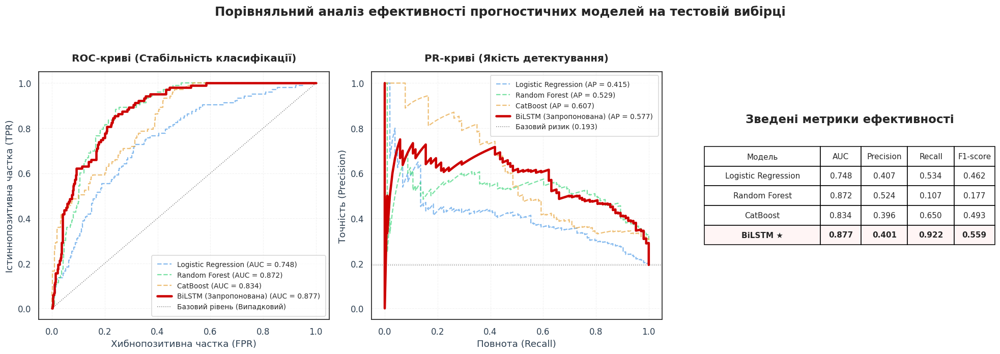

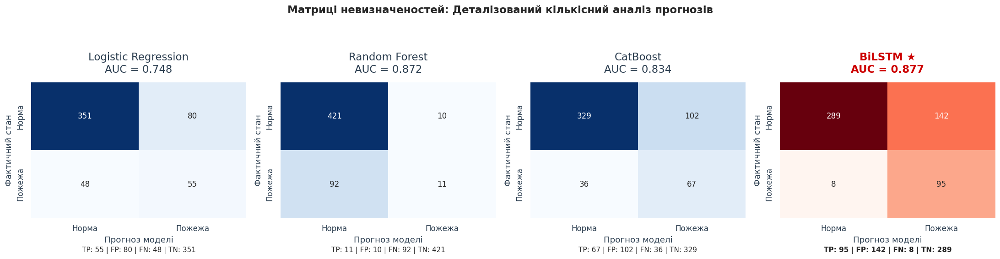

In [ ]:
# --- ФАЗА 4.3. Візуальний та кількісний порівняльний аналіз прогностичних моделей ---

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, precision_recall_curve, classification_report, confusion_matrix

# 1. Відбір навчених моделей для візуалізації та налаштування колірної палітри
PLOT_MODELS = {
    name: results[name]
    for name in ['Logistic Regression', 'Random Forest', 'CatBoost', 'LSTM']
    if name in results
}

COLORS_SCHEME = {
    'Logistic Regression': '#549EE8', # Світло-синій
    'Random Forest':       '#42D67E', # Зелений
    'CatBoost':            '#E8A63F', # Помаранчевий
    'LSTM':                '#CC0000', # Насичений червоний (для виділення цільової моделі)
}

# Ініціалізація загального графічного полотна (3 панелі: ROC, PR, Таблиця метрик)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle(
    'Порівняльний аналіз ефективності прогностичних моделей на тестовій вибірці',
    fontsize=16, fontweight='bold', y=1.05
)

# --- 2. Візуалізація ROC-кривих (Аналіз дискримінативної здатності) ---
ax = axes[0]
for name, res in PLOT_MODELS.items():
    fpr, tpr, _ = roc_curve(y_test, res['proba'])
    is_main = (name == 'LSTM')
    label = 'BiLSTM (Запропонована)' if is_main else name

    ax.plot(
        fpr, tpr,
        color=COLORS_SCHEME[name],
        lw=3 if is_main else 1.5,
        linestyle='-' if is_main else '--',
        alpha=1.0 if is_main else 0.7,
        label=f'{label} (AUC = {res["auc"]:.3f})',
        zorder=5 if is_main else 2,
    )

ax.plot([0, 1], [0, 1], color='gray', linestyle=':', lw=1, label='Базовий рівень (Випадковий)')
ax.set_title('ROC-криві (Стабільність класифікації)', fontsize=13, fontweight='bold')
ax.set_xlabel('Хибнопозитивна частка (FPR)')
ax.set_ylabel('Істиннопозитивна частка (TPR)')
ax.legend(fontsize=9, loc='lower right')
ax.grid(True, alpha=0.3)

# --- 3. Візуалізація PR-кривих (Аналіз компромісу Точність-Повнота) ---
ax = axes[1]
for name, res in PLOT_MODELS.items():
    p, r, _ = precision_recall_curve(y_test, res['proba'])
    is_main = (name == 'LSTM')
    label = 'BiLSTM (Запропонована)' if is_main else name

    ax.plot(
        r, p,
        color=COLORS_SCHEME[name],
        lw=3 if is_main else 1.5,
        linestyle='-' if is_main else '--',
        alpha=1.0 if is_main else 0.7,
        label=f'{label} (AP = {res["ap"]:.3f})',
        zorder=5 if is_main else 2,
    )

ax.axhline(y_test.mean(), color='gray', linestyle=':', lw=1, label=f'Базовий ризик ({y_test.mean():.3f})')
ax.set_xlabel('Повнота (Recall)')
ax.set_ylabel('Точність (Precision)')
ax.set_title('PR-криві (Якість детектування)', fontsize=13, fontweight='bold')
ax.legend(fontsize=9, loc='upper right')
ax.grid(True, alpha=0.3)

# --- 4. Генерація зведеної таблиці метрик ефективності ---
ax = axes[2]
ax.axis('off')
rows = []

for name, res in PLOT_MODELS.items():
    rep = classification_report(y_test, res['pred'], output_dict=True, zero_division=0)
    label = 'BiLSTM ★' if name == 'LSTM' else name
    rows.append([
        label,
        f'{res["auc"]:.3f}',
        f'{rep["1"]["precision"]:.3f}',
        f'{rep["1"]["recall"]:.3f}',
        f'{rep["1"]["f1-score"]:.3f}',
    ])

table = ax.table(
    cellText=rows,
    colLabels=['Модель', 'AUC', 'Precision', 'Recall', 'F1-score'],
    cellLoc='center', loc='center',
    colWidths=[0.40, 0.14, 0.16, 0.16, 0.14]
)
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.0, 2.2)

# Візуальне акцентування уваги на результатах розробленої архітектури (BiLSTM)
for i, row in enumerate(rows):
    if '★' in row[0]:
        for j in range(5):
            table[i + 1, j].set_facecolor('#FFF5F5')
            table[i + 1, j].set_text_props(fontweight='bold')

ax.set_title('Зведені метрики ефективності', fontweight='bold', y=0.75)

plt.tight_layout()
plt.show()

# --- 5. Кількісний аналіз матриць помилок (Confusion Matrices) ---
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle('Матриці невизначеностей: Деталізований кількісний аналіз прогнозів', fontsize=15, fontweight='bold', y=1.08)

for ax, (name, res) in zip(axes, PLOT_MODELS.items()):
    is_main = (name == 'LSTM')
    cm = confusion_matrix(y_test, res['pred'])
    label = 'BiLSTM ★' if is_main else name

    # Використання контрастної палітри для цільової моделі
    sns.heatmap(
        cm, annot=True, fmt='d',
        cmap='Reds' if is_main else 'Blues',
        ax=ax,
        xticklabels=['Норма', 'Пожежа'],
        yticklabels=['Норма', 'Пожежа'],
        cbar=False,
    )

    tn, fp, fn, tp = cm.ravel()
    ax.set_title(
        f'{label}\nAUC = {res["auc"]:.3f}',
        fontweight='bold' if is_main else 'normal',
        color='#CC0000' if is_main else '#2C3E50',
    )
    ax.set_xlabel('Прогноз моделі')
    ax.set_ylabel('Фактичний стан')

    # Інтеграція технічних показників (TP, FP, FN, TN) безпосередньо під матрицею
    metrics_text = f'TP: {tp} | FP: {fp} | FN: {fn} | TN: {tn}'
    ax.text(0.5, -0.25, metrics_text, ha='center', transform=ax.transAxes,
            fontsize=10, fontweight='bold' if is_main else 'normal')

plt.tight_layout()
plt.show()

### 4.4. Криві навчання та трирівнева система попередження

Графік кривих навчання показує AUC та функцію втрат на тренувальній і валідаційній вибірках по епохах. Розрив між тренувальною та валідаційною кривими свідчить про **перенавчання**, а вертикальна пунктирна лінія позначає епоху, на якій модель досягла найкращої валідаційної метрики (і чиї ваги відновила рання зупинка).

Трирівнева система попередження переводить неперервну ймовірність моделі у три практично корисні рівні тривоги: **🟢 зелений** (< 0.30) — звичайний моніторинг, **🟠 помаранчевий** (0.30–0.70) — обмеження відвідування лісу, **🔴 червоний** (> 0.70) — мобілізація сил пожежогасіння. Графік ілюструє, як модель ставила б ці рівні протягом тестового періоду; чорні точки — реальні дні зі значною пожежною активністю.


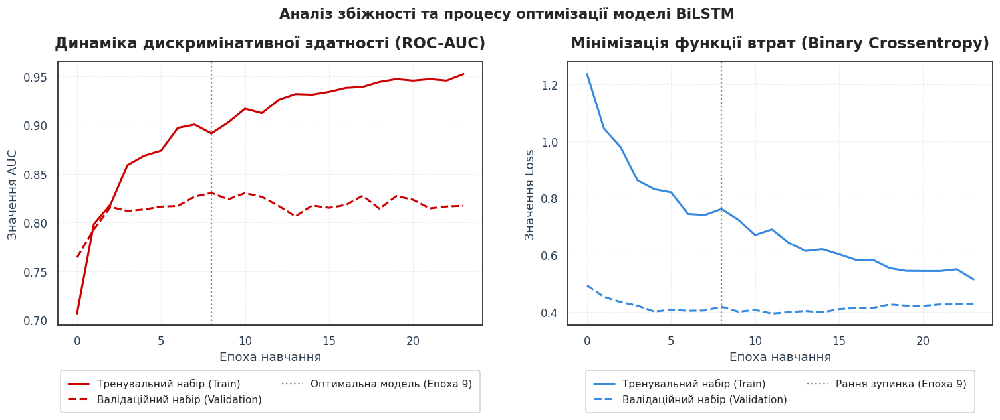

In [ ]:
# --- ФАЗА 4.4. Візуальний аналіз динаміки навчання нейромережі ---

import numpy as np
import matplotlib.pyplot as plt

# Ініціалізація загального графічного полотна (висоту збільшено до 6 для розміщення легенди знизу)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Аналіз збіжності та процесу оптимізації моделі BiLSTM', fontsize=14, fontweight='bold')

# Ідентифікація епохи з максимальним значенням AUC на валідаційній вибірці
best_epoch = np.argmax(history.history['val_auc'])

# --- 1. Візуалізація динаміки цільової метрики (AUC) ---
axes[0].plot(history.history['auc'], label='Тренувальний набір (Train)', color='#CC0000', lw=2)
axes[0].plot(history.history['val_auc'], label='Валідаційний набір (Validation)', color='#CC0000', lw=2, linestyle='--')

# Маркування епохи з оптимальними ваговими коефіцієнтами
axes[0].axvline(best_epoch, color='gray', lw=1.5, linestyle=':',
                label=f'Оптимальна модель (Епоха {best_epoch + 1})')

axes[0].set_title('Динаміка дискримінативної здатності (ROC-AUC)')
axes[0].set_xlabel('Епоха навчання')
axes[0].set_ylabel('Значення AUC')
axes[0].grid(True, linestyle='--', alpha=0.4)

# Винесення легенди за межі графіка (вниз по центру у 2 колонки)
axes[0].legend(fontsize=10, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2, framealpha=0.9)

# --- 2. Візуалізація процесу мінімізації функції втрат (Loss) ---
axes[1].plot(history.history['loss'], label='Тренувальний набір (Train)', color='#378ADD', lw=2)
axes[1].plot(history.history['val_loss'], label='Валідаційний набір (Validation)', color='#378ADD', lw=2, linestyle='--')

# Маркування тієї ж епохи на графіку Loss для консистентності
axes[1].axvline(best_epoch, color='gray', lw=1.5, linestyle=':',
                label=f'Рання зупинка (Епоха {best_epoch + 1})')

axes[1].set_title('Мінімізація функції втрат (Binary Crossentropy)')
axes[1].set_xlabel('Епоха навчання')
axes[1].set_ylabel('Значення Loss')
axes[1].grid(True, linestyle='--', alpha=0.4)

axes[1].legend(fontsize=10, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2, framealpha=0.9)

# Оптимізація геометрії та відображення
plt.tight_layout()
plt.show()

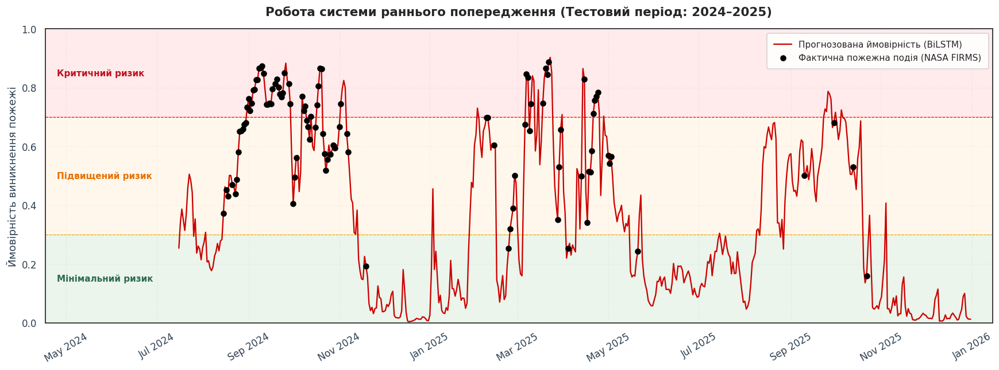

-----------------------------------------------------------------
[Успіх] Навчання та тестування завершено. Модель збережена:
/content/drive/MyDrive/forest_fire_project/bilstm_fire_prediction_final.keras
-----------------------------------------------------------------

[Статистика] Порівняльна ефективність алгоритмів (Тестова вибірка):
Модель                    | AUC      | F1-score
--------------------------------------------------
Logistic Regression       | 0.7476   | 0.4622
Random Forest             | 0.8718   | 0.1774
CatBoost                  | 0.8345   | 0.4926
BiLSTM ★                  | 0.8773   | 0.5588

[Статистика] Розподіл прогнозних станів ризику (Тестовий період 2024–2025):
  Низький (Зелений)     :  268 діб ( 50.2%)
  Середній (Помаранчевий):  194 діб ( 36.3%)
  Високий (Червоний)    :   72 діб ( 13.5%)
-----------------------------------------------------------------


In [ ]:
# --- ФАЗА 4.5. Інтеграція моделі в систему раннього попередження та експорт результатів ---

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def get_risk_level(prob):
    """
    Категоризація безперервної ймовірності у дискретні рівні управлінського ризику.
    Повертає: (Код рівня, HEX-колір, Текстова мітка)
    """
    if prob < 0.30:
        return 0, '#2d6a4f', 'ЗЕЛЕНИЙ'
    elif prob < 0.70:
        return 1, '#e76f00', 'ПОМАРАНЧЕВИЙ'
    else:
        return 2, '#c1121f', 'ЧЕРВОНИЙ'

# 1. Ізоляція хронологічного вектора для тестової вибірки
# Усунення перших TIME_STEPS діб, які були поглинуті алгоритмом ковзного вікна
test_dates = (
    fe_scaled[test_mask]
    .sort_values('date')
    .reset_index(drop=True)['date']
    .values[TIME_STEPS:]
)

# Формування зведеного датафрейму з результатами прогнозування
df_forecast = pd.DataFrame({
    'date':        pd.to_datetime(test_dates[:len(lstm_proba)]),
    'probability': lstm_proba,
    'actual':      y_test,
})

# Застосування функції категоризації ризиків
df_forecast['risk_level'] = df_forecast['probability'].apply(lambda p: get_risk_level(p)[0])

# --- 2. Візуалізація хронології ризиків (Decision Support Dashboard) ---
fig, ax = plt.subplots(figsize=(16, 6))

# Формування візуальних зон ризику (Background Spans)
ax.axhspan(0.00, 0.30, color='green', alpha=0.08)
ax.axhspan(0.30, 0.70, color='orange', alpha=0.08)
ax.axhspan(0.70, 1.00, color='red', alpha=0.08)

# Маркування математичних порогів прийняття рішень
ax.axhline(0.30, color='orange', lw=0.8, linestyle='--')
ax.axhline(0.70, color='red',    lw=0.8, linestyle='--')

# Побудова кривої прогностичної ймовірності
ax.plot(df_forecast['date'], df_forecast['probability'], color='#CC0000', lw=1.5,
        label='Прогнозована ймовірність (BiLSTM)')

# Накладання емпіричних даних (фактично зафіксовані супутником пожежі)
fire_days = df_forecast[df_forecast['actual'] == 1]
ax.scatter(fire_days['date'], fire_days['probability'], color='black', s=35, zorder=5,
           label='Фактична пожежна подія (NASA FIRMS)')

# Форматування геометрії простору та підписів
start_date = df_forecast['date'].min()
end_date = df_forecast['date'].max()
ax.set_xlim(start_date - pd.Timedelta(days=90), end_date + pd.Timedelta(days=15))

# Анотування зон ризику
text_x = start_date - pd.Timedelta(days=82)
ax.text(text_x, 0.15, 'Мінімальний ризик', fontsize=10, color='#2d6a4f', fontweight='bold', va='center')
ax.text(text_x, 0.50, 'Підвищений ризик', fontsize=10, color='#e76f00', fontweight='bold', va='center')
ax.text(text_x, 0.85, 'Критичний ризик', fontsize=10, color='#c1121f', fontweight='bold', va='center')

ax.set_ylim(0, 1)
ax.set_ylabel('Ймовірність виникнення пожежі', fontsize=12)
ax.set_title('Робота системи раннього попередження (Тестовий період: 2024–2025)',
             fontsize=14, fontweight='bold', pad=15)

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=30)
ax.grid(True, alpha=0.2)
ax.legend(loc='upper right', fontsize=10, framealpha=0.9)

plt.tight_layout()
plt.show()

# --- 3. Експорт результатів та формування підсумкового системного звіту ---

# Фізичне збереження навченої архітектури у сучасному форматі Keras
model_path = f'{PROJECT_DIR}/bilstm_fire_prediction_final.keras'
model.save(model_path)

risk_counts = df_forecast['risk_level'].value_counts().sort_index()
risk_labels  = {0: 'Низький (Зелений)', 1: 'Середній (Помаранчевий)', 2: 'Високий (Червоний)'}

# Генерація формалізованого звіту
print("-" * 65)
print(f"[Успіх] Навчання та тестування завершено. Модель збережена:\n{model_path}")
print("-" * 65)
print("\n[Статистика] Порівняльна ефективність алгоритмів (Тестова вибірка):")
print(f"{'Модель':<25} | {'AUC':<8} | {'F1-score':<8}")
print("-" * 50)

for name, res in PLOT_MODELS.items():
    label = 'BiLSTM ★' if name == 'LSTM' else name
    f1 = f1_score(y_test, res['pred'], zero_division=0)
    print(f"{label:<25} | {res['auc']:.4f}   | {f1:.4f}")

print("\n[Статистика] Розподіл прогнозних станів ризику (Тестовий період 2024–2025):")
for level, count in risk_counts.items():
    pct = (count / len(df_forecast)) * 100
    print(f"  {risk_labels[level]:<22}: {count:>4} діб ({pct:>5.1f}%)")
print("-" * 65)

### 4.5. Важливість ознак (Feature Importance)

CatBoost працює з пласким вектором `[F·14]`, де кожна ознака повторена 14 разів — по одному разу для кожного часового кроку у вікні. Щоб отримати важливість **базових** ознак, важливості всіх 14 копій сумуються.

Стовпчики кольором кодують **групу ознак** (FWI-компоненти, температурні, вологість, опади, вітер, ґрунт, календарні, ковзні). Якщо у топ-важливих переважають фізично осмислені групи (VPD, дні без дощу, FWI, температура), це підтверджує, що модель навчилася правильної фізики, а не випадкових артефактів.


#### 4.5.1. Розрахунок та візуалізація важливості для Cat Boost

Код нижче читає `cb.get_feature_importance()`, агрегує важливості за базовою назвою (відкидаючи суфікс `_tN`), сортує і виводить топ-25 у вигляді горизонтальної стовпчикової діаграми із кольоровою легендою груп.


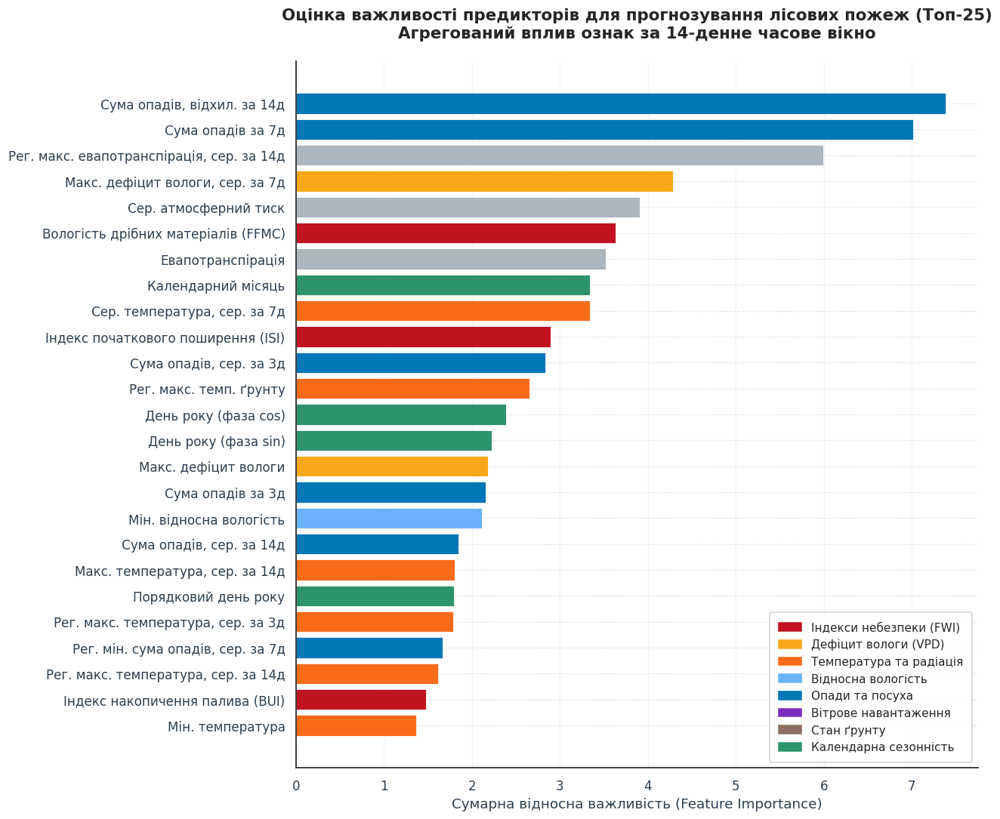

In [43]:
# --- ФАЗА 4.6. Аналіз важливості метеорологічних предикторів (Feature Importance) ---

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# --- 1. Агрегація важливості ознак за всіма хронологічними кроками (Time Steps) ---
# Формування списку розгорнутих ознак (відповідно до логіки сплющення 3D-тензора у 2D-матрицю)
feature_names_2d = [f'{col}_t{t}' for t in range(TIME_STEPS) for col in FEATURE_COLS]

# Отримання масиву важливості з навченої моделі градієнтного бустингу (Proxy-інтерпретатор)
cb_importance = cb.get_feature_importance()

# Агрегація показників: підсумовування ваги параметра за всі 14 діб історичного вікна
importance_by_feature = {}
for score, name in zip(cb_importance, feature_names_2d):
    base = name.rsplit('_t', 1)[0]
    importance_by_feature[base] = importance_by_feature.get(base, 0) + score

# Відбір топ-N найвпливовіших предикторів
top_n = 25
sorted_features = sorted(importance_by_feature.items(), key=lambda x: x[1], reverse=True)[:top_n]

raw_feat_names = [f[0] for f in sorted_features]
feat_scores    = [f[1] for f in sorted_features]

# --- 2. Модуль семантичної трансформації (Парсер технічних назв) ---

def translate_feature(name):
    """
    Декомпозиція технічних ідентифікаторів змінних та їх трансформація
    в україномовні терміни для фінальної звітності.
    """
    res = name.replace(' ', '_').lower()

    # 2.1. Пряме відображення (Специфічні індекси та календарні ознаки)
    direct_mapping = {
        'fwi': 'Індекс пожежної небезпеки (FWI)',
        'ffmc': 'Вологість дрібних матеріалів (FFMC)',
        'dmc': 'Вологість лісової підстилки (DMC)',
        'dc': 'Індекс посухи (DC)',
        'isi': 'Індекс початкового поширення (ISI)',
        'bui': 'Індекс накопичення палива (BUI)',
        'days_no_rain': 'Тривалість періоду без опадів',
        'month': 'Календарний місяць',
        'season': 'Кліматичний сезон',
        'doy_sin': 'День року (фаза sin)',
        'doy_cos': 'День року (фаза cos)',
        'day_of_year_sin': 'День року (фаза sin)',
        'day_of_year_cos': 'День року (фаза cos)',
        'day_of_year': 'Порядковий день року'
    }
    if res in direct_mapping:
        return direct_mapping[res]

    # 2.2. Ідентифікація базового метеорологічного параметра
    base_dict = {
        'temperature_2m': 'температура',
        'relative_humidity_2m': 'відносна вологість',
        'vapour_pressure_deficit': 'дефіцит вологи',
        'vpd': 'VPD (дефіцит вологи)',
        'wind_speed_10m': 'швидкість вітру',
        'wind_gusts_10m': 'пориви вітру',
        'soil_moisture_0_to_7cm': 'вологість ґрунту',
        'soil_moisture': 'вологість ґрунту',
        'soil_temperature_0_to_7cm': 'темп. ґрунту',
        'precipitation_sum': 'сума опадів',
        'rain_sum': 'сума опадів',
        'shortwave_radiation_sum': 'сонячна радіація',
        'et0_fao_evapotranspiration': 'евапотранспірація',
        'surface_pressure': 'атмосферний тиск'
    }
    for eng, ukr in base_dict.items():
        if eng in res:
            res = res.replace(eng, ukr)
            break

    # 2.3. Ідентифікація просторової метрики (Агрегація Bounding Box)
    spatial_dict = {
        '_max_reg_max': 'Рег. макс.',
        '_mean_reg_max': 'Рег. макс.',
        '_mean_reg_min': 'Рег. мін.',
        '_min_reg_min': 'Рег. мін.',
        '_reg_max': 'Рег. макс.',
        '_reg_min': 'Рег. мін.',
        '_max': 'Макс.',
        '_min': 'Мін.',
        '_mean': 'Сер.'
    }
    spatial_prefix = ""
    for eng, ukr in spatial_dict.items():
        if eng in res:
            spatial_prefix = ukr
            res = res.replace(eng, '')
            break

    # 2.4. Ідентифікація часової метрики (Ковзні вікна)
    temporal_suffix = ""
    if '_std14' in res or 'std14' in res: temporal_suffix = "відхил. за 14д"; res = res.replace('_std14','').replace('std14','')
    elif '_std7' in res or 'std7' in res: temporal_suffix = "відхил. за 7д"; res = res.replace('_std7','').replace('std7','')
    elif '_std3' in res or 'std3' in res: temporal_suffix = "відхил. за 3д"; res = res.replace('_std3','').replace('std3','')
    elif '_ma14' in res or 'ma14' in res: temporal_suffix = "сер. за 14д"; res = res.replace('_ma14','').replace('ma14','')
    elif '_ma7' in res or 'ma7' in res: temporal_suffix = "сер. за 7д"; res = res.replace('_ma7','').replace('ma7','')
    elif '_ma3' in res or 'ma3' in res: temporal_suffix = "сер. за 3д"; res = res.replace('_ma3','').replace('ma3','')
    elif '_sum14' in res or 'sum14' in res: temporal_suffix = "за 14д"; res = res.replace('_sum14','').replace('sum14','')
    elif '_sum7' in res or 'sum7' in res: temporal_suffix = "за 7д"; res = res.replace('_sum7','').replace('sum7','')
    elif '_sum3' in res or 'sum3' in res: temporal_suffix = "за 3д"; res = res.replace('_sum3','').replace('sum3','')

    # 2.5. Синтез фінальної фрази
    base_name = res.replace('_', ' ').strip()

    if not base_name and spatial_prefix:
        base_name = spatial_prefix
        spatial_prefix = ""

    final_parts = []
    if spatial_prefix:
        final_parts.append(f"{spatial_prefix} {base_name}")
    else:
        final_parts.append(base_name)

    main_phrase = " ".join(final_parts)

    # Інтеграція часового суфікса з уникненням тавтології
    if temporal_suffix:
        if "сума опадів" in main_phrase and temporal_suffix.startswith("за "):
            main_phrase = f"{main_phrase} {temporal_suffix}"
        else:
            main_phrase = f"{main_phrase}, {temporal_suffix}"

    main_phrase = main_phrase.replace('  ', ' ').strip()
    if main_phrase:
        main_phrase = main_phrase[0].upper() + main_phrase[1:]

    return main_phrase

translated_names = [translate_feature(n) for n in raw_feat_names]

# --- 3. Фізична категоризація та колірне кодування ---

def get_color(name):
    """Призначення кольору на основі фізичної природи предиктора."""
    name_lower = name.lower()
    if any(x in name_lower for x in ['fwi', 'ffmc', 'dmc', 'dc', 'isi', 'bui']):
        return '#C1121F' # Червоний - Комплексні індекси небезпеки
    elif 'vpd' in name_lower or 'vapour' in name_lower:
        return '#FAA719' # Помаранчевий - Дефіцит вологи (VPD)
    elif 'temp' in name_lower or 'radiation' in name_lower:
        return '#FA6B19' # Теплий червоний - Термодинамічні фактори
    elif 'humid' in name_lower:
        return '#6BB2FA' # Блакитний - Вологість повітря
    elif 'precip' in name_lower or 'rain' in name_lower:
        return '#0077B6' # Темно-синій - Режим зволоження
    elif 'wind' in name_lower:
        return '#7B2CBF' # Фіолетовий - Аеродинамічний режим
    elif 'soil' in name_lower:
        return '#8D6E63' # Коричневий - Стан лісової підстилки/ґрунту
    elif any(x in name_lower for x in ['doy', 'month', 'season', 'day_of', 'день року']):
        return '#2D936C' # Зелений - Астрономічні/Календарні фактори
    else:
        return '#ADB5BD' # Сірий - Інші параметри

colors = [get_color(n) for n in raw_feat_names]

# --- 4. Візуалізація рейтингу важливості предикторів ---

fig, ax = plt.subplots(figsize=(12, 10))

bars = ax.barh(
    range(top_n), feat_scores[::-1],
    color=colors[::-1], edgecolor='white', lw=0.5
)

ax.set_yticks(range(top_n))
ax.set_yticklabels(translated_names[::-1], fontsize=11)
ax.set_xlabel('Сумарна відносна важливість (Feature Importance)', fontsize=12)

ax.set_title(
    f'Оцінка важливості предикторів для прогнозування лісових пожеж (Топ-{top_n})\n'
    'Агрегований вплив ознак за 14-денне часове вікно',
    fontsize=14, fontweight='bold', pad=20
)

# Форматування координатної площини
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(True, axis='x', linestyle='--', alpha=0.4)

# Формування семантичної легенди
legend_items = [
    mpatches.Patch(color='#C1121F', label='Індекси небезпеки (FWI)'),
    mpatches.Patch(color='#FAA719', label='Дефіцит вологи (VPD)'),
    mpatches.Patch(color='#FA6B19', label='Температура та радіація'),
    mpatches.Patch(color='#6BB2FA', label='Відносна вологість'),
    mpatches.Patch(color='#0077B6', label='Опади та посуха'),
    mpatches.Patch(color='#7B2CBF', label='Вітрове навантаження'),
    mpatches.Patch(color='#8D6E63', label='Стан ґрунту'),
    mpatches.Patch(color='#2D936C', label='Календарна сезонність')
]
ax.legend(handles=legend_items, loc='lower right', fontsize=10, framealpha=0.9)

plt.tight_layout()
plt.show()

#### 4.5.2. Розрахунок та візуалізація важливості для BiLSTM

[Інформація] Базовий ROC-AUC на тестовій вибірці: 0.8773


Тасування ознак (Permutation):   0%|          | 0/20 [00:00<?, ?it/s]


[Статистика] Топ-20 ознак за середнім зниженням ΔAUC:
  precipitation_sum_reg_min_std14                  0.0144 ± 0.0021
  relative_humidity_2m_max                         0.0083 ± 0.0030
  relative_humidity_2m_min_reg_min                 0.0082 ± 0.0024
  sunshine_duration                                0.0079 ± 0.0018
  temperature_2m_mean_reg_max_std14                0.0079 ± 0.0020
  relative_humidity_2m_mean                        0.0073 ± 0.0016
  is_fire_season                                   0.0072 ± 0.0019
  temperature_2m_mean_std14                        0.0066 ± 0.0017
  vapour_pressure_deficit_max_ma3                  0.0065 ± 0.0023
  temperature_2m_max_reg_max_std7                  0.0062 ± 0.0019
  surface_pressure_mean                            0.0058 ± 0.0017
  shortwave_radiation_sum_reg_max                  0.0055 ± 0.0023
  temperature_2m_max_std14                         0.0053 ± 0.0015
  DC                                               0.0053 ± 0.0026
  FWI  

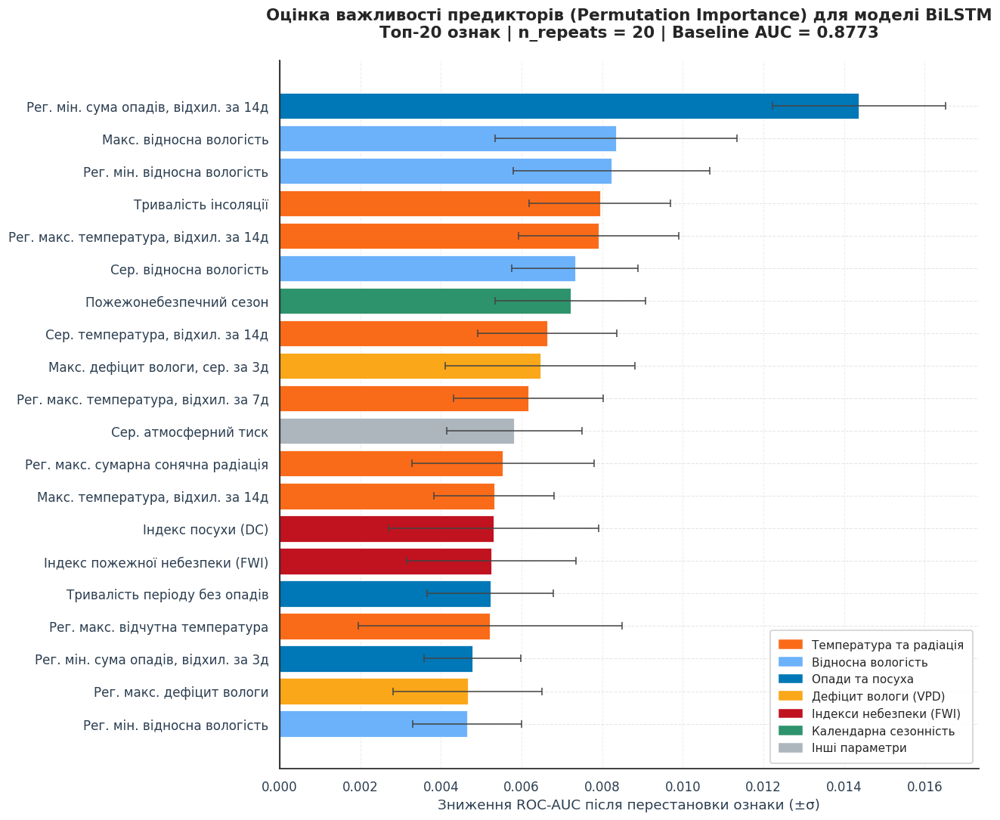


[Збереження] Графік експортовано: /content/drive/MyDrive/forest_fire_project/permutation_importance_lstm.png


In [44]:
# --- ФАЗА 4.7. Permutation Importance для BiLSTM (Аналіз важливості ознак) ---

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.metrics import roc_auc_score
from tqdm.auto import tqdm

# --- 1. Параметри симуляції ---
N_REPEATS = 20            # Кількість тасувань для стабілізації результатів
TOP_N     = 20            # Кількість ознак для відображення на графіку
SEED      = RANDOM_STATE  # Фіксація випадковості для відтворюваності

# --- 2. Обчислення Permutation Importance ---
rng = np.random.default_rng(SEED)

# Базова оцінка моделі на тестовій вибірці (до перемішування)
baseline_proba = model.predict(X_test, verbose=0).flatten()
baseline_auc   = roc_auc_score(y_test, baseline_proba)
print(f'[Інформація] Базовий ROC-AUC на тестовій вибірці: {baseline_auc:.4f}')

deltas = {f: [] for f in FEATURE_COLS}

for repeat in tqdm(range(N_REPEATS), desc='Тасування ознак (Permutation)'):
    for f_idx, fname in enumerate(FEATURE_COLS):
        X_perm = X_test.copy()

        # Випадкове перемішування значень конкретної ознаки
        perm = rng.permutation(X_perm.shape[0])
        X_perm[:, :, f_idx] = X_perm[perm, :, f_idx]

        # Оцінка падіння метрики
        auc_perm = roc_auc_score(y_test, model.predict(X_perm, verbose=0).flatten())
        deltas[fname].append(baseline_auc - auc_perm)

# Зведена таблиця (Середнє падіння AUC ± стандартне відхилення)
df_imp = pd.DataFrame({
    'mean': {f: np.mean(v) for f, v in deltas.items()},
    'std':  {f: np.std(v)  for f, v in deltas.items()},
}).sort_values('mean', ascending=False)

print(f'\n[Статистика] Топ-{TOP_N} ознак за середнім зниженням ΔAUC:')
for f, row in df_imp.head(TOP_N).iterrows():
    print(f'  {f:<48} {row["mean"]:.4f} ± {row["std"]:.4f}')

# --- 3. Модуль семантичної трансформації (Синхронізовано з CatBoost) ---
def translate_feature(name: str) -> str:
    """
    Декомпозиція технічних ідентифікаторів змінних та їх трансформація
    в україномовні терміни.
    """
    res = name.replace(' ', '_').lower()

    # 3.1. Пряме відображення
    direct_mapping = {
        'fwi': 'Індекс пожежної небезпеки (FWI)',
        'ffmc': 'Вологість дрібних матеріалів (FFMC)',
        'dmc': 'Вологість лісової підстилки (DMC)',
        'dc': 'Індекс посухи (DC)',
        'isi': 'Індекс початкового поширення (ISI)',
        'bui': 'Індекс накопичення палива (BUI)',
        'days_no_rain': 'Тривалість періоду без опадів',
        'month': 'Календарний місяць',
        'season': 'Кліматичний сезон',
        'doy_sin': 'День року (фаза sin)',
        'doy_cos': 'День року (фаза cos)',
        'day_of_year_sin': 'День року (фаза sin)',
        'day_of_year_cos': 'День року (фаза cos)',
        'day_of_year': 'Порядковий день року',
        'is_fire_season': 'Пожежонебезпечний сезон'
    }
    if res in direct_mapping:
        return direct_mapping[res]

    # 3.2. Базові метеопараметри
    base_dict = {
        'temperature_2m': 'температура',
        'relative_humidity_2m': 'відносна вологість',
        'vapour_pressure_deficit': 'дефіцит вологи',
        'vpd': 'VPD (дефіцит вологи)',
        'wind_speed_10m': 'швидкість вітру',
        'wind_gusts_10m': 'пориви вітру',
        'soil_moisture_0_to_7cm': 'вологість ґрунту',
        'soil_moisture': 'вологість ґрунту',
        'soil_temperature_0_to_7cm': 'темп. ґрунту',
        'precipitation_sum': 'сума опадів',
        'rain_sum': 'сума опадів',
        'shortwave_radiation_sum': 'сумарна сонячна радіація',
        'sunshine_duration': 'тривалість інсоляції',
        'et0_fao_evapotranspiration': 'евапотранспірація',
        'surface_pressure': 'атмосферний тиск',
        'dew_point_2m': 'точка роси',
        'apparent_temperature': 'відчутна температура'
    }
    for eng, ukr in base_dict.items():
        if eng in res:
            res = res.replace(eng, ukr)
            break

    # 3.3. Просторові префікси
    spatial_dict = {
        '_max_reg_max': 'Рег. макс.',
        '_mean_reg_max': 'Рег. макс.',
        '_mean_reg_min': 'Рег. мін.',
        '_min_reg_min': 'Рег. мін.',
        '_reg_max': 'Рег. макс.',
        '_reg_min': 'Рег. мін.',
        '_max': 'Макс.',
        '_min': 'Мін.',
        '_mean': 'Сер.'
    }
    spatial_prefix = ""
    for eng, ukr in spatial_dict.items():
        if eng in res:
            spatial_prefix = ukr
            res = res.replace(eng, '')
            break

    # 3.4. Часові суфікси
    temporal_suffix = ""
    if '_std14' in res or 'std14' in res: temporal_suffix = "відхил. за 14д"; res = res.replace('_std14','').replace('std14','')
    elif '_std7' in res or 'std7' in res: temporal_suffix = "відхил. за 7д"; res = res.replace('_std7','').replace('std7','')
    elif '_std3' in res or 'std3' in res: temporal_suffix = "відхил. за 3д"; res = res.replace('_std3','').replace('std3','')
    elif '_ma14' in res or 'ma14' in res: temporal_suffix = "сер. за 14д"; res = res.replace('_ma14','').replace('ma14','')
    elif '_ma7' in res or 'ma7' in res: temporal_suffix = "сер. за 7д"; res = res.replace('_ma7','').replace('ma7','')
    elif '_ma3' in res or 'ma3' in res: temporal_suffix = "сер. за 3д"; res = res.replace('_ma3','').replace('ma3','')
    elif '_sum14' in res or 'sum14' in res: temporal_suffix = "за 14д"; res = res.replace('_sum14','').replace('sum14','')
    elif '_sum7' in res or 'sum7' in res: temporal_suffix = "за 7д"; res = res.replace('_sum7','').replace('sum7','')
    elif '_sum3' in res or 'sum3' in res: temporal_suffix = "за 3д"; res = res.replace('_sum3','').replace('sum3','')

    base_name = res.replace('_', ' ').strip()
    if not base_name and spatial_prefix:
        base_name = spatial_prefix
        spatial_prefix = ""

    final_parts = []
    if spatial_prefix:
        final_parts.append(f"{spatial_prefix} {base_name}")
    else:
        final_parts.append(base_name)

    main_phrase = " ".join(final_parts)

    if temporal_suffix:
        if "сума опадів" in main_phrase and temporal_suffix.startswith("за "):
            main_phrase = f"{main_phrase} {temporal_suffix}"
        else:
            main_phrase = f"{main_phrase}, {temporal_suffix}"

    main_phrase = main_phrase.replace('  ', ' ').strip()
    if main_phrase:
        main_phrase = main_phrase[0].upper() + main_phrase[1:]

    return main_phrase

# --- 4. Фізична категоризація та колірне кодування ---
GROUP_COLORS = {
    'Індекси небезпеки (FWI)': '#C1121F',
    'Дефіцит вологи (VPD)': '#FAA719',
    'Температура та радіація': '#FA6B19',
    'Відносна вологість': '#6BB2FA',
    'Опади та посуха': '#0077B6',
    'Вітрове навантаження': '#7B2CBF',
    'Стан ґрунту': '#8D6E63',
    'Календарна сезонність': '#2D936C',
    'Інші параметри': '#ADB5BD',
}

def feature_group(name: str) -> str:
    n = name.lower()
    if any(k in n for k in ['ffmc','dmc','isi','bui','fwi']) or 'dc' == n or '_dc' in n:
        return 'Індекси небезпеки (FWI)'
    if 'vpd' in n or 'vapour' in n:
        return 'Дефіцит вологи (VPD)'
    if 'temp' in n or 'radiation' in n or 'sunshine' in n or 'apparent' in n:
        return 'Температура та радіація'
    if 'humid' in n:
        return 'Відносна вологість'
    if 'precip' in n or 'rain' in n or 'days_no_rain' in n:
        return 'Опади та посуха'
    if 'wind' in n:
        return 'Вітрове навантаження'
    if 'soil' in n:
        return 'Стан ґрунту'
    if any(k in n for k in ['doy','month','season','day_of', 'день року']):
        return 'Календарна сезонність'
    return 'Інші параметри'


# --- 5. Візуалізація результатів ---
top = df_imp.head(TOP_N).iloc[::-1]
labels  = [translate_feature(f) for f in top.index]
colors  = [GROUP_COLORS[feature_group(f)] for f in top.index]

fig, ax = plt.subplots(figsize=(12, 10))
ax.barh(
    range(len(top)),
    top['mean'].values,
    xerr=top['std'].values,
    color=colors,
    edgecolor='white', lw=0.5,
    error_kw={'ecolor': '#444', 'capsize': 3, 'lw': 1},
)

ax.set_yticks(range(len(top)))
ax.set_yticklabels(labels, fontsize=11)
ax.set_xlabel('Зниження ROC-AUC після перестановки ознаки (±σ)', fontsize=12)
ax.set_title(
    f'Оцінка важливості предикторів (Permutation Importance) для моделі BiLSTM\n'
    f'Топ-{TOP_N} ознак | n_repeats = {N_REPEATS} | Baseline AUC = {baseline_auc:.4f}',
    fontsize=14, fontweight='bold', pad=20
)

# Форматування координатної площини
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(True, axis='x', linestyle='--', alpha=0.4)
ax.axvline(0, color='black', lw=0.8)

# Динамічна генерація семантичної легенди (тільки для присутніх груп)
groups_used = sorted(
    {feature_group(f) for f in top.index},
    key=lambda g: -df_imp.loc[[f for f in top.index if feature_group(f) == g], 'mean'].sum()
)
legend_patches = [mpatches.Patch(color=GROUP_COLORS[g], label=g) for g in groups_used]
ax.legend(handles=legend_patches, loc='lower right', fontsize=10, framealpha=0.95)

plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/permutation_importance_lstm.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'\n[Збереження] Графік експортовано: {PROJECT_DIR}/permutation_importance_lstm.png')

In [ ]:
from sklearn.inspection import permutation_importance

# Wrapper для Keras-моделі (sklearn чекає на API .predict_proba)
class KerasWrapper:
    def __init__(self, model):
        self.model = model
        self.classes_ = np.array([0, 1])
    def fit(self, *args, **kwargs): return self
    def predict_proba(self, X):
        p = self.model.predict(X.reshape(-1, X_test.shape[1], X_test.shape[2]),
                                verbose=0).flatten()
        return np.column_stack([1-p, p])

wrapped = KerasWrapper(model)
X_test_2d = X_test.reshape(X_test.shape[0], -1)   # sklearn хоче 2D

result = permutation_importance(
    wrapped, X_test_2d, y_test,
    n_repeats=20,
    random_state=42,
    scoring='roc_auc',
    n_jobs=1,
)
# result.importances_mean і result.importances_std вже готові


### 4.6. Анімована карта ризику пожеж по днях

Замість одного статичного графіка часового ряду — **інтерактивна карта з кнопкою «Play» і повзунком дат**. Кожен кадр відповідає одному дню тестового періоду; коло у центрі лісової зони змінює:

- **колір** — за рівнем ризику (зелений / помаранчевий / червоний),
- **розмір** — пропорційно ймовірності значної пожежі,

а фоном видно реальну лісову маску Полісся з OpenStreetMap. Це поєднує **просторову** (де розташовується ризик) і **часову** (як він еволюціонує по днях) складові в одному об'єкті — саме той тип візуалізації, який добре сприймається на захисті.

Анімація обмежується пожежонебезпечним сезоном (березень–жовтень), щоб не показувати десятки нудних зелених зимових кадрів.


In [ ]:
# --- ФАЗА 5. Просторово-часова динаміка прогнозованої пожежної небезпеки ---

import plotly.express as px
import pandas as pd
import numpy as np

# --- 1. Агрегація прогнозних даних та хронологічна синхронізація ---
# Вилучення часових міток для тестового періоду (з урахуванням зміщення ковзного вікна)
test_dates = (
    fe_scaled[test_mask]
    .sort_values('date').reset_index(drop=True)['date']
    .values[TIME_STEPS:]
)

anim_df = pd.DataFrame({
    'date':        pd.to_datetime(test_dates[:len(lstm_proba)]),
    'probability': lstm_proba,
    'actual':      y_test,
})

# Застосування розробленої функції категоризації ризиків
anim_df['risk_level'] = anim_df['probability'].apply(lambda p: get_risk_level(p)[0])
anim_df['risk_name']  = anim_df['risk_level'].map({
    0: 'Мінімальний ризик (< 30%)',
    1: 'Підвищений ризик (30-70%)',
    2: 'Критичний ризик (> 70%)',
})

# --- 2. Фільтрація часового ряду (Ізоляція пожежонебезпечного сезону) ---
# Усунення "фонового" шуму зимових місяців для покращення інформативності анімації
anim_df = anim_df[anim_df['date'].dt.month.isin(FIRE_SEASON_MONTHS)].copy()
anim_df['date_str'] = anim_df['date'].dt.strftime('%Y-%m-%d')

# --- 3. Геопросторове позиціювання ---
# Обчислення геометричного центру метеорологічної сітки досліджуваного регіону
center_lat = float(np.mean([la for la, lo in POLISSYA_POINTS.values()]))
center_lon = float(np.mean([lo for la, lo in POLISSYA_POINTS.values()]))

anim_df['lat'] = center_lat
anim_df['lon'] = center_lon

# Масштабування маркерів: пропорційно до ймовірності з базовим лімітом (clip) для візуальної стабільності
anim_df['size'] = (anim_df['probability'] * 100).clip(lower=12)

# --- 4. Конструювання об'єкта інтерактивної анімації (Mapbox) ---
fig = px.scatter_mapbox(
    anim_df.sort_values('date'),
    lat='lat', lon='lon',
    color='risk_name',
    color_discrete_map={
        'Мінімальний ризик (< 30%)': '#2D936C', # Зелений
        'Підвищений ризик (30-70%)': '#E76F00', # Помаранчевий
        'Критичний ризик (> 70%)':   '#C1121F', # Червоний
    },
    category_orders={'risk_name': [
        'Мінімальний ризик (< 30%)', 'Підвищений ризик (30-70%)', 'Критичний ризик (> 70%)'
    ]},
    size='size', size_max=55,
    animation_frame='date_str',
    labels={
        'risk_name':   'Рівень ризику',
        'probability': 'Ймовірність пожежі',
        'actual':      'Фактична пожежа (1=Так)',
        'date_str':    'Дата'
    },
    hover_data={
        'probability': ':.1%', 'actual': True,
        'lat': False, 'lon': False, 'size': False,
        'date_str': False, 'risk_name': False,
    },
    zoom=6,
    center={'lat': center_lat, 'lon': center_lon},
    height=700,
)

# --- 5. Інтеграція геоінформаційних шарів та форматування ---
# Додавання полігону лісової маски (OpenStreetMap) як напівпрозорого фонового шару
fig.update_layout(
    title=dict(
        text='Просторово-часова динаміка прогнозованої пожежної небезпеки Полісся<br>'
             '<sub>Модель: BiLSTM | Тестовий період (пожежонебезпечний сезон)</sub>',
        font=dict(size=20, family="Arial", color="black"),
        x=0.5,
        xanchor='center'
    ),
    mapbox=dict(
        style='open-street-map',
        center={'lat': center_lat, 'lon': center_lon},
        zoom=6,
        layers=[{
            'source': forest_union.__geo_interface__,
            'type':   'fill',
            'color':  'rgba(45, 147, 108, 0.25)',
            'below':  'traces',
        }],
    ),
    legend=dict(
        title='Рівень ризику',
        yanchor='top', y=0.99, xanchor='left', x=0.01,
        bgcolor='rgba(255,255,255,0.85)', bordercolor='#CCCCCC', borderwidth=1,
    ),
    margin={'r': 0, 't': 80, 'l': 0, 'b': 0},
)

# --- 6. Налаштування кінематики анімації ---
# duration: тривалість відображення кадру (мс); transition: плавність переходу
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 200
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 50

# --- 7. Експорт результатів ---
output_file = f'{PROJECT_DIR}/risk_animation.html'
fig.write_html(output_file)
fig.show()

print("-" * 65)
print(f"[Успіх] Геопросторову анімацію згенеровано та експортовано:\n{output_file}")
print("-" * 65)

-----------------------------------------------------------------
[Успіх] Геопросторову анімацію згенеровано та експортовано:
/content/drive/MyDrive/forest_fire_project/risk_animation.html
-----------------------------------------------------------------


## Фаза 5. Динамічна система попередження на актуальних даних

Завершальна фаза перевіряє роботу моделі **на реальному часі**: завантажуємо актуальну погоду через Open-Meteo, проводимо її через ту саму інженерію ознак, що й тренувальні дані, і отримуємо прогноз пожежного ризику на сьогодні з трирівневою системою тривоги.

### 5.1. Завантаження актуальної погоди

**Принципова вимога:** жива пайплайн ОБОВ'ЯЗКОВО має використовувати ту саму сітку точок `POLISSYA_POINTS`, ті самі змінні (`DAILY_VARS`, `HOURLY_VARS`) та ту саму регіональну агрегацію, що й історичний пайплайн. Інакше схема ознак не збігатиметься з навченим scaler-ом і модель отримає на вхід випадкові шумові значення.

Тягнемо погоду через `forecast`-ендпоінт з параметром `past_days=60` — це дає кілька десятків днів історії, достатньо для коректної ініціалізації ковзних статистик і компонентів FWI (які рекурсивні і потребують warm-up).


In [ ]:
# --- ФАЗА 5.1. Отримання актуальних метеорологічних даних для оперативного прогнозування ---

import time as _time
import pandas as pd
import requests
import gc
from tqdm.auto import tqdm

# Глибина ретроспективного вікна (60 діб) для коректної ініціалізації ковзних вікон та FWI
LIVE_PAST_DAYS = 60

def fetch_open_meteo_live_grid(points: dict, past_days: int = 60) -> pd.DataFrame:
    """
    Завантаження актуальних метеорологічних умов та короткострокового прогнозу
    через інтерфейс Open-Meteo Forecast API.

    Структура відповіді ідентична архівному API, що дозволяє перевикористати
    адаптер `parse_one_location_response`, розроблений у Фазі 1.
    """
    base_url = 'https://api.open-meteo.com/v1/forecast'
    frames = []
    batches = list(split_dict_into_batches(points, batch_size=2))

    for batch_dict in tqdm(batches, desc='Завантаження (Live API)'):
        names = list(batch_dict.keys())
        lats  = [batch_dict[n][0] for n in names]
        lons  = [batch_dict[n][1] for n in names]

        params = {
            'latitude':        ','.join(map(str, lats)),
            'longitude':       ','.join(map(str, lons)),
            'daily':           ','.join(DAILY_VARS),
            'hourly':          ','.join(HOURLY_VARS),
            'past_days':       past_days,
            'forecast_days':   1,                # Інтеграція прогнозу на 1 добу вперед
            'timezone':        'Europe/Kyiv',
            'wind_speed_unit': 'kmh',
        }

        try:
            r = requests.get(base_url, params=params, timeout=120)
            r.raise_for_status()
            payload = r.json()

            # Уніфікація формату відповіді для одиночних та множинних запитів
            if isinstance(payload, dict):
                payload = [payload]
            for i, resp in enumerate(payload):
                frames.append(parse_one_location_response(resp, names[i], lats[i], lons[i]))
        except Exception as ex:
            tqdm.write(f'  [Помилка] Запит для пакета {names} відхилено: {str(ex)[:80]}')

        # Запобігання перевищенню ліміту запитів (Rate Limiting)
        _time.sleep(2)

    if not frames:
        raise RuntimeError('[Фатальна помилка] Відсутні дані від Forecast API.')

    return pd.concat(frames, ignore_index=True)


print(f'[Процес] Ініціалізація збору оперативних даних для {len(POLISSYA_POINTS)} вузлів...')
points_live_df = fetch_open_meteo_live_grid(POLISSYA_POINTS, past_days=LIVE_PAST_DAYS)
print(f'[Статистика] Отримано записів (Локація x Доба): {len(points_live_df):,}')

# --- Регіональна агрегація (Масштабування до рівня лісової зони) ---
print('[Процес] Виконання макрорегіональної агрегації...')
region_live_df = aggregate_weather_to_region(points_live_df, REGION_NAME)

# Оптимізація використання оперативної пам'яті
del points_live_df
gc.collect()

print(f'\n[Підсумок Фази 5.1] Оперативний масив даних успішно сформовано:')
print(f'  Хронологічний діапазон: {region_live_df["date"].min().date()} — {region_live_df["date"].max().date()}')
print(f'  Загальна кількість діб: {len(region_live_df)}')

# Демонстрація останніх записів масиву (включаючи прогноз на завтрашній день)
region_live_df.tail(3)

[Процес] Ініціалізація збору оперативних даних для 19 вузлів...


Завантаження (Live API):   0%|          | 0/10 [00:00<?, ?it/s]

[Статистика] Отримано записів (Локація x Доба): 1,159
[Процес] Виконання макрорегіональної агрегації...

[Підсумок Фази 5.1] Оперативний масив даних успішно сформовано:
  Хронологічний діапазон: 2026-03-19 — 2026-05-18
  Загальна кількість діб: 61


,date,location,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,precipitation_hours,...,soil_temperature_0_to_7cm_max_reg_max,vapour_pressure_deficit_mean_reg_max,vapour_pressure_deficit_max_reg_max,relative_humidity_2m_mean_reg_min,relative_humidity_2m_min_reg_min,precipitation_sum_reg_min,rain_sum_reg_min,soil_moisture_0_to_7cm_mean_reg_min,latitude,longitude
58,2026-05-16,Polissya_forest_zone,22.810526,8.821053,16.184211,21.363158,7.210526,0.084211,0.084211,0.210526,...,21.5,1.134583,2.12,50.333333,29,0.0,0.0,0.159958,51.315789,28.157895
59,2026-05-17,Polissya_forest_zone,22.873684,10.768421,17.321053,21.363158,9.621053,0.400000,0.110526,1.052632,...,24.0,1.204167,2.27,50.166667,23,0.0,0.0,0.166625,51.315789,28.157895
60,2026-05-18,Polissya_forest_zone,20.057895,13.889474,16.652632,20.531579,13.636842,6.600000,3.505263,8.789474,...,21.9,0.683333,1.75,72.750000,44,0.0,0.0,0.177583,51.315789,28.157895


### 5.2. Інженерія ознак на живих даних з warm-up

Тут вирішується **критична технічна проблема** живого інференсу: ковзні статистики (`_ma14`, `_std14`), лічильник днів без дощу та компоненти FWI вимагають **історичного контексту**. Якщо порахувати їх лише на 60 днях живих даних, перші 14 днів отримають викривлені rolling-ознаки, а FWI стартує з холодних дефолтних значень (`FFMC=85, DMC=6, DC=15`), які не відповідають реальному стану пального.

**Розв'язок:** склеюємо хвіст історичного ряду (`data.tail(HIST_TAIL_DAYS)`) з живим регіональним рядом за датою. Інженерія ознак виконується на з'єднаному ряду — це забезпечує коректний warm-up. Після цього для прогнозу беремо лише дні, що належать до живого хвоста.

Масштабування — тим самим `scaler`, що був навчений у Фазі 3 (на історичній train-вибірці). Це гарантує, що масштаб ознак на вході моделі ідентичний тренувальному.


In [ ]:
# --- ФАЗА 5.2. Агрегація історичного контексту та інженерія ознак (Warm-up) ---

import pandas as pd

# 1. Формування ретроспективного "хвоста" для забезпечення коректного розігріву (Warm-up)
# Довжина вікна у 400 діб гарантує математичну стабільність глибоких індексів системи FWI
HIST_TAIL_DAYS = 400

# Ізоляція виключно метеорологічних предикторів (усунення маркерів пожеж для запобігання Data Leakage)
fire_cols = {
    'fire_count', 'frp_sum', 'frp_max',
    'fire_occurred', 'significant_fire', 'fire_risk_level'
}
hist_weather_cols = [c for c in data.columns if c not in fire_cols]

# Екстракція історичного контексту
hist_tail = data[hist_weather_cols].tail(HIST_TAIL_DAYS).copy()
hist_tail['date'] = pd.to_datetime(hist_tail['date'])
region_live_df['date'] = pd.to_datetime(region_live_df['date'])

# Конкатенація архівних та оперативних даних із перезаписом перетинів на користь свіжих даних (Live)
combined = (
    pd.concat([hist_tail, region_live_df], ignore_index=True)
      .drop_duplicates(subset='date', keep='last')
      .sort_values('date')
      .reset_index(drop=True)
)
print(f"[Інформація] Синтезований хронологічний ряд (Історія + Live): {len(combined)} діб")

# --- 2. Реплікація конвеєра Feature Engineering на актуальних даних ---
df_live_fe = combined.copy()

# 2.1. Дефіцит тиску пари (VPD)
t_col = next((c for c in ['temperature_2m_mean', 'temperature_2m_mean_reg_max']
              if c in df_live_fe.columns), None)
h_col = next((c for c in ['relative_humidity_2m_mean', 'relative_humidity_2m_mean_reg_min']
              if c in df_live_fe.columns), None)
if t_col and h_col:
    df_live_fe['vpd'] = compute_vpd(df_live_fe[t_col], df_live_fe[h_col])

# 2.2. Метрики відсутності опадів
p_col = next((c for c in ['precipitation_sum'] if c in df_live_fe.columns), None)
if p_col:
    df_live_fe['days_no_rain'] = days_without_rain(df_live_fe[p_col])

# 2.3. Генерація інерційних ознак (Rolling Windows)
df_live_fe = add_rolling(df_live_fe, roll_cols, windows=(3, 7, 14))

# 2.4. Тригонометричні сезонні трансформації
df_live_fe = add_calendar(df_live_fe)

# 2.5. Рекурсивний розрахунок Канадського індексу пожежної погоди (FWI)
df_live_fe = add_fwi(df_live_fe)

# --- 3. Верифікація структурної цілісності тензора предикторів ---
missing = [c for c in FEATURE_COLS if c not in df_live_fe.columns]
if missing:
    print(f"  [Увага] Відсутні предиктори ({len(missing)} шт). Ініціалізація нульовими векторами: {missing[:3]}...")
    for c in missing:
        df_live_fe[c] = 0.0

# --- 4. Стандартизація простору ознак (Нормалізація) ---
# Застосування збереженої матриці трансформації з Фази 3.3
df_live_fe_scaled = df_live_fe.copy()
df_live_fe_scaled[FEATURE_COLS] = scaler.transform(df_live_fe[FEATURE_COLS])

print("-" * 65)
print(f"[Підсумок Фази 5.2] Конвеєр препроцесингу завершено.")
print(f"  Масив готовий до тензорної трансформації: {len(df_live_fe_scaled)} діб.")
print("-" * 65)

[Інформація] Синтезований хронологічний ряд (Історія + Live): 461 діб
[Процес] Ініціалізація розрахунку FWI. Визначено предиктори: T=temperature_2m_mean | H=relative_humidity_2m_mean | W=wind_speed_10m_max | R=rain_sum
-----------------------------------------------------------------
[Підсумок Фази 5.2] Конвеєр препроцесингу завершено.
  Масив готовий до тензорної трансформації: 461 діб.
-----------------------------------------------------------------


### 5.3. Формування вікон, прогноз і динамічна карта попередження

Будуємо ковзні 14-денні вікна на з'єднаному ряду, прогнозуємо ймовірність значної пожежі моделлю BiLSTM, обмежуємося живим хвостом і малюємо динамічну карту попередження з трьома рівнями тривоги. Велика точка з обведенням позначає **поточний день** — це і є оперативний прогноз системи.


------------------------------------------------------------
 МОНІТОРИНГ ПОЖЕЖНОЇ НЕБЕЗПЕКИ (РЕГІОН: ПОЛІССЯ)
 Розрахункова дата: 18.05.2026
------------------------------------------------------------
 Прогнозована ймовірність виникнення: 51.58%
 Встановлений рівень ризику:          ПОМАРАНЧЕВИЙ
------------------------------------------------------------


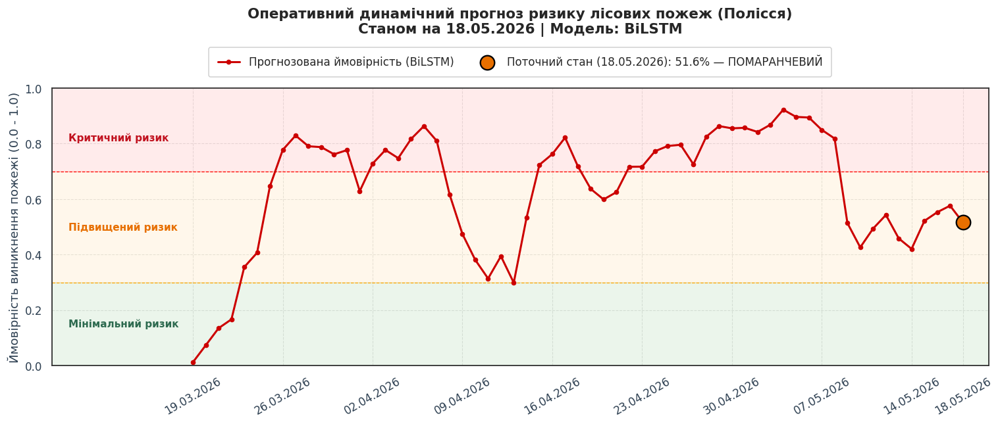


[Статистика] Розподіл прогнозних станів за останні 61 днів:
   Мінімальний ризик   :   5 днів (  8.2%)
   Підвищений ризик    :  23 днів ( 37.7%)
   Критичний ризик     :  33 днів ( 54.1%)


In [ ]:
# --- ФАЗА 5.3. Генерація оперативного прогнозу та побудова системи попередження ---

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 1. Формування вхідного масиву ознак для оперативного вікна прогнозу
feats_live = df_live_fe_scaled[FEATURE_COLS].values.astype(np.float32)
dates_arr  = df_live_fe_scaled['date'].values

X_live, dates_out = [], []
for i in range(TIME_STEPS, len(feats_live)):
    X_live.append(feats_live[i - TIME_STEPS:i])
    dates_out.append(dates_arr[i])

if not X_live:
    raise RuntimeError(f'[Помилка] Недостатній обсяг даних для формування часового вікна (потрібно >= {TIME_STEPS} днів).')

# Трансформація у 3D-тензор для архітектури BiLSTM
X_live = np.stack(X_live).astype(np.float32)

# Прямий хід нейромережі (Inference) для отримання ймовірнісних оцінок
proba_all = model.predict(X_live, verbose=0).flatten()

# 2. Фільтрація прогнозу для виділення оперативного періоду моніторингу
forecast_df = pd.DataFrame({
    'date':        pd.to_datetime(dates_out),
    'probability': proba_all,
})
live_start = region_live_df['date'].min()
forecast_df = forecast_df[forecast_df['date'] >= live_start].reset_index(drop=True)
forecast_df['risk_level'] = forecast_df['probability'].apply(lambda p: get_risk_level(p)[0])

if not forecast_df.empty:
    # --- 3. Екстракція та вивід поточного статусу небезпеки ---
    latest = forecast_df.iloc[-1]
    latest_prob = latest['probability']
    risk_id, risk_color, risk_name = get_risk_level(latest_prob)

    print("-" * 60)
    print(" МОНІТОРИНГ ПОЖЕЖНОЇ НЕБЕЗПЕКИ (РЕГІОН: ПОЛІССЯ)")
    print(f" Розрахункова дата: {latest['date'].strftime('%d.%m.%Y')}")
    print("-" * 60)
    print(f" Прогнозована ймовірність виникнення: {latest_prob:.2%}")
    print(f" Встановлений рівень ризику:          {risk_name}")
    print("-" * 60)

    # --- 4. Побудова графічної моделі динамічного прогнозу ---
    fig, ax = plt.subplots(figsize=(14, 6))

    # Візуальне зонування координатної площини за рівнями ризику (Background Spans)
    ax.axhspan(0.00, 0.30, color='green', alpha=0.08)
    ax.axhspan(0.30, 0.70, color='orange', alpha=0.08)
    ax.axhspan(0.70, 1.00, color='red', alpha=0.08)

    ax.axhline(0.30, color='orange', lw=0.8, linestyle='--')
    ax.axhline(0.70, color='red',    lw=0.8, linestyle='--')

    # Побудова лінії тренду прогнозу (насичений червоний колір)
    ax.plot(forecast_df['date'], forecast_df['probability'],
            color='#CC0000', lw=2, marker='o', markersize=4,
            label='Прогнозована ймовірність (BiLSTM)')

    # Окреме контрастне маркування поточної розрахункової точки
    ax.scatter([latest['date']], [latest_prob],
               color=risk_color, s=200, zorder=10,
               label=f'Поточний стан ({latest["date"].strftime("%d.%m.%Y")}): {latest_prob:.1%} — {risk_name}',
               edgecolors='black', lw=1.5)

    # Розрахунок геометрії меж осей для безпечного розміщення тексту
    start_date = forecast_df['date'].min()
    end_date = forecast_df['date'].max()

    # Створення лівого буферного простору для захисту від накладання тексту на криву
    margin_left = pd.Timedelta(days=11)
    margin_right = pd.Timedelta(days=2)
    ax.set_xlim(start_date - margin_left, end_date + margin_right)

    # Анотування зон небезпеки у створеному буферному просторі
    text_x = start_date - pd.Timedelta(days=9.7)
    ax.text(text_x, 0.15, 'Мінімальний ризик', fontsize=10, color='#2d6a4f', fontweight='bold', va='center')
    ax.text(text_x, 0.50, 'Підвищений ризик', fontsize=10, color='#e76f00', fontweight='bold', va='center')
    ax.text(text_x, 0.82, 'Критичний ризик', fontsize=10, color='#c1121f', fontweight='bold', va='center')

    # Оформлення координатної сітки та заголовка дашборду
    ax.set_ylim(0, 1)
    ax.set_ylabel('Ймовірність виникнення пожежі (0.0 - 1.0)', fontsize=12)
    ax.set_title(
        f'Оперативний динамічний прогноз ризику лісових пожеж (Полісся)\n'
        f'Станом на {latest["date"].strftime("%d.%m.%Y")} | Модель: BiLSTM',
        fontsize=14, fontweight='bold', pad=55
    )

    ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.02), ncol=2, fontsize=11, framealpha=0.9)

    # --- 5. Динамічне форматування кроку часової осі (X-axis) ---
    # Забезпечує оптимальну щільність міток (не більше 8-9 підписів на графік)
    n_ticks = 8
    step = max(1, len(forecast_df) // n_ticks)

    actual_dates = list(forecast_df['date'].iloc[::step])

    # Гарантоване примусове додавання фінальної (поточної) дати на часову вісь
    if forecast_df['date'].iloc[-1] not in actual_dates:
        actual_dates.append(forecast_df['date'].iloc[-1])

    ax.set_xticks(actual_dates)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%Y'))
    plt.xticks(rotation=30)

    # Збереження результатів у високій якості та вивід на екран
    plt.tight_layout()
    plt.savefig(f'{PROJECT_DIR}/dynamic_forecast.png', dpi=150, bbox_inches='tight')
    plt.show()

    # 6. Вивід статистичного розподілу станів тривоги за розрахований період моніторингу
    risk_counts = forecast_df['risk_level'].value_counts().sort_index()
    risk_labels = {0: 'Мінімальний ризик', 1: 'Підвищений ризик', 2: 'Критичний ризик'}

    print(f'\n[Статистика] Розподіл прогнозних станів за останні {len(forecast_df)} днів:')
    for lvl, cnt in risk_counts.items():
        pct = (cnt / len(forecast_df)) * 100
        print(f'   {risk_labels[lvl]:<20}: {cnt:>3} днів ({pct:>5.1f}%)')
else:
    print('[Помилка] Після фільтрації за початковою датою масив оперативних прогнозів порожній.')